In [1]:
import time
import torch
import json
import random
import math
import warnings
import torchvision
import os
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import torchvision.models as models

from pathlib import Path
from datetime import datetime
from tqdm import tqdm
from PIL import Image
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances_argmin_min, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, precision_recall_fscore_support
from sklearn.model_selection import train_test_split, StratifiedKFold
from torch.utils.data import Subset, Dataset, DataLoader
from torchvision.models import EfficientNet
from torchvision.datasets import ImageFolder

# Suppress all warnings
warnings.filterwarnings("ignore")

In [2]:
# Hyperparameters
learning_rate = 0.0005 # 0.096779
epochs = 200
epochs_pretrain = 3
epochs_optimal_lr = 3
patience = 6
momentum = 0.9
step_size = 30
gamma = 0.1
batch_size = 64
num_workers = 4

# list of lambda values to loop through for grid search
epsilon = 0.05
margin = 0.01
lambda_factor_list = [0,50,150,200,100]

# labels used including for plotting
class_labels = [0, 1, 3, 4, 6, 7, 11, 15, 17, 18, 19, 20, 22, 25, 27, 28, 30, 31, 33, 35, 36, 37, 39, 43, 44, 50, 51, 54, 57, 58]
class_labels_new = torch.tensor([i for i in range(len(class_labels))])
num_classes = 16
class_names_new = [f"Class {label}" for label in range(num_classes)]


In [3]:
# set device to cuda if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Check if CUDA is available
cuda_available = torch.cuda.is_available()

# Count the number of GPUs available
num_gpus = torch.cuda.device_count()

print("CUDA Available:", cuda_available)
print("Number of GPUs:", num_gpus)

torch.cuda.empty_cache()

CUDA Available: True
Number of GPUs: 1


In [4]:
# Assuming your JSON file is named 'your_file.json'
file_path = './WIDER/Annotations/wider_attribute_trainval.json'

with open(file_path, 'r') as file:
    # Load the JSON data from the file
    data = json.load(file)

class_idx = data['scene_id_map']

In [5]:
new_label_mapping = {
    0: "Team_Sports",
    1: "Celebration",
    2: "Parade",
    3: "Waiter_Or_Waitress",
    4: "Individual_Sports",
    5: "Surgeons",
    6: "Spa",
    7: "Law_Enforcement",
    8: "Business",
    9: "Dresses",
    10: "Water_Activities",
    11: "Picnic",
    12: "Rescue",
    13: "Cheering",
    14: "Performance_And_Entertainment",
    15: "Family"
}

# Ensure that all 16 new classes are covered
# If some classes are not explicitly mentioned in new_label_mapping, add them
for i in range(num_classes):
    if i not in new_label_mapping:
        new_label_mapping[i] = "Additional Category {}".format(i)

class_idx = new_label_mapping

In [6]:
class DataSet(Dataset):
    def __init__(self, ann_files, augs, img_size, dataset):

        # Create a mapping from old labels to new labels
        self.label_mapping = {old_label: new_label for new_label, old_label in enumerate(sorted(class_labels))}

        self.new_label_mapping = {
            0: 2,  # Parade
            1: 8,  # Business
            2: 7,  # Law Enforcement
            3: 14,  # Performance and Entertainment
            4: 1,  # Celebration
            5: 13,  # Cheering
            6: 8,  # Business
            7: 8,  # Business
            8: 1,  # Celebration
            9: 14,  # Performance and Entertainment
            10: 15, # Family
            11: 15, # Family
            12: 11, # Picnic
            13: 7, # Law Enforcement
            14: 6, # Spa
            15: 13, # Cheering
            16: 5, # Surgeons
            17: 3, # Waiter or Waitress
            18: 4, # Individual Sports
            19: 0, # Team Sports
            20: 0, # Team Sports
            21: 0, # Team Sports
            22: 4, # Individual Sports
            23: 10, # Water Activities
            24: 4, # Individual Sports
            25: 1, # Celebration
            26: 9, # Dresses
            27: 12, # Rescue
            28: 10,# Water Activities
            29: 0  # Team Sports
        }

        self.dataset = dataset
        self.ann_files = ann_files
        self.augment = self.augs_function(augs, img_size)
        # Initialize transformations directly
        self.transform = transforms.Compose(
            [
                transforms.ToTensor(),
                transforms.Normalize(mean=[0, 0, 0], std=[1, 1, 1])
            ] 
        )
        if self.dataset == "wider":
            self.transform = transforms.Compose(
                [
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])                ] 
            )        

        self.anns = []
        self.load_anns()
        print(self.augment)

    def augs_function(self, augs, img_size):            
        t = []
        if 'randomflip' in augs:
            t.append(transforms.RandomHorizontalFlip())
        if 'ColorJitter' in augs:
            t.append(transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0))
        if 'resizedcrop' in augs:
            t.append(transforms.RandomResizedCrop(img_size, scale=(0.7, 1.0)))
        if 'RandAugment' in augs:
            t.append(transforms.RandAugment())

        t.append(transforms.Resize((img_size, img_size)))

        return transforms.Compose(t)
    
    def load_anns(self):
        self.anns = []
        for ann_file in self.ann_files:
            json_data = json.load(open(ann_file, "r"))
            self.anns += json_data

    def __len__(self):
        return len(self.anns)

    def __getitem__(self, idx):
        # Make sure the index is within bounds
        idx = idx % len(self)
        ann = self.anns[idx]
        
        try:
            # Attempt to open the image file
            img = Image.open(f'WIDER/Image/{ann["file_name"]}').convert("RGB")

            # If this is the wider dataset, proceed with specific processing
            # x, y, w, h = ann['bbox']
            # img_area = img.crop([x, y, x+w, y+h])
            img_area = self.augment(img)
            img_area = self.transform(img_area)
            attributes_list = [target['attribute'] for target in ann['targets']]
            num_people = len(attributes_list)
            attributes_distribution = [max(sum(attribute), 0)/num_people for attribute in zip(*attributes_list)]
            # Extract label from image path
            img_path = f'WIDER/Image/{ann["file_name"]}'
            label = self.extract_label(img_path)  # You might need to implement this method
            
            return {
                "label": label,
                "target": torch.tensor([attributes_distribution[0]], dtype=torch.float32),
                "img": img_area
            }
            
        except Exception as e:
            # If any error occurs during the processing of an image, log the error and the index
            print(f"Error processing image at index {idx}: {e}")
            # Instead of returning None, raise the exception
            raise

    def extract_label(self, img_path):
        original_label = None
    
        if "WIDER/Image/train" in img_path:
            label_str = img_path.split("WIDER/Image/train/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "WIDER/Image/test" in img_path:
            label_str = img_path.split("WIDER/Image/test/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "WIDER/Image/val" in img_path:  # Handle validation images
            label_str = img_path.split("WIDER/Image/val/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
    
        if original_label is not None:
            remapped_label = self.label_mapping[original_label]
            new_label_mapping = self.new_label_mapping[remapped_label]
            return new_label_mapping
        else:
            raise ValueError(f"Label could not be extracted from path: {img_path}")


In [7]:
train_file = ['data/wider/trainval_wider.json']
test_file = ['data/wider/test_wider.json']


In [8]:
def custom_collate(batch):
    # Filter out any None items in the batch
    batch = [item for item in batch if item is not None]
    # If after filtering the batch is empty, handle this case by either returning an empty tensor or raising an exception
    if len(batch) == 0:
        raise ValueError("Batch is empty after filtering out None items.")
    return torch.utils.data.dataloader.default_collate(batch)


In [9]:
# train_dataset = DataSet(train_file, augs = ['RandAugment'], img_size = 226, dataset = 'wider')
train_dataset = DataSet(train_file, augs = [], img_size = 226, dataset = 'wider')
test_dataset = DataSet(test_file, augs = [], img_size = 226, dataset = 'wider')

trainloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, 
                         num_workers=num_workers, collate_fn=custom_collate)
testloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=custom_collate)


Compose(
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)
Compose(
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)


In [11]:
def one_hot_encode(labels, num_classes):
    return np.eye(num_classes)[labels]

def calculate_recall_multiclass(conf_matrix):
    recalls = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)
    recalls[np.isnan(recalls)] = 0  # Replace NaN with 0
    return recalls

def evaluate_model_with_gender_multiclass(pred, label, gender, num_classes):
    predictions = pred.cpu()
    true_labels = label.cpu()
    gender = gender.cpu()

    # Identify male and female indices based on the gender threshold
    male_indices = np.where(gender >= 0.5)[0]
    female_indices = np.where(gender < 0.5)[0]

    # Convert labels to one-hot encoding
    one_hot_labels = one_hot_encode(true_labels, num_classes=num_classes)
    one_hot_preds = one_hot_encode(predictions, num_classes=num_classes)

    # Initialize recall arrays
    male_recall = np.zeros(num_classes)
    female_recall = np.zeros(num_classes)

    # Extract predictions and labels for male and female indices
    male_predictions = np.argmax(one_hot_preds[male_indices], axis=1)
    female_predictions = np.argmax(one_hot_preds[female_indices], axis=1)
    male_labels = np.argmax(one_hot_labels[male_indices], axis=1)
    female_labels = np.argmax(one_hot_labels[female_indices], axis=1)

    # Check if the class labels are within the expected range
    assert (0 <= male_predictions.min() < num_classes) and (0 <= male_predictions.max() < num_classes), "Invalid class indices in male predictions"
    assert (0 <= female_predictions.min() < num_classes) and (0 <= female_predictions.max() < num_classes), "Invalid class indices in female predictions"
    assert (0 <= male_labels.min() < num_classes) and (0 <= male_labels.max() < num_classes), "Invalid class indices in male labels"
    assert (0 <= female_labels.min() < num_classes) and (0 <= female_labels.max() < num_classes), "Invalid class indices in female labels"

    # Calculate confusion matrices for each gender
    male_conf_matrix = confusion_matrix(male_labels, male_predictions, labels=np.arange(num_classes))
    female_conf_matrix = confusion_matrix(female_labels, female_predictions, labels=np.arange(num_classes))

    # Calculate recall for each class and gender
    male_recall[:len(male_conf_matrix)] = calculate_recall_multiclass(male_conf_matrix)
    female_recall[:len(female_conf_matrix)] = calculate_recall_multiclass(female_conf_matrix)

    return male_recall - female_recall, male_conf_matrix, female_conf_matrix


In [12]:
class Critic(nn.Module):
    def __init__(self, input_size, hidden_size=256):
        super(Critic, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, 1)  # Outputting a single value for bias

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = torch.sigmoid(self.fc2(x))
        return x
        

In [13]:
def train_model(actor, actor_optimizer, actor_loss_fn, critic, critic_optimizer, critic_loss_fn,
               lambda_factor, epsilon, margin, patience, epochs, device, base_save_dir):
    train_accuracies = []
    train_disparities = []
    train_mean_non_zero_abs_disparities = []
    train_losses = []
    train_main_losses = []
    train_critic_losses = []
    val_accuracies = []
    val_disparities = []
    val_mean_non_zero_abs_disparities = []
    val_losses = []
    val_main_losses = []
    val_critic_losses = []
    
    patience_counter = 0 
    best_val_accuracy = 0
    best_val_loss = float('inf')
    best_val_mean_abs_disparity = 0
    best_model_state = None

    # Create a subdirectory for the current lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'lambda_{lambda_factor}')
    os.makedirs(lambda_dir, exist_ok=True)
    
    # Training and Validation Loop
    for epoch in range(epochs):
        # Initialize metrics for each epoch
        epoch_train_disparities = []
        epoch_train_losses = []
        epoch_train_accuracies = []
        epoch_val_disparities = []
        epoch_val_losses = []
        epoch_val_accuracies = []
    
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        total_val_loss = 0.0
        num_batches = 0
        
        # Training
        actor.train()
        for batch_data in tqdm(trainloader, desc=f'Epoch {epoch+1}/{epochs}, Training'):
            # Load data to device
            images = batch_data["img"].to(device)
            labels = batch_data["label"].to(device)
            gender_scores = batch_data["target"].to(device)
    
            # Forward pass through actor
            actor_output = actor(images)
            class_predictions = torch.argmax(actor_output, dim=1)
    
            # Compute bias
            total_samples += labels.size(0)
            total_correct += (class_predictions == labels).sum().item()
            num_batches += 1
            recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
            confusion_male += recall_diff[1]
            confusion_female += recall_diff[2]
            bias = np.mean(recall_diff[0])
            bias_mean = torch.tensor([bias], device=device, dtype=torch.float32)
    
            critic_optimizer.zero_grad()
            
            for param in critic.parameters():
                param.requires_grad = True
            for param in actor.parameters():
                param.requires_grad = False
                
            critic.train()
            actor.eval()
            
            critic_output = critic(actor_output)
            critic_loss = critic_loss_fn(critic_output, bias_mean)
            critic_loss.backward(retain_graph=True)
    
            critic_optimizer.step()
    
            for param in critic.parameters():
                param.requires_grad = False
            for param in actor.parameters():
                param.requires_grad = True
                
            actor.train()
            critic.eval()
    
            actor_optimizer.zero_grad()
    
            critic_output = critic(actor_output)
            main_loss = actor_loss_fn(actor_output, labels)
    
            combined_loss = max(1, lambda_factor * (abs(critic_output[0][0]) - epsilon + margin) + 1) * main_loss
    
            combined_loss.backward(retain_graph=True)
            actor_optimizer.step()
    
            # Calculate and accumulate metrics
            accuracy = (class_predictions == labels).float().mean().item()
            epoch_train_accuracies.append(accuracy)
            epoch_train_disparities.append(bias)
        
            # Record the losses
            epoch_train_losses.append((combined_loss.item(), main_loss.item(), critic_loss.item()))
    
        confusion_male /= num_batches
        confusion_female /= num_batches
    
        # Calculate training metrics for the epoch
        train_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
        train_non_zero_abs_values = np.abs(train_epoch_disparity[train_epoch_disparity != 0])
        
        # Store average training metrics for the epoch
        train_accuracy = np.mean(epoch_train_accuracies)
        train_disparity = np.mean(epoch_train_disparities)
        train_mean_non_zero_abs_disparity = np.mean(train_non_zero_abs_values)
        train_combined_loss = np.mean([x[0] for x in epoch_train_losses])
        train_main_loss = np.mean([x[1] for x in epoch_train_losses])
        train_critic_loss = np.mean([x[2] for x in epoch_train_losses])
    
        train_accuracies.append(train_accuracy)
        train_disparities.append(train_disparity)
        train_mean_non_zero_abs_disparities.append(train_mean_non_zero_abs_disparity)
        train_losses.append(train_combined_loss)
        train_main_losses.append(train_main_loss)
        train_critic_losses.append(train_critic_loss)
    
        # Validation Phase
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        num_batches = 0
        
        actor.eval()
        with torch.no_grad():
            for batch_data in tqdm(testloader, desc=f'Epoch {epoch+1}/{epochs}, Validation'):
                # Load data to device
                images = batch_data["img"].to(device)
                labels = batch_data["label"].to(device)
                gender_scores = batch_data["target"].to(device)
        
                # Forward pass
                actor_output = actor(images)
                val_critic_output = critic(actor_output)
                class_predictions = torch.argmax(actor_output, dim=1)
        
                # Calculate and accumulate validation metrics
                accuracy = (class_predictions == labels).float().mean().item()
    
                # Compute bias
                num_batches += 1
                recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
                confusion_male += recall_diff[1]
                confusion_female += recall_diff[2]
                
                # Calculate validation losses (similar to training losses)
                batch_bias = np.mean(recall_diff[0])
                mean_batch_bias = torch.tensor([batch_bias], device=device, dtype=torch.float32)
                val_main_loss = actor_loss_fn(actor_output, labels)
                val_critic_loss = critic_loss_fn(val_critic_output, mean_batch_bias)
        
                val_combined_loss = max(1, lambda_factor * (abs(val_critic_output[0][0]) - epsilon + margin) + 1) * val_main_loss
    
                epoch_val_accuracies.append(accuracy)
                epoch_val_losses.append((val_combined_loss.item(), val_main_loss.item(), val_critic_loss.item()))
                
            confusion_male /= num_batches
            confusion_female /= num_batches
    
            val_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
            val_non_zero_abs_values = np.abs(val_epoch_disparity[val_epoch_disparity != 0])
    
            # Store average training metrics for the epoch
            val_accuracy = np.mean(epoch_val_accuracies)
            val_disparity = np.mean(epoch_val_disparities)
            val_mean_non_zero_abs_disparity = np.mean(val_non_zero_abs_values)
            val_combined_loss = np.mean([x[0] for x in epoch_val_losses])
            val_main_loss = np.mean([x[1] for x in epoch_val_losses])
            val_critic_loss = np.mean([x[2] for x in epoch_val_losses])
        
            val_accuracies.append(val_accuracy)
            val_disparities.append(val_disparity)
            val_mean_non_zero_abs_disparities.append(val_mean_non_zero_abs_disparity)
            val_losses.append(val_combined_loss)
            val_main_losses.append(val_main_loss)
            val_critic_losses.append(val_critic_loss)

            # Check if current validation combined loss is lower than the best combined loss
        if val_combined_loss < best_val_loss:
            best_val_loss = val_combined_loss
            best_val_accuracy = val_accuracy
            best_val_mean_non_zero_abs_disparity = val_mean_non_zero_abs_disparity
        
            # Create a mapping of class recall disparities
            class_recall_mapping = {class_name: val_epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}
        
            best_model_state = {
                'epoch': epoch,
                'actor_state_dict': actor.state_dict(),
                'critic_state_dict': critic.state_dict(),
                'optimizer_actor_state_dict': actor_optimizer.state_dict(),
                'optimizer_critic_state_dict': critic_optimizer.state_dict(),
                'best_val_loss': best_val_loss,
                'best_val_accuracy': best_val_accuracy,
                'best_val_mean_abs_disparity': best_val_mean_non_zero_abs_disparity,
                'class_recall_mapping': class_recall_mapping
            }
            save_path = os.path.join(lambda_dir, f'best_model_lambda_{lambda_factor}.pth')
            torch.save(best_model_state, save_path)
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

        print("\n" + "="*50)
        print(f"Lambda {lambda_factor} - Epoch {epoch + 1} Metrics:")
        print("-"*50)
        print(f"TRAINING Accuracy: {train_accuracy:.6f}, VALIDATION Accuracy: {val_accuracy:.4f}")
        print(f"TRAINING Disparity: {train_mean_non_zero_abs_disparity:.6f}, VALIDATION Disparity: {val_mean_non_zero_abs_disparity:.4f}")
        print(f"TRAINING Combined Loss: {train_combined_loss:.6f}, VALIDATION Combined Loss: {val_combined_loss:.4f}")
        print("-"*50 + "\n")
        # Print disparities by class label
        for class_label, recall_diff in class_recall_mapping.items():
            print(f"Class {class_label}: Val Disparity = {recall_diff}")
        print("="*50 + "\n")
      
        # Plotting
        plt.figure(figsize=(15, 10))
        
        # Plot Training and Validation Accuracy
        plt.subplot(2, 2, 1)
        plt.plot(train_accuracies, label='Training Accuracy')
        plt.plot(val_accuracies, label='Validation Accuracy')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        
        # Plot Training and Validation Disparity
        plt.subplot(2, 2, 2)
        plt.plot(train_mean_non_zero_abs_disparities, label='Training Mean Absolute Disparity')
        plt.plot(val_mean_non_zero_abs_disparities, label='Validation Mean Absolute Disparity')
        plt.title('Training and Validation Mean Absolute Disparity')
        plt.xlabel('Epoch')
        plt.ylabel('Mean Absolute Disparity')
        plt.legend()
        
        # Plot Training Loss Components, Including Combined Loss
        plt.subplot(2, 2, 3)
        plt.plot(train_losses, label='Training Combined Loss')
        plt.plot(train_main_losses, label='Training Main Loss')
        plt.plot(train_critic_losses, label='Training Critic Loss')
        plt.title('Training Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
    
        # Plot Validation Loss Components, Including Combined Loss
        plt.subplot(2, 2, 4)
        plt.plot(val_losses, label='Validation Combined Loss')
        plt.plot(val_main_losses, label='Validation Main Loss')
        plt.plot(val_critic_losses, label='Validation Critic Loss')
        plt.title('Validation Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
            
        plt.tight_layout()
        plt.show()

    best_epoch = best_model_state['epoch'] + 1 if best_model_state else epochs
    print(f"Finished Training with lambda value of {lambda_factor}. Best (stopping) epoch number: {best_epoch}")

    return best_model_state

Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]



Lambda 0 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.511960, VALIDATION Accuracy: 0.6049
TRAINING Disparity: 0.103926, VALIDATION Disparity: 0.1259
TRAINING Combined Loss: 1.606160, VALIDATION Combined Loss: 1.2551
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.039014749060332976
Class Celebration: Val Disparity = 0.03524752475247517
Class Parade: Val Disparity = 0.023674242424242653
Class Waiter_Or_Waitress: Val Disparity = -0.050782741504390994
Class Individual_Sports: Val Disparity = -0.13346598002496868
Class Surgeons: Val Disparity = -0.033998521803399795
Class Spa: Val Disparity = -0.22916666666666674
Class Law_Enforcement: Val Disparity = 0.16830985915492958
Class Business: Val Disparity = -0.049930799531566095
Class Dresses: Val Disparity = -0.5219560878243513
Class Water_Activities: Val Disparity = 0.03299978709814777
Class Picnic: Val Disparity = -0.36601307189542487
Class Rescue: Val Di

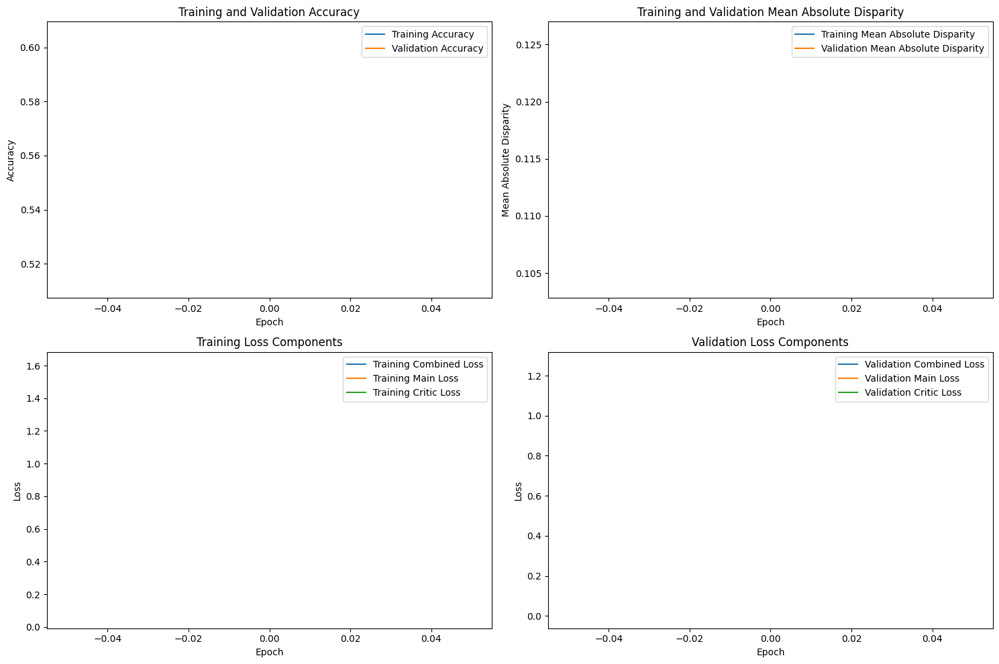

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]



Lambda 0 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.697840, VALIDATION Accuracy: 0.6365
TRAINING Disparity: 0.124191, VALIDATION Disparity: 0.1639
TRAINING Combined Loss: 0.981383, VALIDATION Combined Loss: 1.2141
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05767099656121821
Class Celebration: Val Disparity = -0.09445544554455448
Class Parade: Val Disparity = 0.02556818181818188
Class Waiter_Or_Waitress: Val Disparity = -0.03856433753340982
Class Individual_Sports: Val Disparity = -0.17532771535580516
Class Surgeons: Val Disparity = 0.10643015521064308
Class Spa: Val Disparity = -0.27083333333333326
Class Law_Enforcement: Val Disparity = 0.08755868544600942
Class Business: Val Disparity = 0.09773235388054935
Class Dresses: Val Disparity = -0.7904191616766467
Class Water_Activities: Val Disparity = 0.03023206301894843
Class Picnic: Val Disparity = -0.3856209150326797
Class Rescue: Val Disparity

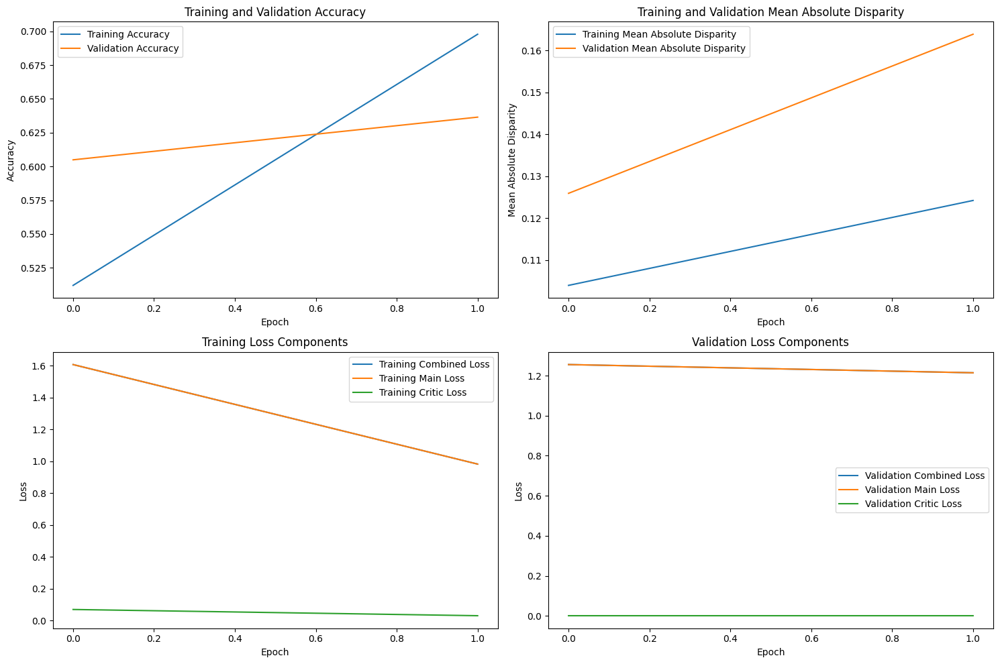

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 0 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.808854, VALIDATION Accuracy: 0.6106
TRAINING Disparity: 0.098074, VALIDATION Disparity: 0.1383
TRAINING Combined Loss: 0.611236, VALIDATION Combined Loss: 1.4390
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05767099656121821
Class Celebration: Val Disparity = -0.09445544554455448
Class Parade: Val Disparity = 0.02556818181818188
Class Waiter_Or_Waitress: Val Disparity = -0.03856433753340982
Class Individual_Sports: Val Disparity = -0.17532771535580516
Class Surgeons: Val Disparity = 0.10643015521064308
Class Spa: Val Disparity = -0.27083333333333326
Class Law_Enforcement: Val Disparity = 0.08755868544600942
Class Business: Val Disparity = 0.09773235388054935
Class Dresses: Val Disparity = -0.7904191616766467
Class Water_Activities: Val Disparity = 0.03023206301894843
Class Picnic: Val Disparity = -0.3856209150326797
Class Rescue: Val Disparity

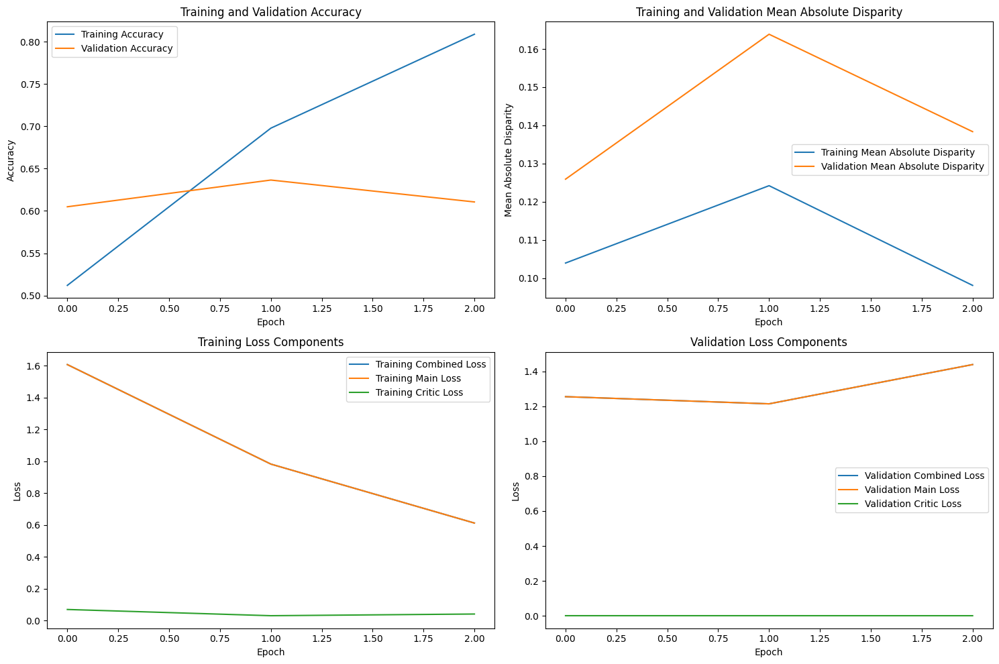

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 0 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.876775, VALIDATION Accuracy: 0.6134
TRAINING Disparity: 0.056513, VALIDATION Disparity: 0.1456
TRAINING Combined Loss: 0.388871, VALIDATION Combined Loss: 1.4714
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05767099656121821
Class Celebration: Val Disparity = -0.09445544554455448
Class Parade: Val Disparity = 0.02556818181818188
Class Waiter_Or_Waitress: Val Disparity = -0.03856433753340982
Class Individual_Sports: Val Disparity = -0.17532771535580516
Class Surgeons: Val Disparity = 0.10643015521064308
Class Spa: Val Disparity = -0.27083333333333326
Class Law_Enforcement: Val Disparity = 0.08755868544600942
Class Business: Val Disparity = 0.09773235388054935
Class Dresses: Val Disparity = -0.7904191616766467
Class Water_Activities: Val Disparity = 0.03023206301894843
Class Picnic: Val Disparity = -0.3856209150326797
Class Rescue: Val Disparity

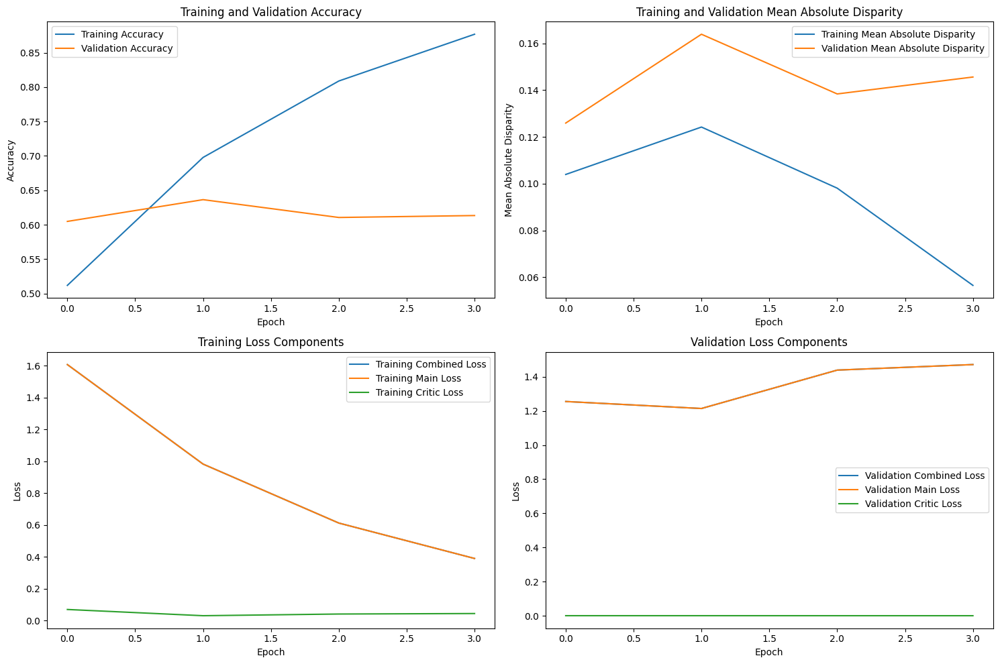

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 0 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.916628, VALIDATION Accuracy: 0.6219
TRAINING Disparity: 0.036954, VALIDATION Disparity: 0.1384
TRAINING Combined Loss: 0.257636, VALIDATION Combined Loss: 1.7454
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05767099656121821
Class Celebration: Val Disparity = -0.09445544554455448
Class Parade: Val Disparity = 0.02556818181818188
Class Waiter_Or_Waitress: Val Disparity = -0.03856433753340982
Class Individual_Sports: Val Disparity = -0.17532771535580516
Class Surgeons: Val Disparity = 0.10643015521064308
Class Spa: Val Disparity = -0.27083333333333326
Class Law_Enforcement: Val Disparity = 0.08755868544600942
Class Business: Val Disparity = 0.09773235388054935
Class Dresses: Val Disparity = -0.7904191616766467
Class Water_Activities: Val Disparity = 0.03023206301894843
Class Picnic: Val Disparity = -0.3856209150326797
Class Rescue: Val Disparity

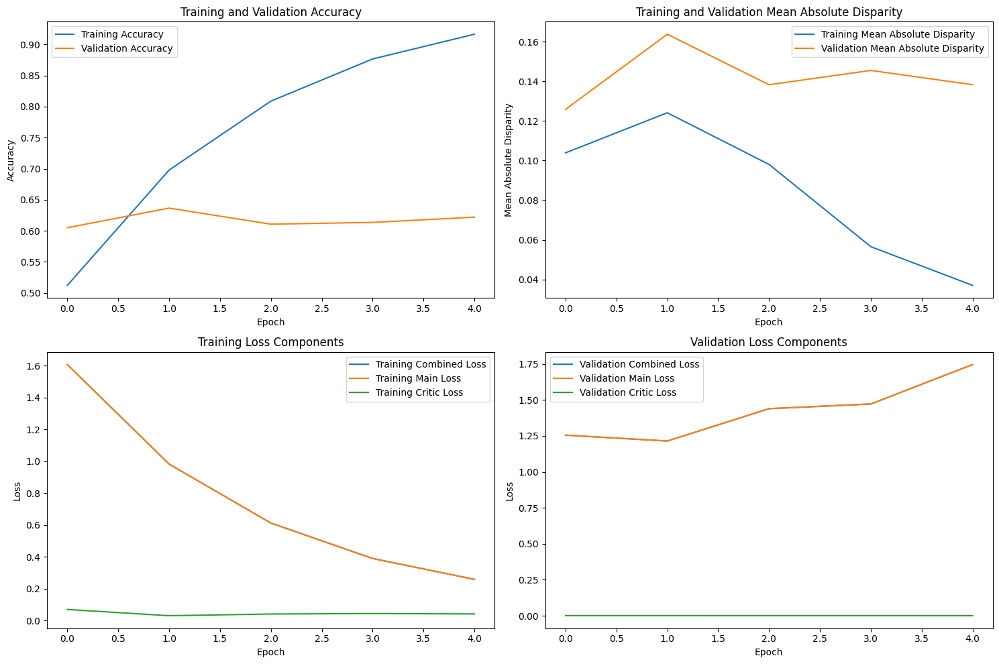

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.27it/s]



Lambda 0 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.934857, VALIDATION Accuracy: 0.6077
TRAINING Disparity: 0.024227, VALIDATION Disparity: 0.1665
TRAINING Combined Loss: 0.202549, VALIDATION Combined Loss: 1.8019
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05767099656121821
Class Celebration: Val Disparity = -0.09445544554455448
Class Parade: Val Disparity = 0.02556818181818188
Class Waiter_Or_Waitress: Val Disparity = -0.03856433753340982
Class Individual_Sports: Val Disparity = -0.17532771535580516
Class Surgeons: Val Disparity = 0.10643015521064308
Class Spa: Val Disparity = -0.27083333333333326
Class Law_Enforcement: Val Disparity = 0.08755868544600942
Class Business: Val Disparity = 0.09773235388054935
Class Dresses: Val Disparity = -0.7904191616766467
Class Water_Activities: Val Disparity = 0.03023206301894843
Class Picnic: Val Disparity = -0.3856209150326797
Class Rescue: Val Disparity

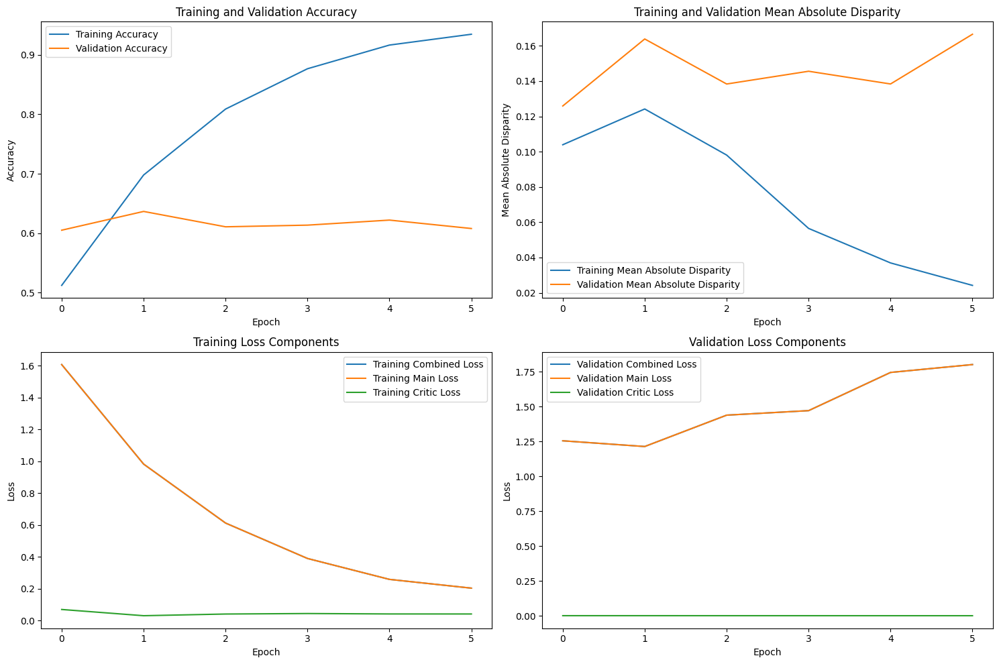

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.34it/s]



Lambda 0 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.945660, VALIDATION Accuracy: 0.6208
TRAINING Disparity: 0.044899, VALIDATION Disparity: 0.1394
TRAINING Combined Loss: 0.169644, VALIDATION Combined Loss: 1.7742
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05767099656121821
Class Celebration: Val Disparity = -0.09445544554455448
Class Parade: Val Disparity = 0.02556818181818188
Class Waiter_Or_Waitress: Val Disparity = -0.03856433753340982
Class Individual_Sports: Val Disparity = -0.17532771535580516
Class Surgeons: Val Disparity = 0.10643015521064308
Class Spa: Val Disparity = -0.27083333333333326
Class Law_Enforcement: Val Disparity = 0.08755868544600942
Class Business: Val Disparity = 0.09773235388054935
Class Dresses: Val Disparity = -0.7904191616766467
Class Water_Activities: Val Disparity = 0.03023206301894843
Class Picnic: Val Disparity = -0.3856209150326797
Class Rescue: Val Disparity

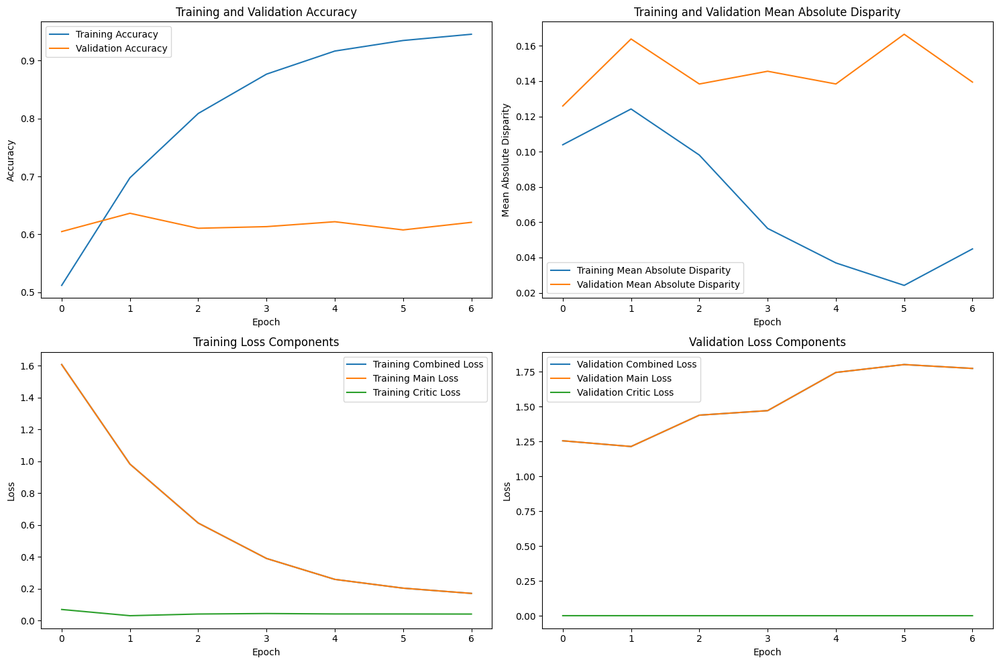

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]


Early stopping triggered at epoch 8
Finished Training with lambda value of 0. Best (stopping) epoch number: 2


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 50 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.285147, VALIDATION Accuracy: 0.2949
TRAINING Disparity: 0.025289, VALIDATION Disparity: 0.0656
TRAINING Combined Loss: 12.293409, VALIDATION Combined Loss: 2.8843
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06789594543647393
Class Celebration: Val Disparity = -0.016584158415841627
Class Parade: Val Disparity = 0.04450757575757569
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.13592384519350814
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.06431924882629103
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = -0.08982035928143713
Class Water_Activities: Val Disparity = -0.05365126676602078
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment

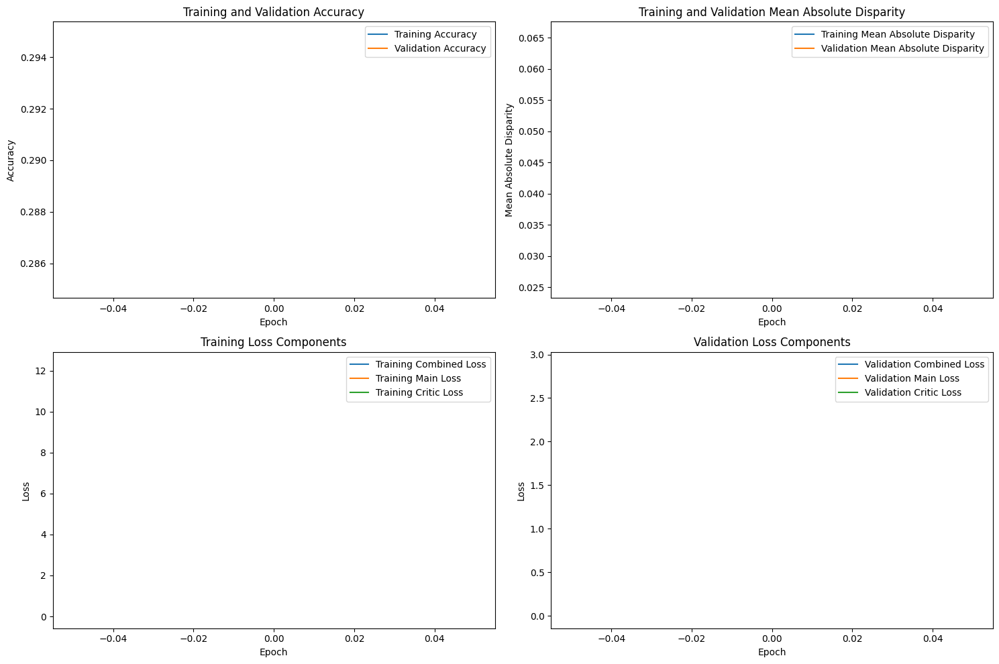

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 50 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.312828, VALIDATION Accuracy: 0.3449
TRAINING Disparity: 0.045887, VALIDATION Disparity: 0.0669
TRAINING Combined Loss: 2.577180, VALIDATION Combined Loss: 2.4764
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07917195050896264
Class Celebration: Val Disparity = 0.02193069306930695
Class Parade: Val Disparity = 0.024621212121212155
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.06015917602996251
Class Surgeons: Val Disparity = 0.048780487804878044
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.12065727699530521
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = -0.1337325349301397
Class Water_Activities: Val Disparity = -0.09058973813072169
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And

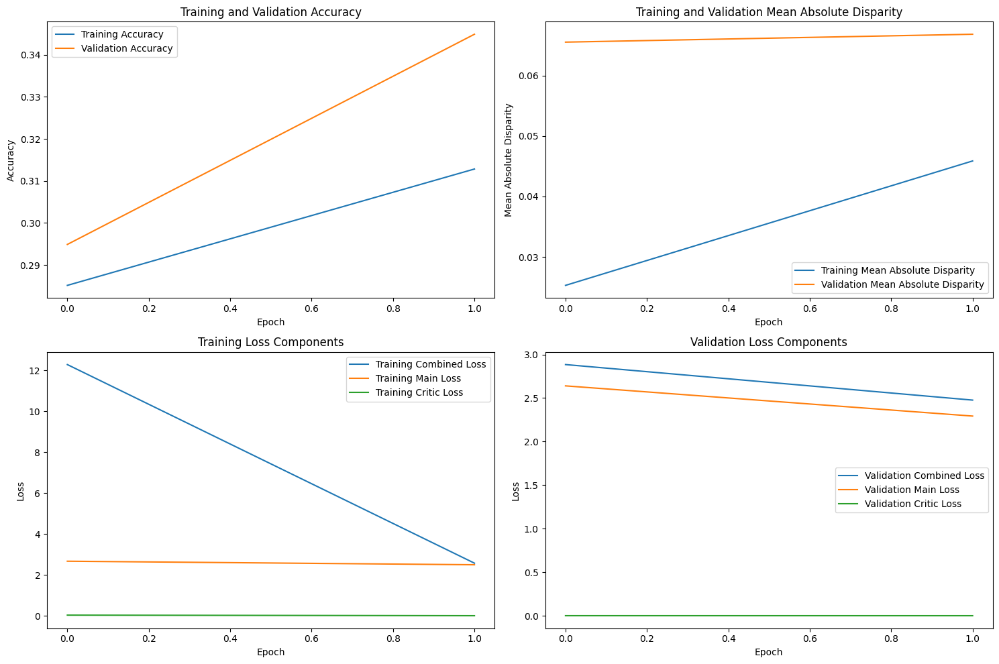

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 50 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.371393, VALIDATION Accuracy: 0.3884
TRAINING Disparity: 0.078343, VALIDATION Disparity: 0.0938
TRAINING Combined Loss: 2.264831, VALIDATION Combined Loss: 2.0652
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.10017022540585618
Class Celebration: Val Disparity = 0.08173267326732672
Class Parade: Val Disparity = 0.019886363636363757
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = -0.002340823970037431
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.12323943661971826
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = -0.22954091816367278
Class Water_Activities: Val Disparity = -0.08856717053438357
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.024331550802139036
Class Cheering: Val Disparity = 0.0
Class Performance_

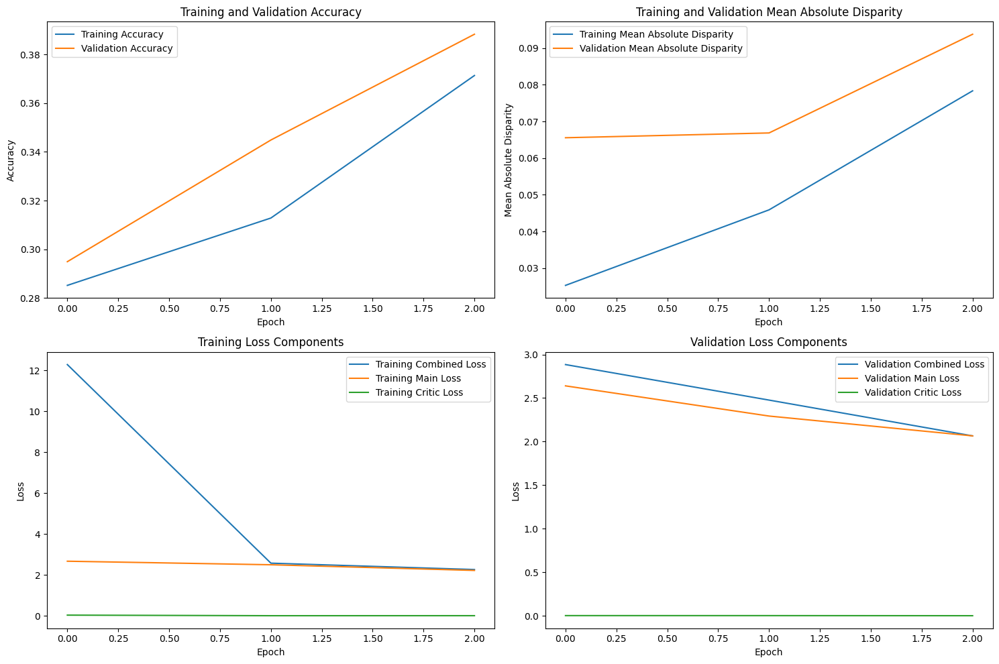

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 50 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.407253, VALIDATION Accuracy: 0.4009
TRAINING Disparity: 0.074316, VALIDATION Disparity: 0.1060
TRAINING Combined Loss: 2.051945, VALIDATION Combined Loss: 2.0118
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.10002170659537757
Class Celebration: Val Disparity = -0.033564356435643594
Class Parade: Val Disparity = -0.017045454545454475
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.059534956304619246
Class Surgeons: Val Disparity = -0.04212860310421286
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.18779342723004688
Class Business: Val Disparity = 0.009049292025976787
Class Dresses: Val Disparity = -0.5389221556886228
Class Water_Activities: Val Disparity = -0.014796678731104906
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0008021390374331541
Class Cheering: V

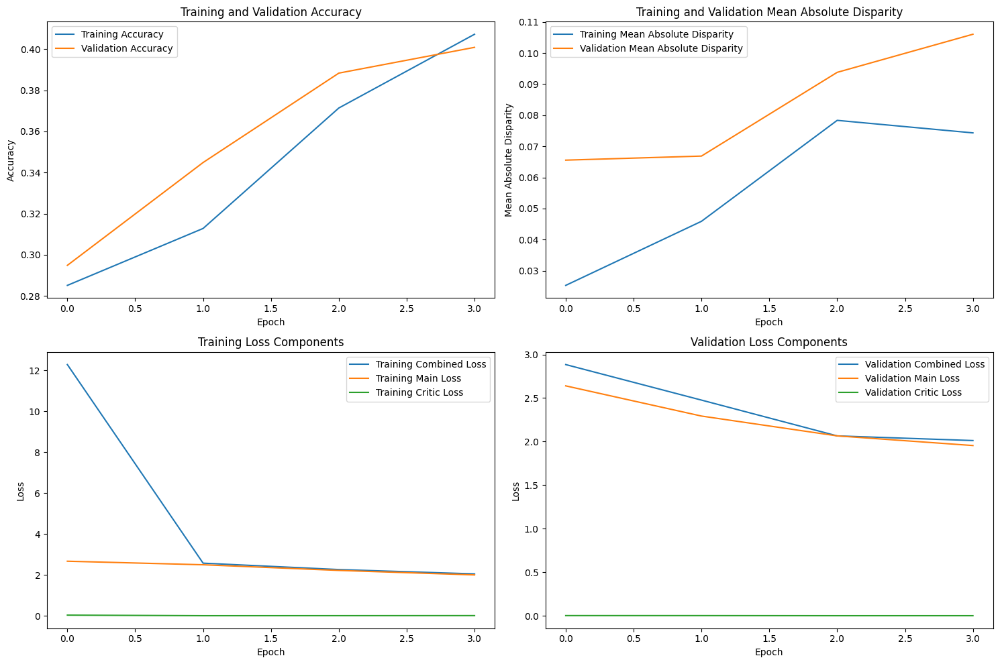

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.33it/s]



Lambda 50 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.420872, VALIDATION Accuracy: 0.4327
TRAINING Disparity: 0.074733, VALIDATION Disparity: 0.1194
TRAINING Combined Loss: 1.900828, VALIDATION Combined Loss: 1.8193
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.12156835863865378
Class Celebration: Val Disparity = 0.02643564356435646
Class Parade: Val Disparity = 0.030303030303030276
Class Waiter_Or_Waitress: Val Disparity = -0.08056510118365787
Class Individual_Sports: Val Disparity = -0.08711766541822719
Class Surgeons: Val Disparity = 0.08573540280857356
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.20117370892018765
Class Business: Val Disparity = -0.12764824869583735
Class Dresses: Val Disparity = -0.6107784431137725
Class Water_Activities: Val Disparity = -0.004577389823291478
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.022727272727272724
Clas

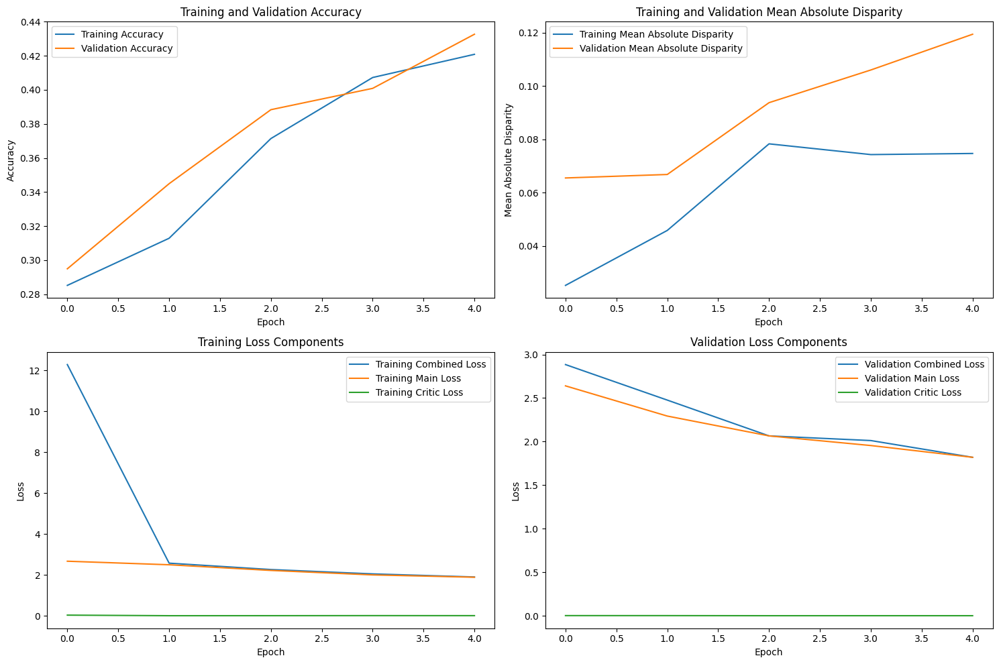

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 50 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.478492, VALIDATION Accuracy: 0.4918
TRAINING Disparity: 0.096488, VALIDATION Disparity: 0.1174
TRAINING Combined Loss: 1.708328, VALIDATION Combined Loss: 1.6605
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.12141983982817517
Class Celebration: Val Disparity = 0.006237623762376243
Class Parade: Val Disparity = 0.06912878787878785
Class Waiter_Or_Waitress: Val Disparity = -0.3302787323405879
Class Individual_Sports: Val Disparity = -0.14388264669163542
Class Surgeons: Val Disparity = 0.02586844050258691
Class Spa: Val Disparity = -0.10416666666666667
Class Law_Enforcement: Val Disparity = 0.1889671361502348
Class Business: Val Disparity = -0.04056212072820192
Class Dresses: Val Disparity = -0.622754491017964
Class Water_Activities: Val Disparity = -0.04556099638066857
Class Picnic: Val Disparity = 0.013071895424836596
Class Rescue: Val Disparit

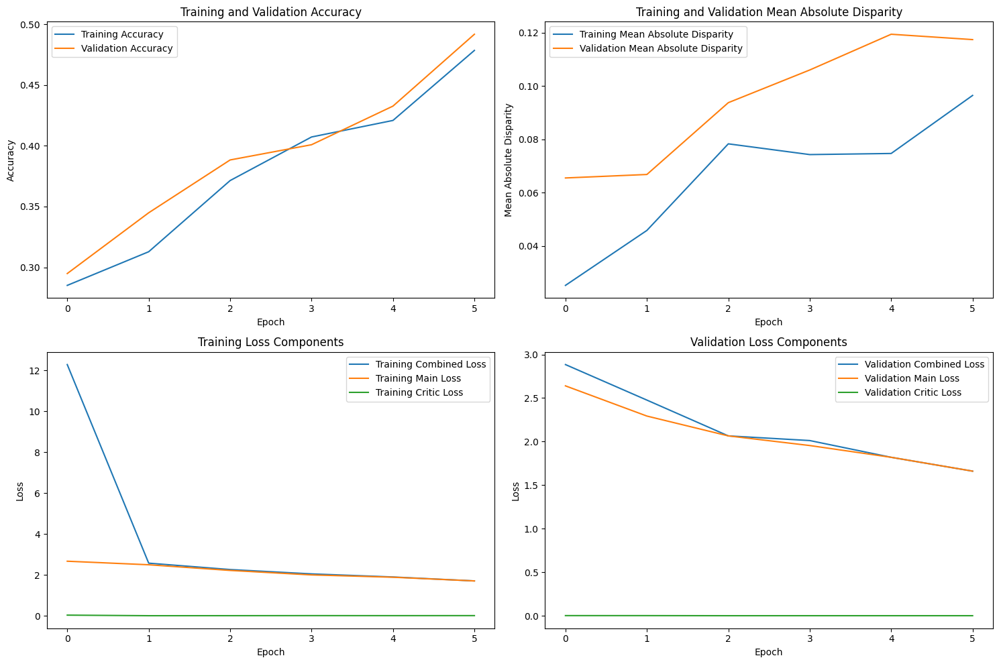

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.33it/s]



Lambda 50 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.522222, VALIDATION Accuracy: 0.5273
TRAINING Disparity: 0.110715, VALIDATION Disparity: 0.1779
TRAINING Combined Loss: 1.568997, VALIDATION Combined Loss: 1.5604
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.14281797306097277
Class Celebration: Val Disparity = 0.030841584158415813
Class Parade: Val Disparity = 0.11837121212121215
Class Waiter_Or_Waitress: Val Disparity = -0.3592974417716686
Class Individual_Sports: Val Disparity = -0.18882646691635463
Class Surgeons: Val Disparity = 0.08721359940872142
Class Spa: Val Disparity = -0.3333333333333333
Class Law_Enforcement: Val Disparity = 0.15563380281690137
Class Business: Val Disparity = 0.06664537421484079
Class Dresses: Val Disparity = -0.718562874251497
Class Water_Activities: Val Disparity = -0.004577389823291478
Class Picnic: Val Disparity = -0.24183006535947715
Class Rescue: Val Disparit

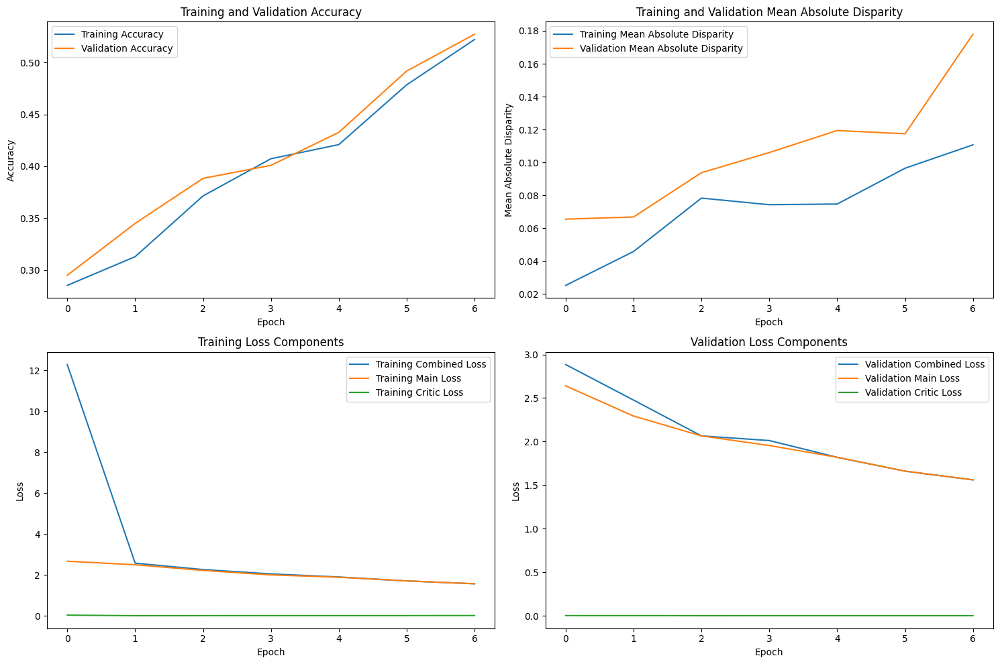

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 50 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.557793, VALIDATION Accuracy: 0.5413
TRAINING Disparity: 0.104482, VALIDATION Disparity: 0.1584
TRAINING Combined Loss: 1.451317, VALIDATION Combined Loss: 1.4954
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1364316642103941
Class Celebration: Val Disparity = -0.004158415841584162
Class Parade: Val Disparity = 0.058712121212121215
Class Waiter_Or_Waitress: Val Disparity = -0.36960672012218404
Class Individual_Sports: Val Disparity = -0.19229868913857684
Class Surgeons: Val Disparity = -0.015521064301552034
Class Spa: Val Disparity = -0.41666666666666663
Class Law_Enforcement: Val Disparity = 0.15305164319248832
Class Business: Val Disparity = 0.03183221547961246
Class Dresses: Val Disparity = -0.6227544910179641
Class Water_Activities: Val Disparity = 0.003619331488184052
Class Picnic: Val Disparity = -0.32026143790849676
Class Rescue: Val Dis

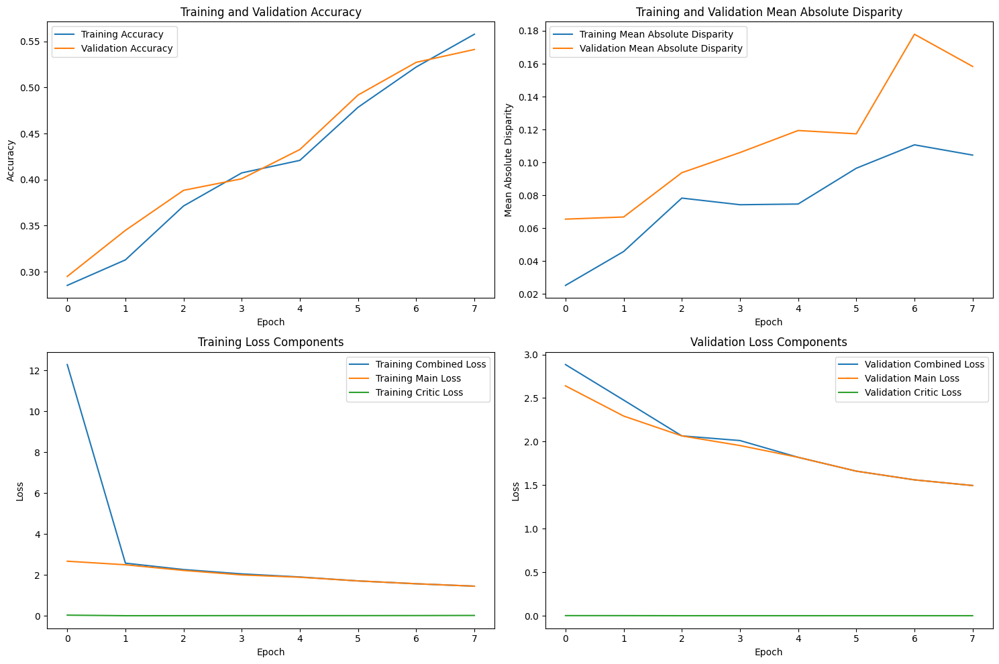

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 50 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.584742, VALIDATION Accuracy: 0.5614
TRAINING Disparity: 0.099483, VALIDATION Disparity: 0.1679
TRAINING Combined Loss: 1.355932, VALIDATION Combined Loss: 1.4316
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11817527504541259
Class Celebration: Val Disparity = 0.04594059405940587
Class Parade: Val Disparity = 0.06439393939393945
Class Waiter_Or_Waitress: Val Disparity = -0.3100420007636503
Class Individual_Sports: Val Disparity = -0.18207709113607995
Class Surgeons: Val Disparity = -0.02143385070214343
Class Spa: Val Disparity = -0.5625
Class Law_Enforcement: Val Disparity = 0.16267605633802823
Class Business: Val Disparity = 0.04993079953156604
Class Dresses: Val Disparity = -0.688622754491018
Class Water_Activities: Val Disparity = 0.005003193527783778
Class Picnic: Val Disparity = -0.19607843137254904
Class Rescue: Val Disparity = -0.062566

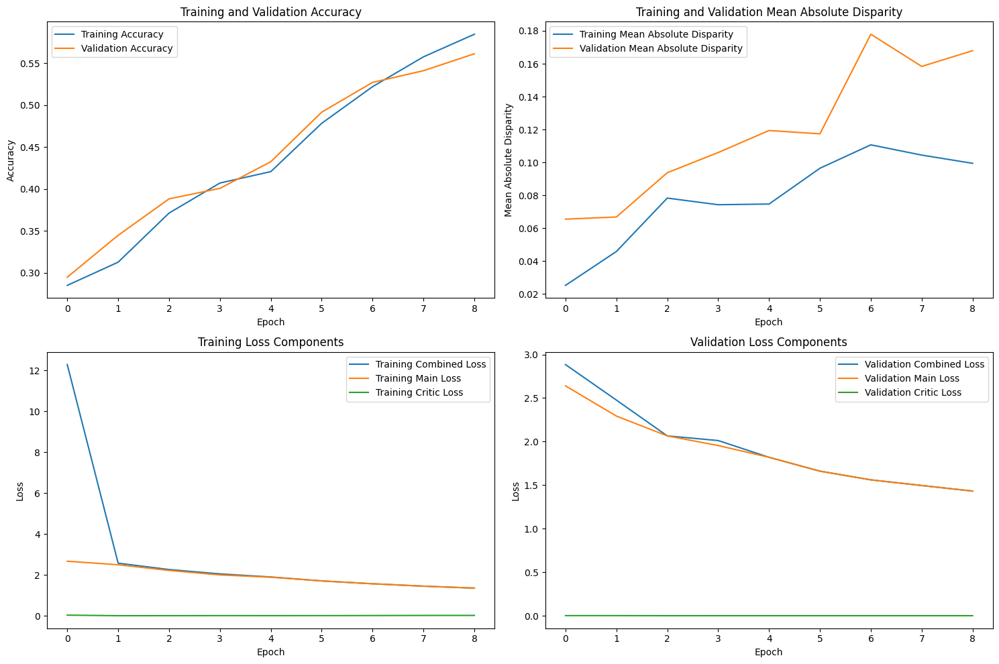

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.29it/s]



Lambda 50 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.612963, VALIDATION Accuracy: 0.5736
TRAINING Disparity: 0.125751, VALIDATION Disparity: 0.1703
TRAINING Combined Loss: 1.254121, VALIDATION Combined Loss: 1.3875
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.10535695924872335
Class Celebration: Val Disparity = 0.05024752475247518
Class Parade: Val Disparity = 0.08901515151515149
Class Waiter_Or_Waitress: Val Disparity = -0.3203512791141657
Class Individual_Sports: Val Disparity = -0.13284176029962558
Class Surgeons: Val Disparity = -0.027346637102734717
Class Spa: Val Disparity = -0.5625
Class Law_Enforcement: Val Disparity = 0.17676056338028162
Class Business: Val Disparity = 0.10028744809964862
Class Dresses: Val Disparity = -0.6467065868263473
Class Water_Activities: Val Disparity = -0.016180540770704743
Class Picnic: Val Disparity = -0.1633986928104575
Class Rescue: Val Disparity = -0.085

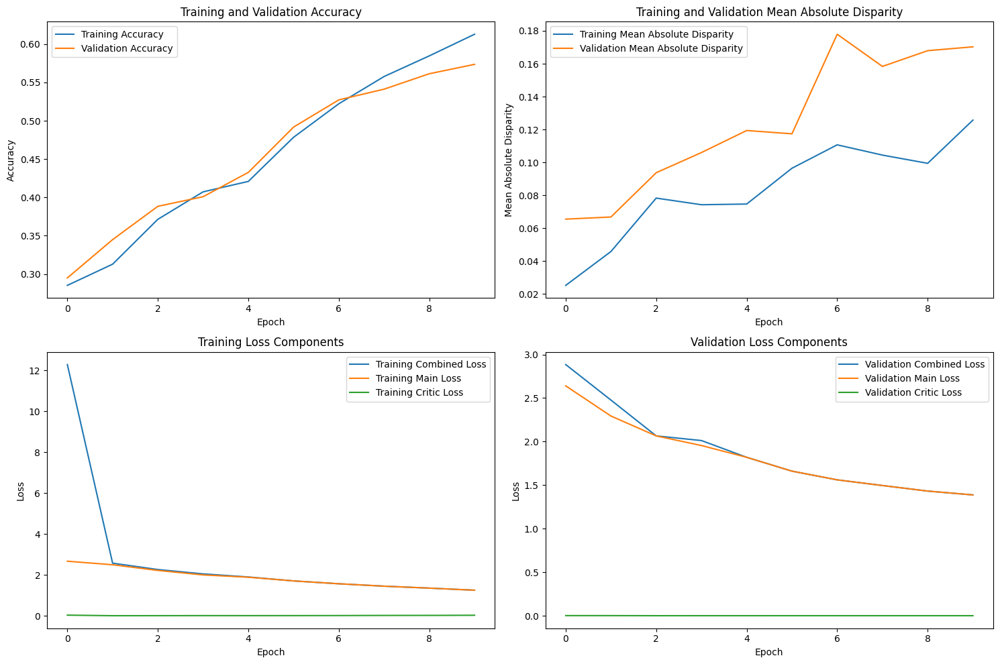

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]



Lambda 50 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.645235, VALIDATION Accuracy: 0.5898
TRAINING Disparity: 0.118898, VALIDATION Disparity: 0.1777
TRAINING Combined Loss: 1.161724, VALIDATION Combined Loss: 1.3514
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.12785184677428563
Class Celebration: Val Disparity = 0.029851485148514767
Class Parade: Val Disparity = 0.07007575757575768
Class Waiter_Or_Waitress: Val Disparity = -0.1680030546009929
Class Individual_Sports: Val Disparity = -0.14489700374531844
Class Surgeons: Val Disparity = 0.02143385070214332
Class Spa: Val Disparity = -0.6666666666666666
Class Law_Enforcement: Val Disparity = 0.16267605633802823
Class Business: Val Disparity = 0.08953475992760579
Class Dresses: Val Disparity = -0.718562874251497
Class Water_Activities: Val Disparity = -0.00936768149882905
Class Picnic: Val Disparity = -0.29411764705882354
Class Rescue: Val Disparit

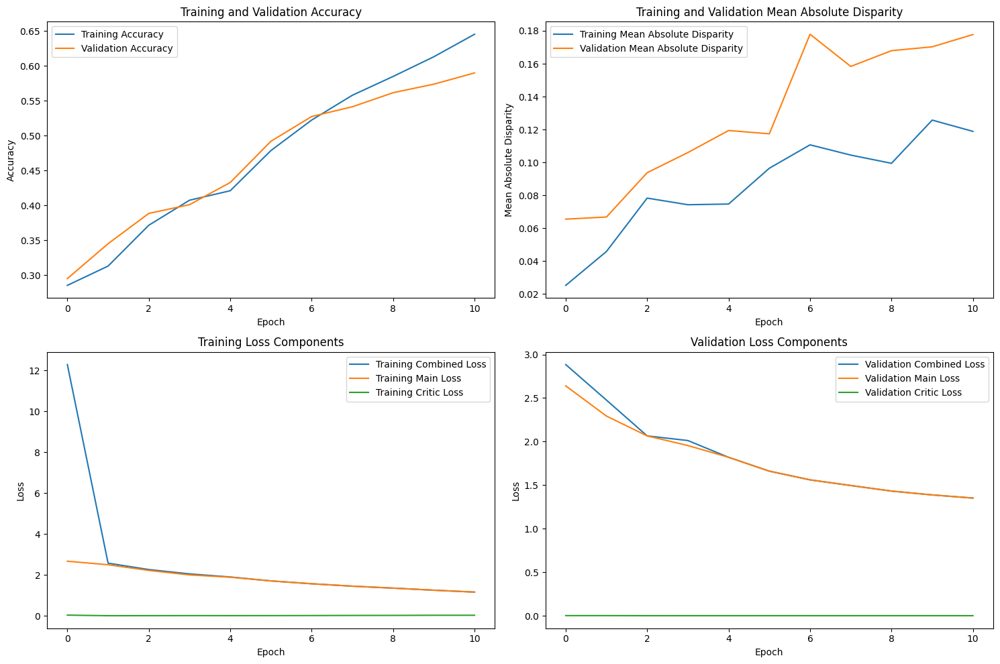

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 50 - Epoch 12 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.669367, VALIDATION Accuracy: 0.5938
TRAINING Disparity: 0.130227, VALIDATION Disparity: 0.1860
TRAINING Combined Loss: 1.076685, VALIDATION Combined Loss: 1.3517
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.12785184677428563
Class Celebration: Val Disparity = 0.029851485148514767
Class Parade: Val Disparity = 0.07007575757575768
Class Waiter_Or_Waitress: Val Disparity = -0.1680030546009929
Class Individual_Sports: Val Disparity = -0.14489700374531844
Class Surgeons: Val Disparity = 0.02143385070214332
Class Spa: Val Disparity = -0.6666666666666666
Class Law_Enforcement: Val Disparity = 0.16267605633802823
Class Business: Val Disparity = 0.08953475992760579
Class Dresses: Val Disparity = -0.718562874251497
Class Water_Activities: Val Disparity = -0.00936768149882905
Class Picnic: Val Disparity = -0.29411764705882354
Class Rescue: Val Disparit

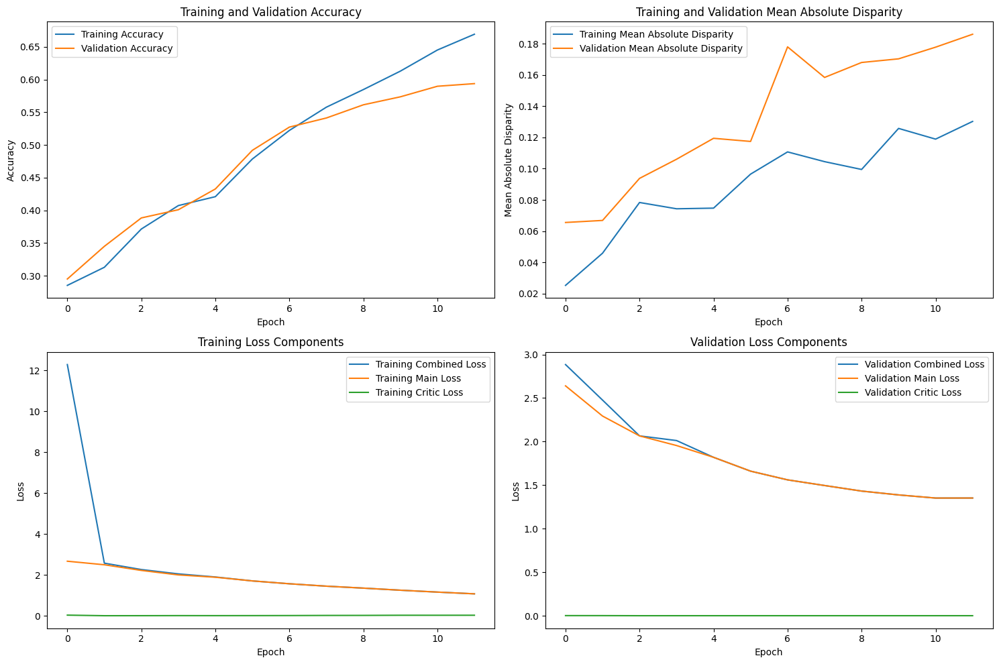

Epoch 13/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 50 - Epoch 13 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.698245, VALIDATION Accuracy: 0.6001
TRAINING Disparity: 0.124321, VALIDATION Disparity: 0.1447
TRAINING Combined Loss: 0.980123, VALIDATION Combined Loss: 1.3310
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1262067153351385
Class Celebration: Val Disparity = 0.01965346534653467
Class Parade: Val Disparity = 0.09185606060606066
Class Waiter_Or_Waitress: Val Disparity = -0.2195494463535702
Class Individual_Sports: Val Disparity = -0.1432584269662921
Class Surgeons: Val Disparity = -0.02734663710273455
Class Spa: Val Disparity = -0.16666666666666663
Class Law_Enforcement: Val Disparity = 0.12159624413145542
Class Business: Val Disparity = 0.006068348770360887
Class Dresses: Val Disparity = -0.6946107784431138
Class Water_Activities: Val Disparity = 0.0002129018522460946
Class Picnic: Val Disparity = -0.3137254901960785
Class Rescue: Val Dispari

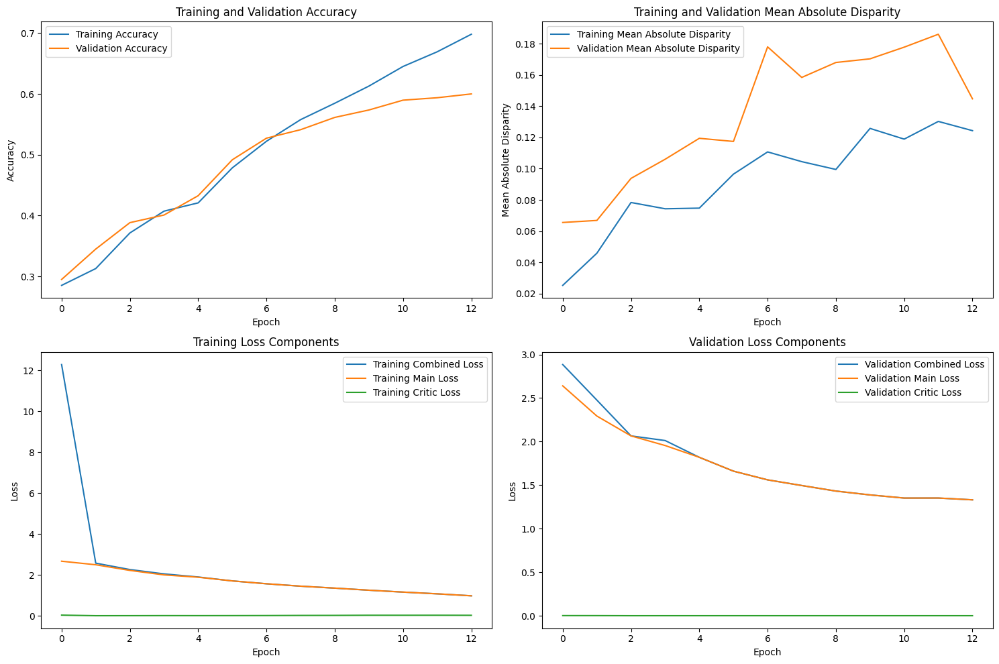

Epoch 14/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 50 - Epoch 14 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.726350, VALIDATION Accuracy: 0.6046
TRAINING Disparity: 0.104731, VALIDATION Disparity: 0.1465
TRAINING Combined Loss: 0.888057, VALIDATION Combined Loss: 1.3299
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09732551895899733
Class Celebration: Val Disparity = 0.05995049504950489
Class Parade: Val Disparity = 0.08522727272727271
Class Waiter_Or_Waitress: Val Disparity = -0.18862161130202382
Class Individual_Sports: Val Disparity = -0.1007724719101124
Class Surgeons: Val Disparity = -0.027346637102734606
Class Spa: Val Disparity = -0.2499999999999999
Class Law_Enforcement: Val Disparity = 0.1427230046948358
Class Business: Val Disparity = 0.0043649526242947045
Class Dresses: Val Disparity = -0.7245508982035929
Class Water_Activities: Val Disparity = 0.007025761124121788
Class Picnic: Val Disparity = -0.35294117647058815
Class Rescue: Val Dispa

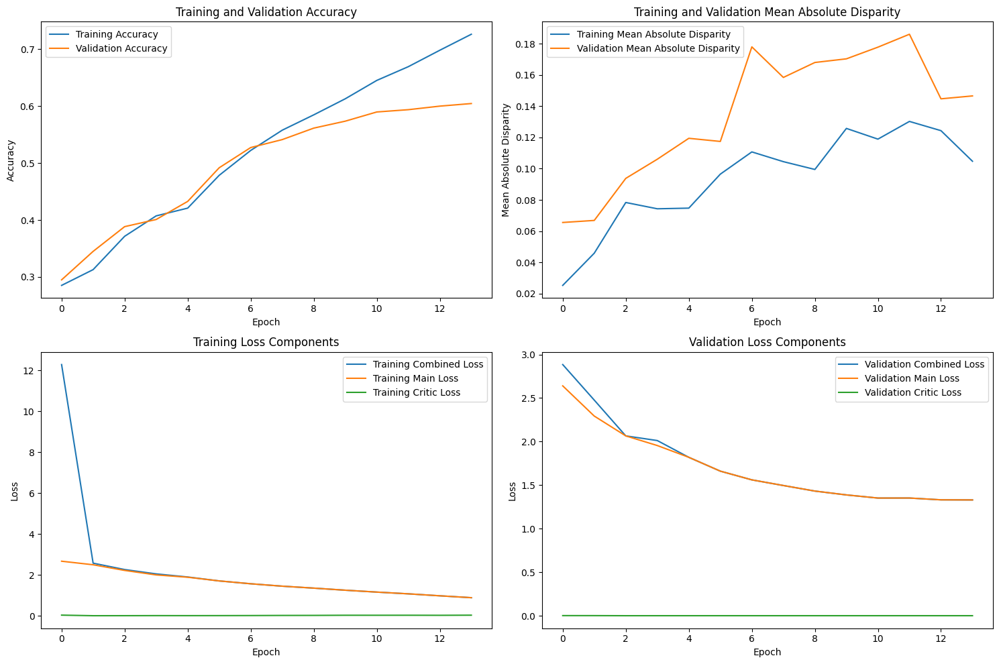

Epoch 15/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 50 - Epoch 15 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.764853, VALIDATION Accuracy: 0.6006
TRAINING Disparity: 0.130039, VALIDATION Disparity: 0.1442
TRAINING Combined Loss: 0.767665, VALIDATION Combined Loss: 1.3662
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09732551895899733
Class Celebration: Val Disparity = 0.05995049504950489
Class Parade: Val Disparity = 0.08522727272727271
Class Waiter_Or_Waitress: Val Disparity = -0.18862161130202382
Class Individual_Sports: Val Disparity = -0.1007724719101124
Class Surgeons: Val Disparity = -0.027346637102734606
Class Spa: Val Disparity = -0.2499999999999999
Class Law_Enforcement: Val Disparity = 0.1427230046948358
Class Business: Val Disparity = 0.0043649526242947045
Class Dresses: Val Disparity = -0.7245508982035929
Class Water_Activities: Val Disparity = 0.007025761124121788
Class Picnic: Val Disparity = -0.35294117647058815
Class Rescue: Val Dispa

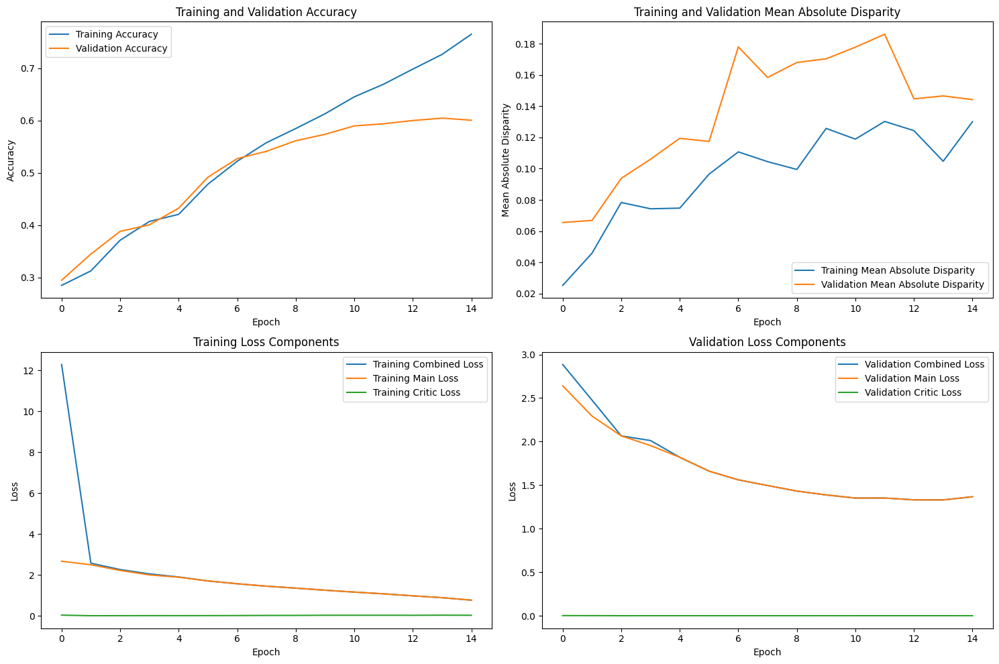

Epoch 16/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.27it/s]



Lambda 50 - Epoch 16 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.797068, VALIDATION Accuracy: 0.6026
TRAINING Disparity: 0.100109, VALIDATION Disparity: 0.1283
TRAINING Combined Loss: 0.665309, VALIDATION Combined Loss: 1.3893
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09732551895899733
Class Celebration: Val Disparity = 0.05995049504950489
Class Parade: Val Disparity = 0.08522727272727271
Class Waiter_Or_Waitress: Val Disparity = -0.18862161130202382
Class Individual_Sports: Val Disparity = -0.1007724719101124
Class Surgeons: Val Disparity = -0.027346637102734606
Class Spa: Val Disparity = -0.2499999999999999
Class Law_Enforcement: Val Disparity = 0.1427230046948358
Class Business: Val Disparity = 0.0043649526242947045
Class Dresses: Val Disparity = -0.7245508982035929
Class Water_Activities: Val Disparity = 0.007025761124121788
Class Picnic: Val Disparity = -0.35294117647058815
Class Rescue: Val Dispa

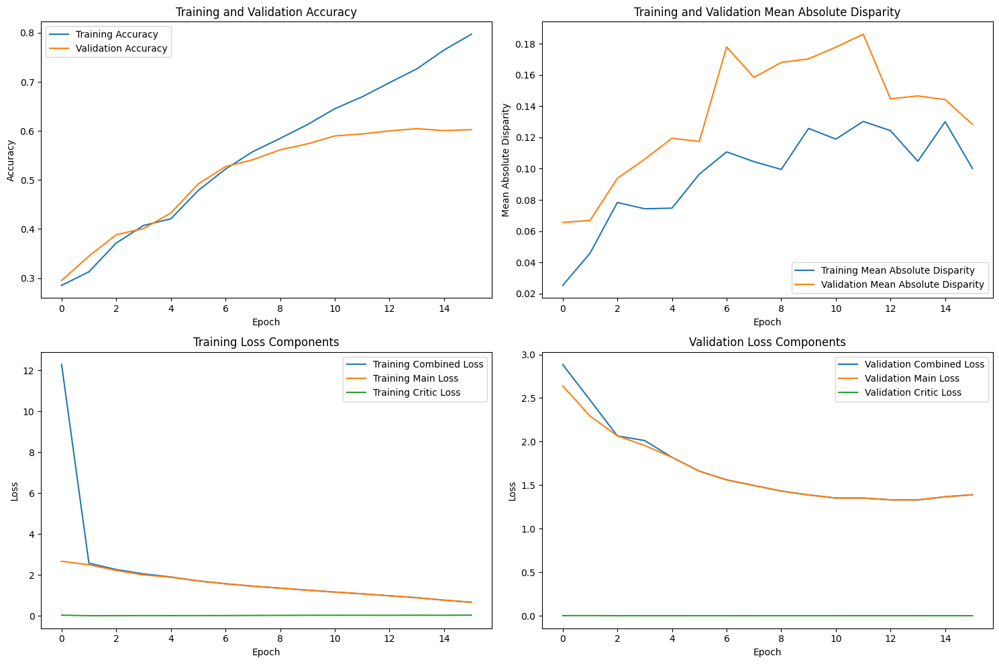

Epoch 17/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 50 - Epoch 17 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.830536, VALIDATION Accuracy: 0.5986
TRAINING Disparity: 0.077779, VALIDATION Disparity: 0.1340
TRAINING Combined Loss: 0.562356, VALIDATION Combined Loss: 1.4463
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09732551895899733
Class Celebration: Val Disparity = 0.05995049504950489
Class Parade: Val Disparity = 0.08522727272727271
Class Waiter_Or_Waitress: Val Disparity = -0.18862161130202382
Class Individual_Sports: Val Disparity = -0.1007724719101124
Class Surgeons: Val Disparity = -0.027346637102734606
Class Spa: Val Disparity = -0.2499999999999999
Class Law_Enforcement: Val Disparity = 0.1427230046948358
Class Business: Val Disparity = 0.0043649526242947045
Class Dresses: Val Disparity = -0.7245508982035929
Class Water_Activities: Val Disparity = 0.007025761124121788
Class Picnic: Val Disparity = -0.35294117647058815
Class Rescue: Val Dispa

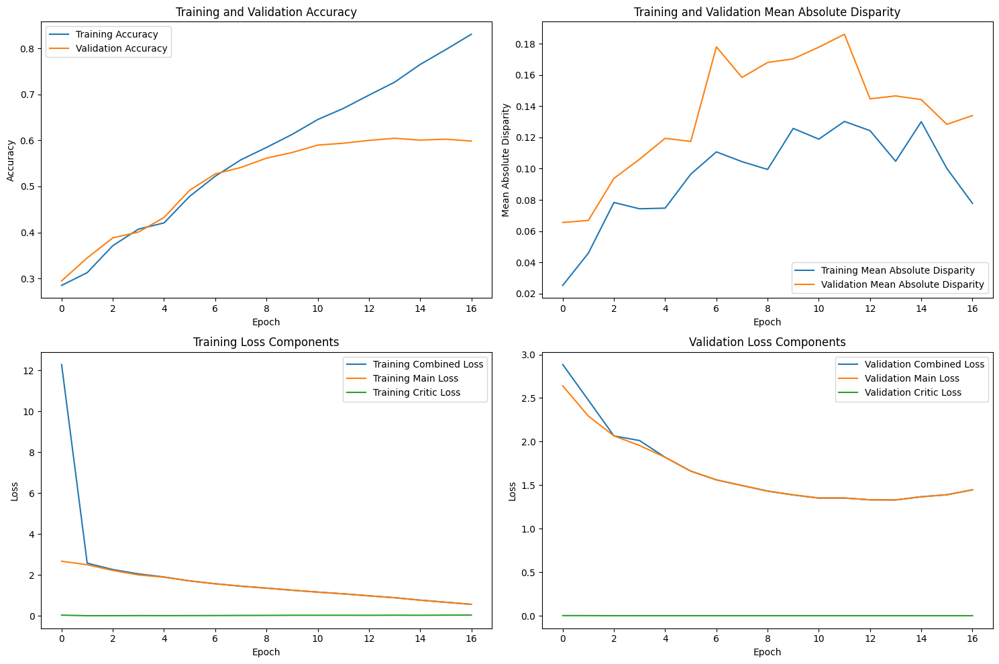

Epoch 18/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.35it/s]



Lambda 50 - Epoch 18 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.867438, VALIDATION Accuracy: 0.6049
TRAINING Disparity: 0.075630, VALIDATION Disparity: 0.1738
TRAINING Combined Loss: 0.447591, VALIDATION Combined Loss: 1.5091
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09732551895899733
Class Celebration: Val Disparity = 0.05995049504950489
Class Parade: Val Disparity = 0.08522727272727271
Class Waiter_Or_Waitress: Val Disparity = -0.18862161130202382
Class Individual_Sports: Val Disparity = -0.1007724719101124
Class Surgeons: Val Disparity = -0.027346637102734606
Class Spa: Val Disparity = -0.2499999999999999
Class Law_Enforcement: Val Disparity = 0.1427230046948358
Class Business: Val Disparity = 0.0043649526242947045
Class Dresses: Val Disparity = -0.7245508982035929
Class Water_Activities: Val Disparity = 0.007025761124121788
Class Picnic: Val Disparity = -0.35294117647058815
Class Rescue: Val Dispa

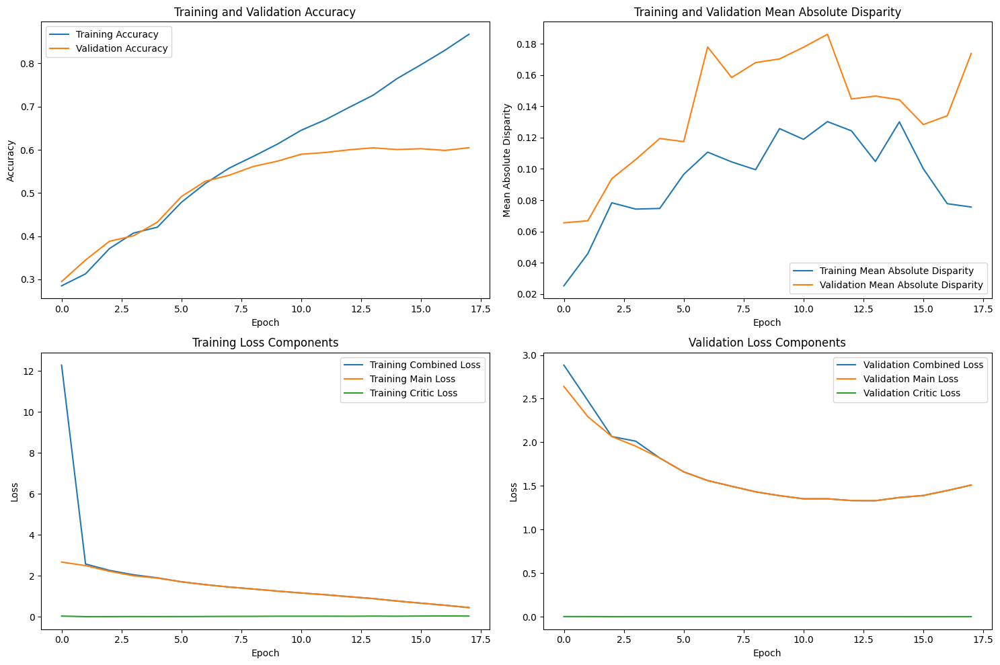

Epoch 19/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.24it/s]



Lambda 50 - Epoch 19 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.897936, VALIDATION Accuracy: 0.6035
TRAINING Disparity: 0.073757, VALIDATION Disparity: 0.1575
TRAINING Combined Loss: 0.350196, VALIDATION Combined Loss: 1.5836
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09732551895899733
Class Celebration: Val Disparity = 0.05995049504950489
Class Parade: Val Disparity = 0.08522727272727271
Class Waiter_Or_Waitress: Val Disparity = -0.18862161130202382
Class Individual_Sports: Val Disparity = -0.1007724719101124
Class Surgeons: Val Disparity = -0.027346637102734606
Class Spa: Val Disparity = -0.2499999999999999
Class Law_Enforcement: Val Disparity = 0.1427230046948358
Class Business: Val Disparity = 0.0043649526242947045
Class Dresses: Val Disparity = -0.7245508982035929
Class Water_Activities: Val Disparity = 0.007025761124121788
Class Picnic: Val Disparity = -0.35294117647058815
Class Rescue: Val Dispa

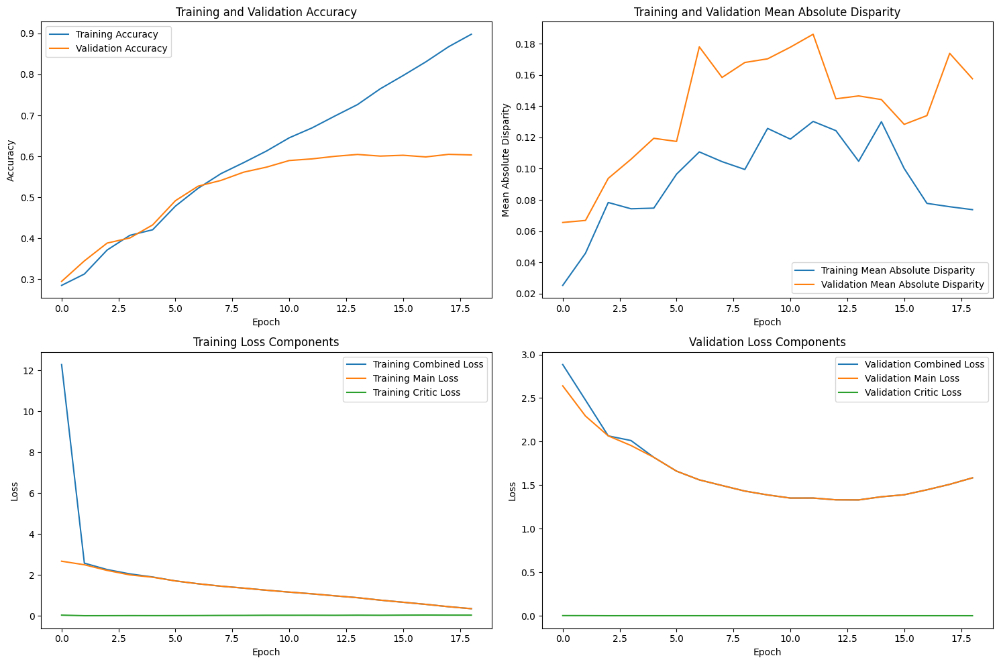

Epoch 20/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.22it/s]


Early stopping triggered at epoch 20
Finished Training with lambda value of 50. Best (stopping) epoch number: 14


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 150 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.243422, VALIDATION Accuracy: 0.2500
TRAINING Disparity: 0.033369, VALIDATION Disparity: 0.0826
TRAINING Combined Loss: 32.565510, VALIDATION Combined Loss: 2.6122
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.17873667614902145
Class Celebration: Val Disparity = 0.0099009900990099
Class Parade: Val Disparity = 0.08143939393939398
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.019311797752809
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.12018779342723004
Class Business: Val Disparity = -0.1590546151389332
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.06951245475835643
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.022727272727272724
Class Cheering: Val Disparity = 0.0
Class Performance_And_E

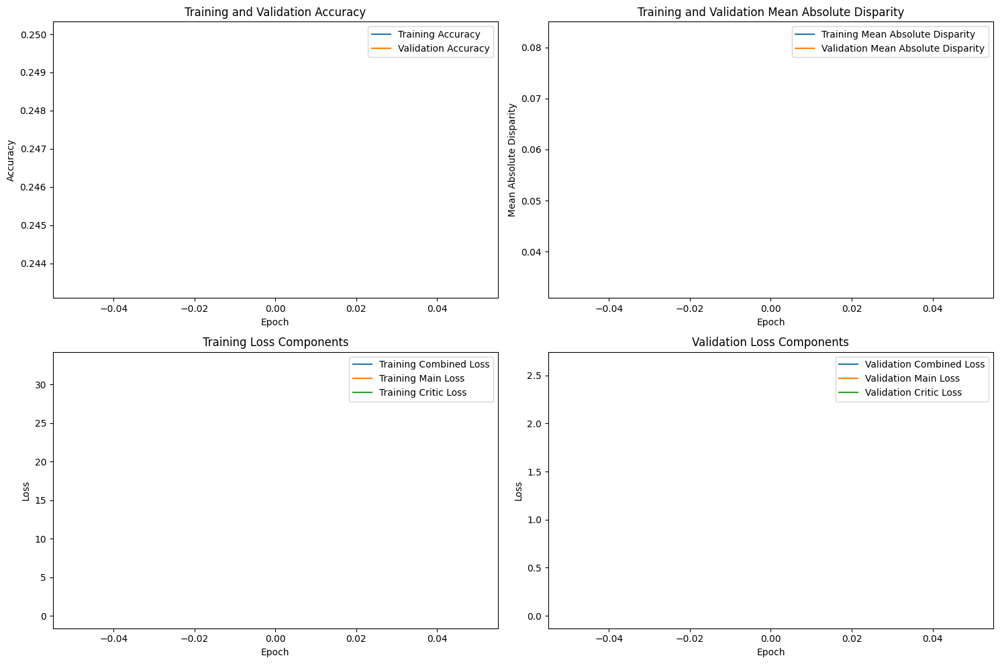

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 150 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.244425, VALIDATION Accuracy: 0.2710
TRAINING Disparity: 0.041199, VALIDATION Disparity: 0.0515
TRAINING Combined Loss: 3.670304, VALIDATION Combined Loss: 2.4395
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05054209365824669
Class Celebration: Val Disparity = -0.005396039603960401
Class Parade: Val Disparity = 0.04166666666666674
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = -0.04588014981273403
Class Surgeons: Val Disparity = -0.030303030303030304
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.22769953051643183
Class Business: Val Disparity = -0.06313211966357923
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.005854800936768323
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.010962566844919787
Class Cheering: Val Disparity = 0.

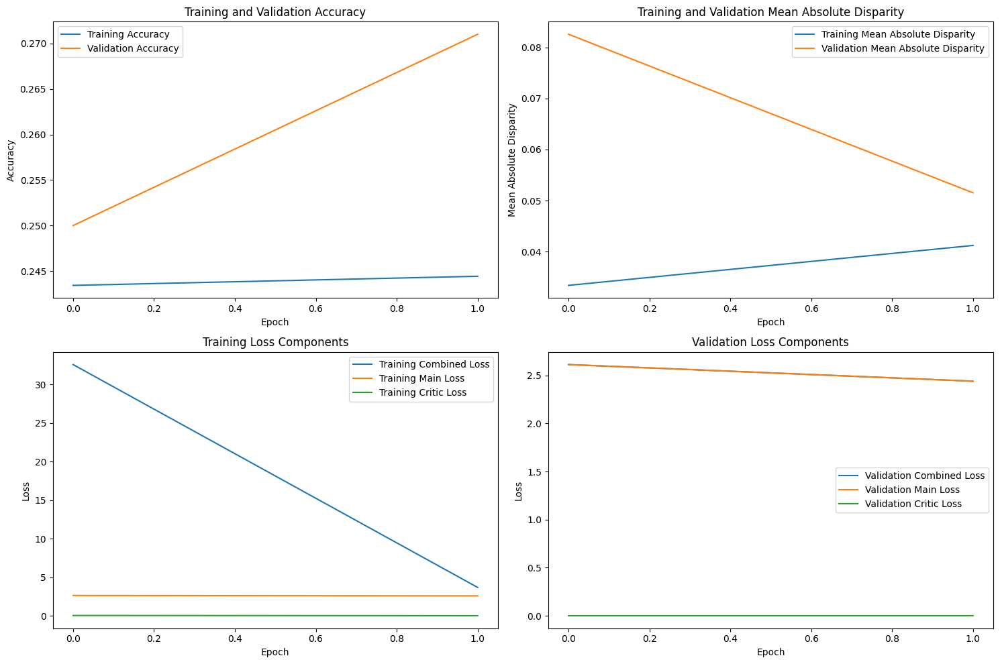

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.23it/s]



Lambda 150 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.266782, VALIDATION Accuracy: 0.2929
TRAINING Disparity: 0.040874, VALIDATION Disparity: 0.0611
TRAINING Combined Loss: 3.024960, VALIDATION Combined Loss: 2.6121
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05054209365824669
Class Celebration: Val Disparity = -0.005396039603960401
Class Parade: Val Disparity = 0.04166666666666674
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = -0.04588014981273403
Class Surgeons: Val Disparity = -0.030303030303030304
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.22769953051643183
Class Business: Val Disparity = -0.06313211966357923
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.005854800936768323
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.010962566844919787
Class Cheering: Val Disparity = 0.

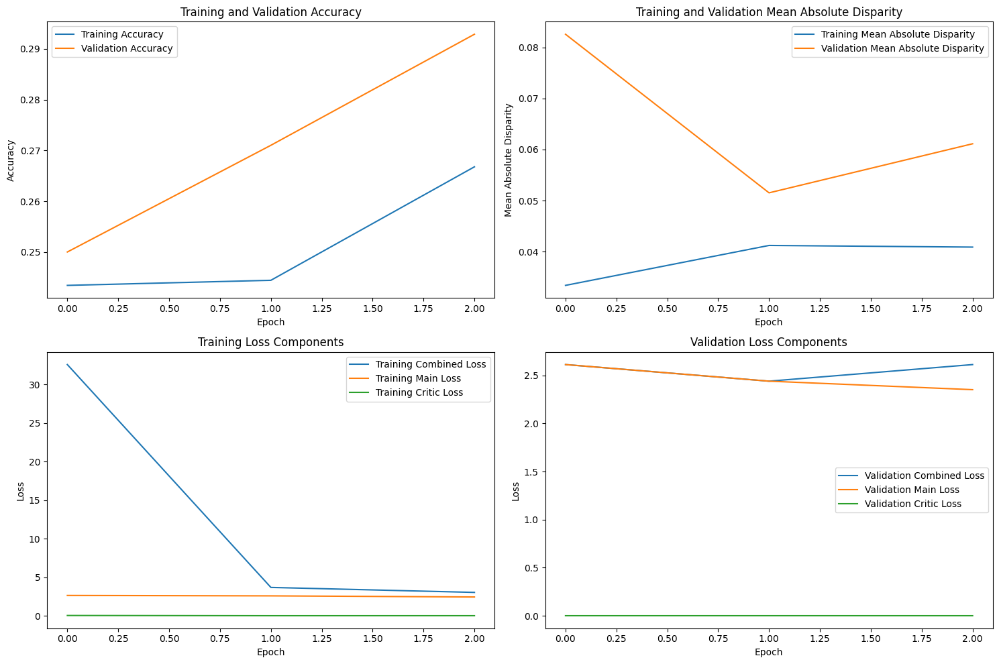

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.29it/s]



Lambda 150 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.284896, VALIDATION Accuracy: 0.3134
TRAINING Disparity: 0.035508, VALIDATION Disparity: 0.0531
TRAINING Combined Loss: 2.395294, VALIDATION Combined Loss: 2.3474
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05298694176920182
Class Celebration: Val Disparity = -0.037376237623762354
Class Parade: Val Disparity = 0.05776515151515138
Class Waiter_Or_Waitress: Val Disparity = -0.06185567010309278
Class Individual_Sports: Val Disparity = -0.0007412609238451884
Class Surgeons: Val Disparity = 0.024390243902439025
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.2622065727699532
Class Business: Val Disparity = -0.04620462046204621
Class Dresses: Val Disparity = -0.005988023952095809
Class Water_Activities: Val Disparity = 0.07685756866084736
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.022727272727272728


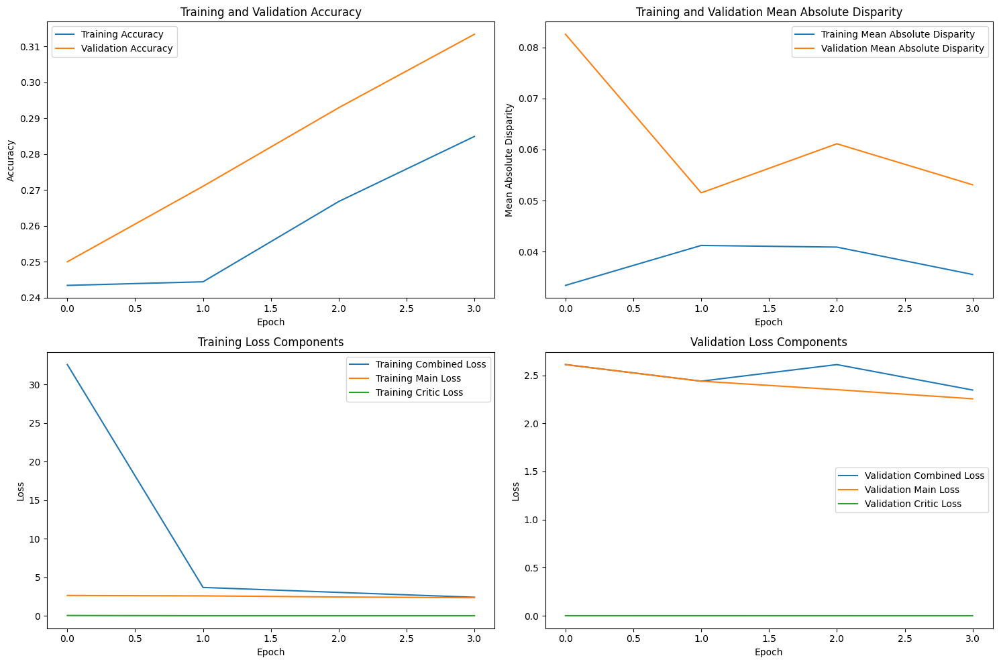

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]



Lambda 150 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.318654, VALIDATION Accuracy: 0.3540
TRAINING Disparity: 0.042550, VALIDATION Disparity: 0.0769
TRAINING Combined Loss: 2.203541, VALIDATION Combined Loss: 2.1457
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.024505603728964598
Class Celebration: Val Disparity = -0.01826732673267334
Class Parade: Val Disparity = 0.039772727272727404
Class Waiter_Or_Waitress: Val Disparity = -0.19396716303932798
Class Individual_Sports: Val Disparity = -0.041588639200998756
Class Surgeons: Val Disparity = 0.024390243902439025
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.3467136150234742
Class Business: Val Disparity = -0.056957308634089265
Class Dresses: Val Disparity = -0.029940119760479045
Class Water_Activities: Val Disparity = 0.06450926123057277
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: V

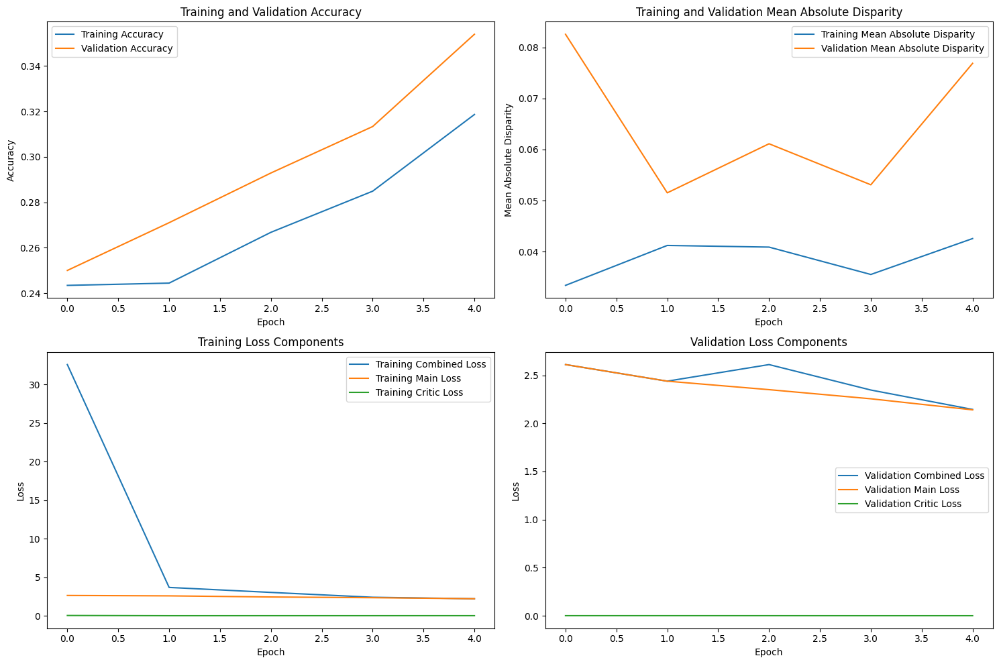

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.32it/s]



Lambda 150 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.351948, VALIDATION Accuracy: 0.3653
TRAINING Disparity: 0.056055, VALIDATION Disparity: 0.0529
TRAINING Combined Loss: 2.107081, VALIDATION Combined Loss: 2.0773
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.02859558327906697
Class Celebration: Val Disparity = -0.003366336633663425
Class Parade: Val Disparity = 0.02651515151515138
Class Waiter_Or_Waitress: Val Disparity = -0.17754868270332186
Class Individual_Sports: Val Disparity = 0.04197877652933829
Class Surgeons: Val Disparity = 0.024390243902439022
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.27112676056338025
Class Business: Val Disparity = 0.0058554242521026145
Class Dresses: Val Disparity = -0.005988023952095809
Class Water_Activities: Val Disparity = -0.0502448371300831
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.022727272727272724
C

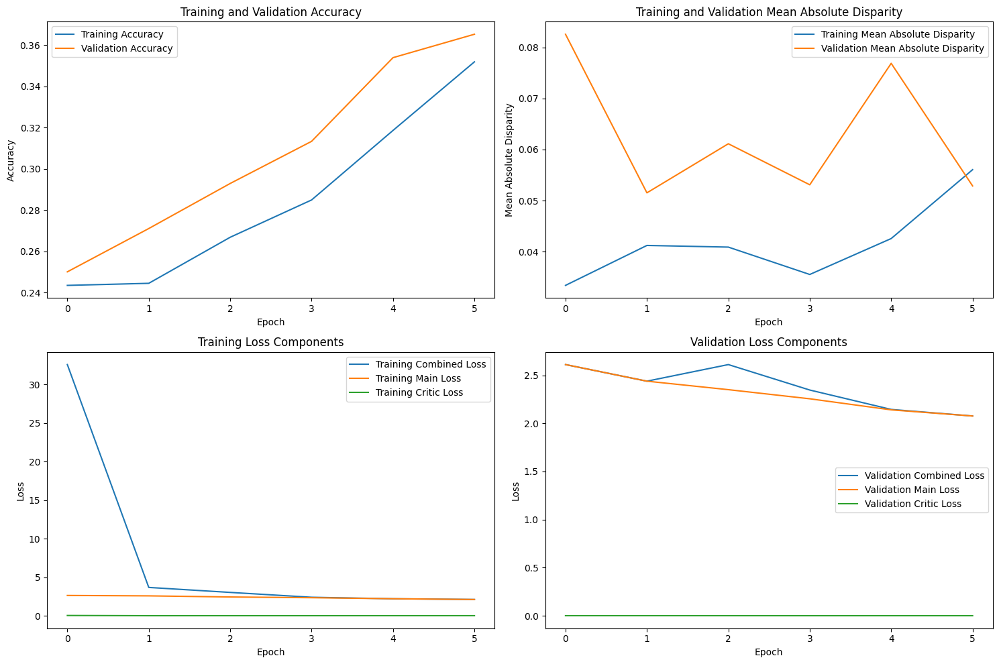

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 150 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.370949, VALIDATION Accuracy: 0.3892
TRAINING Disparity: 0.055225, VALIDATION Disparity: 0.0683
TRAINING Combined Loss: 2.044195, VALIDATION Combined Loss: 2.0000
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.042362134558042386
Class Celebration: Val Disparity = -0.0032673267326733257
Class Parade: Val Disparity = 0.03409090909090917
Class Waiter_Or_Waitress: Val Disparity = -0.2600229095074456
Class Individual_Sports: Val Disparity = 0.010923845193508142
Class Surgeons: Val Disparity = 0.04878048780487805
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.2626760563380281
Class Business: Val Disparity = 0.022250612157989957
Class Dresses: Val Disparity = -0.11976047904191618
Class Water_Activities: Val Disparity = -0.03661911858633171
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.022727272727272724
Cl

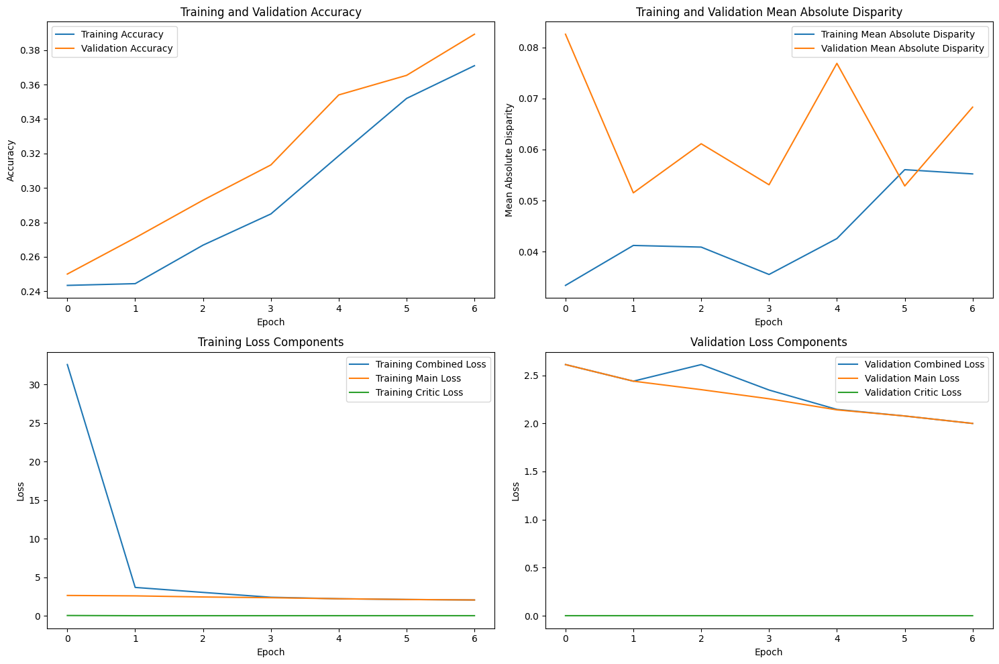

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 150 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.392361, VALIDATION Accuracy: 0.4125
TRAINING Disparity: 0.057145, VALIDATION Disparity: 0.0970
TRAINING Combined Loss: 1.968832, VALIDATION Combined Loss: 1.9406
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05463207320834906
Class Celebration: Val Disparity = 0.011633663366336533
Class Parade: Val Disparity = 0.06060606060606055
Class Waiter_Or_Waitress: Val Disparity = -0.28484154257350136
Class Individual_Sports: Val Disparity = -0.02972846441947563
Class Surgeons: Val Disparity = 0.048780487804878044
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.28380281690140846
Class Business: Val Disparity = 0.051101884381986595
Class Dresses: Val Disparity = -0.34131736526946105
Class Water_Activities: Val Disparity = 0.0029806259314456574
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.022727272727272724
C

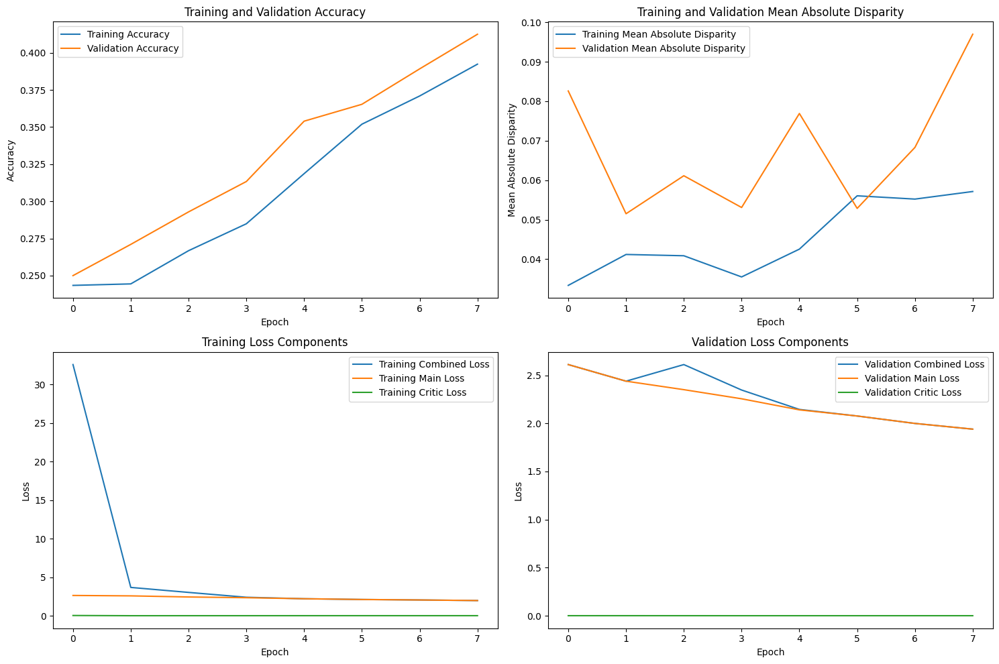

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 150 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.413870, VALIDATION Accuracy: 0.4295
TRAINING Disparity: 0.059710, VALIDATION Disparity: 0.0887
TRAINING Combined Loss: 1.897323, VALIDATION Combined Loss: 1.8763
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.058722052758451215
Class Celebration: Val Disparity = 0.036237623762376214
Class Parade: Val Disparity = 0.0757575757575758
Class Waiter_Or_Waitress: Val Disparity = -0.27873234058801066
Class Individual_Sports: Val Disparity = -0.06015917602996246
Class Surgeons: Val Disparity = 0.048780487804878044
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.23826291079812206
Class Business: Val Disparity = 0.0287448099648675
Class Dresses: Val Disparity = -0.26447105788423153
Class Water_Activities: Val Disparity = 0.0029806259314456574
Class Picnic: Val Disparity = -0.0196078431372549
Class Rescue: Val Disparity = 0.0
Class

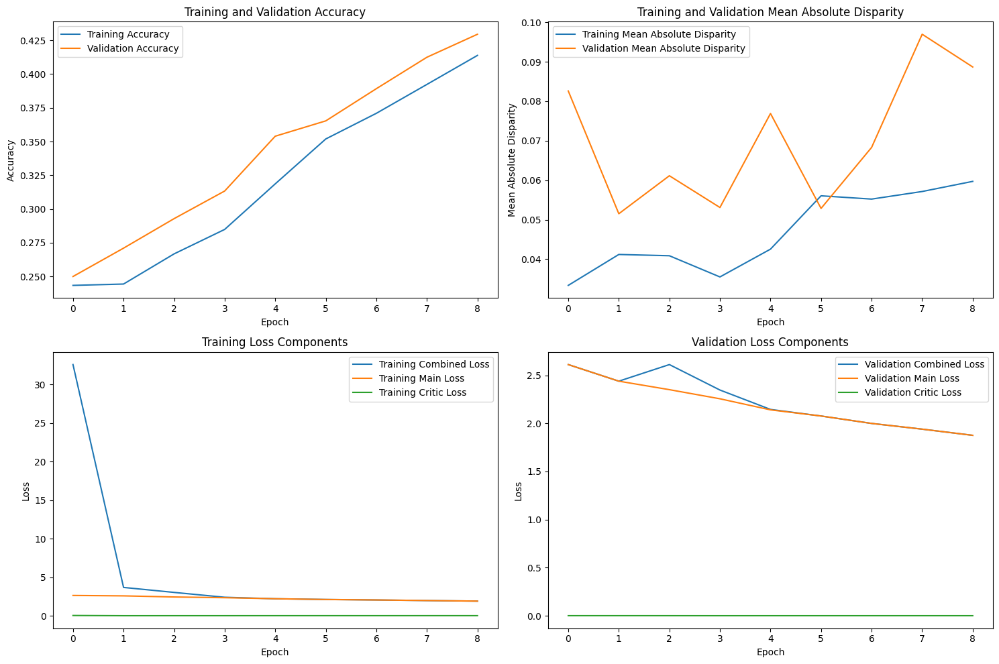

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.24it/s]



Lambda 150 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.436748, VALIDATION Accuracy: 0.4432
TRAINING Disparity: 0.069871, VALIDATION Disparity: 0.1017
TRAINING Combined Loss: 1.824687, VALIDATION Combined Loss: 1.8211
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.044555643143571966
Class Celebration: Val Disparity = -0.00836633663366343
Class Parade: Val Disparity = 0.09280303030303028
Class Waiter_Or_Waitress: Val Disparity = -0.27262313860252
Class Individual_Sports: Val Disparity = -0.061173533083645426
Class Surgeons: Val Disparity = 0.09756097560975609
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.2312206572769952
Class Business: Val Disparity = 0.027041413818801208
Class Dresses: Val Disparity = -0.3063872255489022
Class Water_Activities: Val Disparity = 0.040557802852884794
Class Picnic: Val Disparity = -0.0196078431372549
Class Rescue: Val Disparity = 0.0
Class C

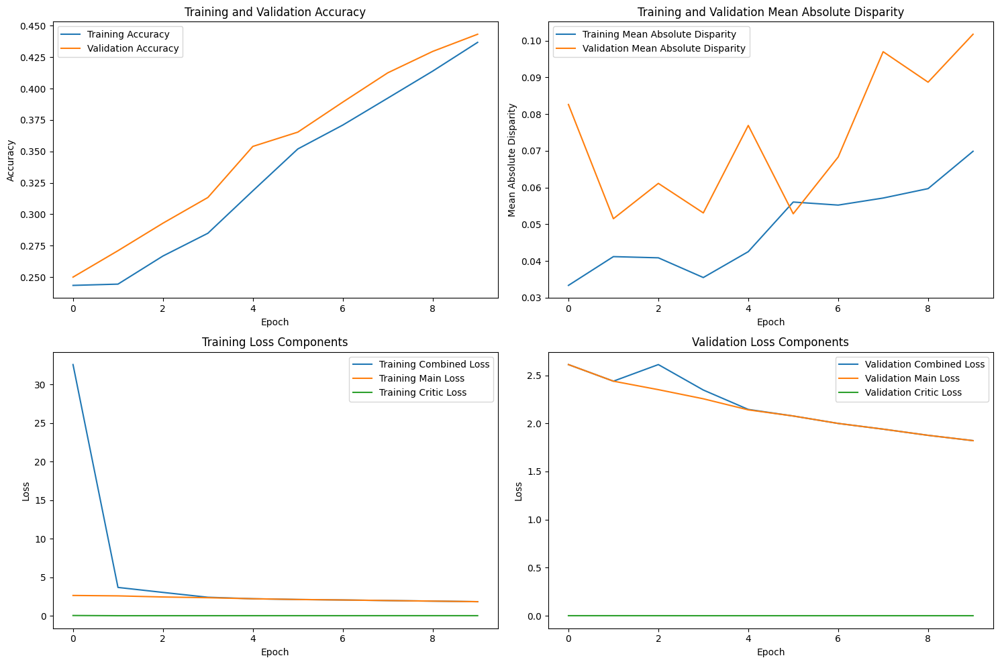

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 150 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.453530, VALIDATION Accuracy: 0.4634
TRAINING Disparity: 0.080778, VALIDATION Disparity: 0.1099
TRAINING Combined Loss: 1.771554, VALIDATION Combined Loss: 1.7601
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.035975825707463716
Class Celebration: Val Disparity = 0.016138613861386153
Class Parade: Val Disparity = 0.08333333333333326
Class Waiter_Or_Waitress: Val Disparity = -0.3138602520045819
Class Individual_Sports: Val Disparity = -0.0421738451935082
Class Surgeons: Val Disparity = 0.0672579453067258
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.2715962441314553
Class Business: Val Disparity = 0.04599169594378788
Class Dresses: Val Disparity = -0.4261477045908184
Class Water_Activities: Val Disparity = 0.032361081541409376
Class Picnic: Val Disparity = -0.058823529411764705
Class Rescue: Val Disparity = 0.012566844

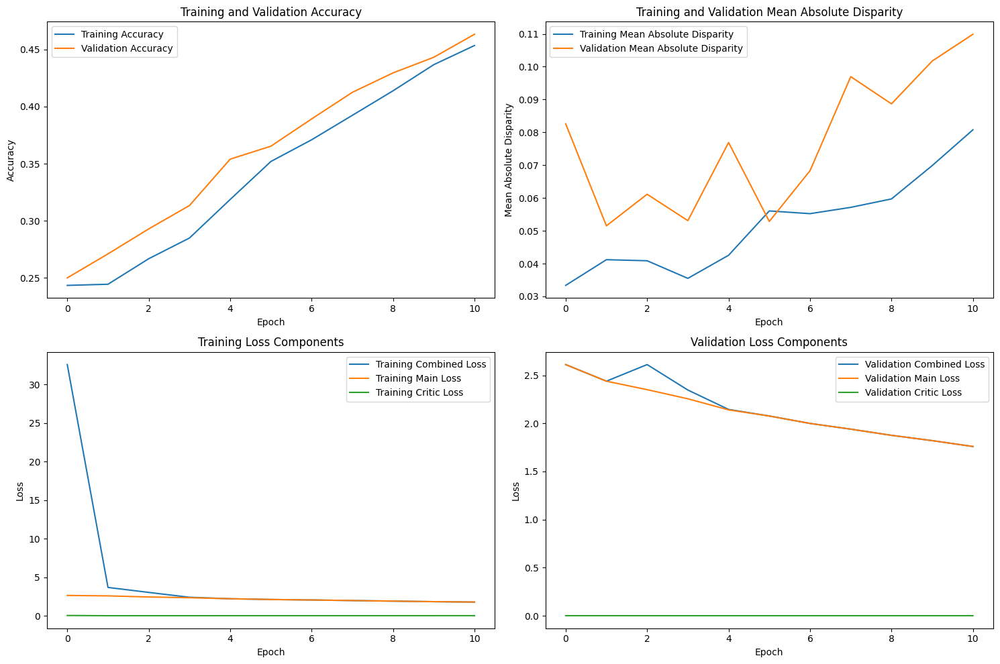

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 150 - Epoch 12 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.474267, VALIDATION Accuracy: 0.4756
TRAINING Disparity: 0.091410, VALIDATION Disparity: 0.1029
TRAINING Combined Loss: 1.699428, VALIDATION Combined Loss: 1.7073
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.039517428111183306
Class Celebration: Val Disparity = -0.008564356435643572
Class Parade: Val Disparity = 0.07954545454545447
Class Waiter_Or_Waitress: Val Disparity = -0.23978617793050777
Class Individual_Sports: Val Disparity = -0.06729868913857673
Class Surgeons: Val Disparity = 0.04951958610495194
Class Spa: Val Disparity = -0.020833333333333332
Class Law_Enforcement: Val Disparity = 0.21901408450704224
Class Business: Val Disparity = 0.03268391355264555
Class Dresses: Val Disparity = -0.4261477045908184
Class Water_Activities: Val Disparity = 0.04673195656802198
Class Picnic: Val Disparity = -0.1568627450980392
Class Rescue: Val Dis

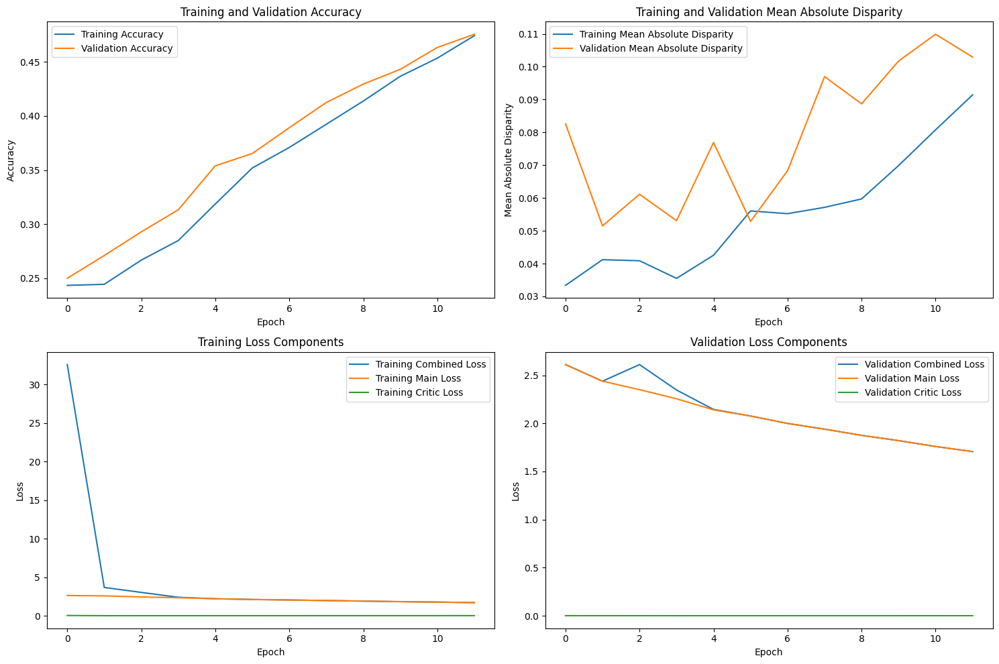

Epoch 13/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.22it/s]



Lambda 150 - Epoch 13 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.492110, VALIDATION Accuracy: 0.4895
TRAINING Disparity: 0.090211, VALIDATION Disparity: 0.1120
TRAINING Combined Loss: 1.641305, VALIDATION Combined Loss: 1.6562
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.04251065336852089
Class Celebration: Val Disparity = 0.011237623762376248
Class Parade: Val Disparity = 0.06818181818181834
Class Waiter_Or_Waitress: Val Disparity = -0.2646048109965635
Class Individual_Sports: Val Disparity = -0.09772940074906378
Class Surgeons: Val Disparity = 0.09238728750923872
Class Spa: Val Disparity = -0.06249999999999999
Class Law_Enforcement: Val Disparity = 0.26901408450704223
Class Business: Val Disparity = 0.012030235281592638
Class Dresses: Val Disparity = -0.3073852295409181
Class Water_Activities: Val Disparity = 0.027570789865871914
Class Picnic: Val Disparity = -0.2549019607843137
Class Rescue: Val Dispa

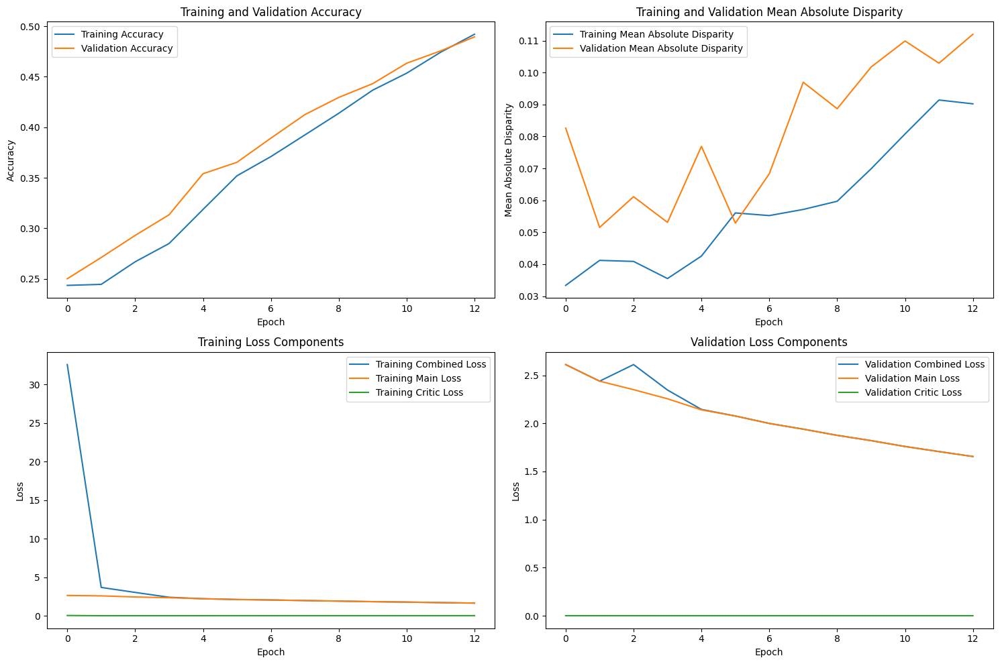

Epoch 14/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 150 - Epoch 14 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.511728, VALIDATION Accuracy: 0.5051
TRAINING Disparity: 0.094903, VALIDATION Disparity: 0.1088
TRAINING Combined Loss: 1.578063, VALIDATION Combined Loss: 1.6104
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.057373958940261205
Class Celebration: Val Disparity = -0.03336633663366334
Class Parade: Val Disparity = 0.0890151515151516
Class Waiter_Or_Waitress: Val Disparity = -0.24818633066055745
Class Individual_Sports: Val Disparity = -0.08996566791510618
Class Surgeons: Val Disparity = 0.03178122690317814
Class Spa: Val Disparity = -0.14583333333333331
Class Law_Enforcement: Val Disparity = 0.21455399061032865
Class Business: Val Disparity = -0.01288193335462573
Class Dresses: Val Disparity = -0.3253493013972057
Class Water_Activities: Val Disparity = 0.03576751117734722
Class Picnic: Val Disparity = -0.20261437908496732
Class Rescue: Val Disp

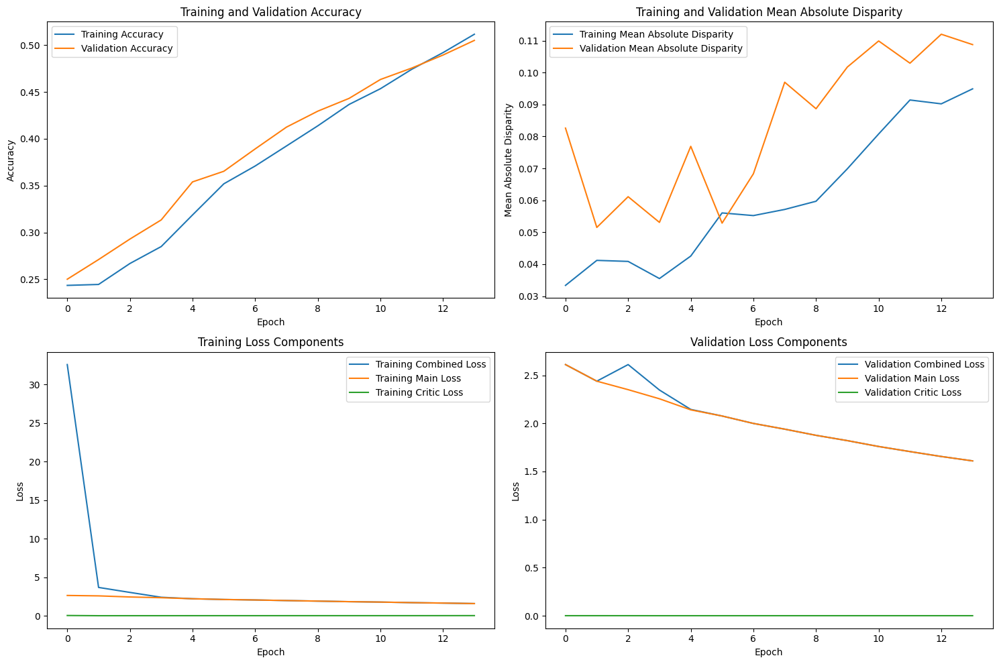

Epoch 15/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 150 - Epoch 15 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.526447, VALIDATION Accuracy: 0.5159
TRAINING Disparity: 0.107412, VALIDATION Disparity: 0.1150
TRAINING Combined Loss: 1.522461, VALIDATION Combined Loss: 1.5722
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05368383772606289
Class Celebration: Val Disparity = 0.04094059405940598
Class Parade: Val Disparity = 0.07670454545454541
Class Waiter_Or_Waitress: Val Disparity = -0.19053073692248945
Class Individual_Sports: Val Disparity = -0.1081460674157304
Class Surgeons: Val Disparity = 0.03178122690317814
Class Spa: Val Disparity = -0.18749999999999997
Class Law_Enforcement: Val Disparity = 0.25680751173708927
Class Business: Val Disparity = 0.030980517406579366
Class Dresses: Val Disparity = -0.37924151696606806
Class Water_Activities: Val Disparity = 0.00979348520332124
Class Picnic: Val Disparity = -0.16993464052287582
Class Rescue: Val Dispa

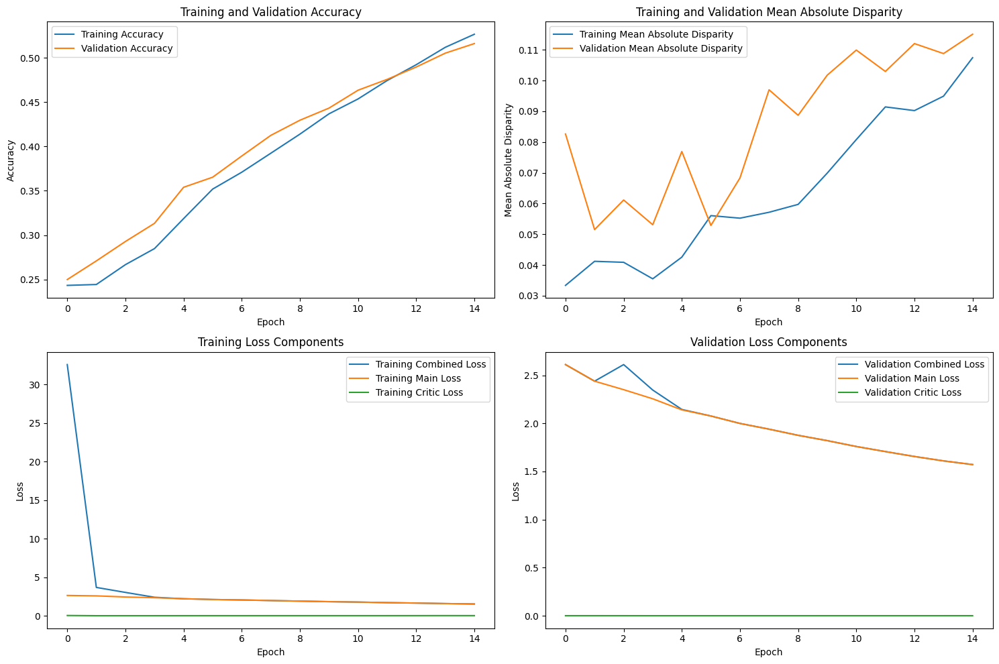

Epoch 16/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.24it/s]



Lambda 150 - Epoch 16 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.548071, VALIDATION Accuracy: 0.5270
TRAINING Disparity: 0.110573, VALIDATION Disparity: 0.1158
TRAINING Combined Loss: 1.462279, VALIDATION Combined Loss: 1.5274
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.04171093669671322
Class Celebration: Val Disparity = -0.013861386138613818
Class Parade: Val Disparity = 0.09943181818181834
Class Waiter_Or_Waitress: Val Disparity = -0.274914089347079
Class Individual_Sports: Val Disparity = -0.13327091136079894
Class Surgeons: Val Disparity = 0.050258684405025844
Class Spa: Val Disparity = -0.20833333333333331
Class Law_Enforcement: Val Disparity = 0.1856807511737089
Class Business: Val Disparity = 0.008623442989460273
Class Dresses: Val Disparity = -0.3612774451097805
Class Water_Activities: Val Disparity = 0.07813497977432404
Class Picnic: Val Disparity = -0.13725490196078433
Class Rescue: Val Dispa

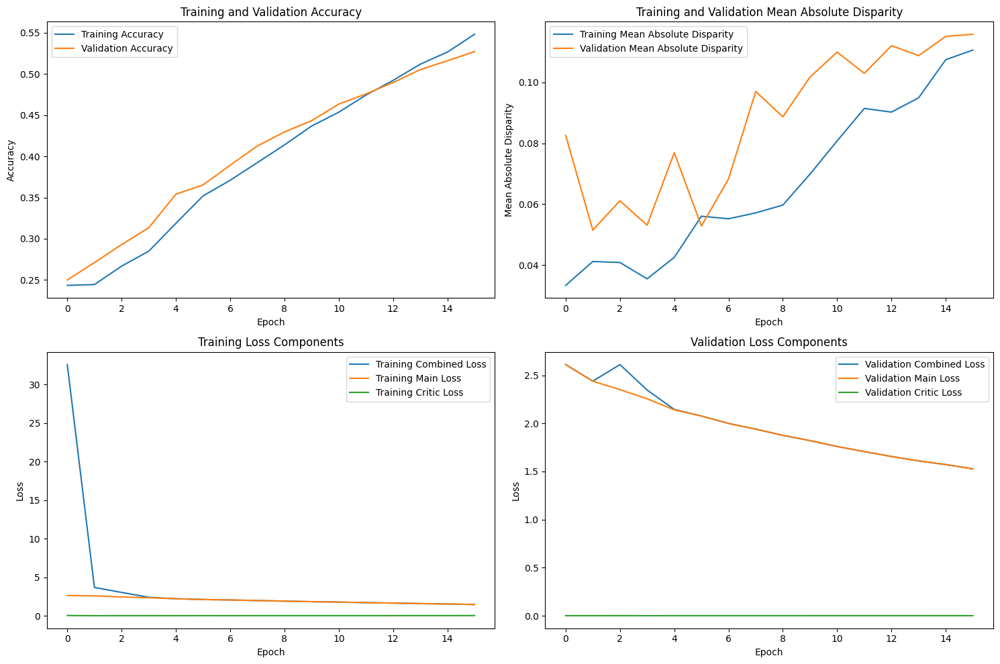

Epoch 17/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 150 - Epoch 17 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.569946, VALIDATION Accuracy: 0.5372
TRAINING Disparity: 0.116855, VALIDATION Disparity: 0.1187
TRAINING Combined Loss: 1.395330, VALIDATION Combined Loss: 1.4968
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06146393849036347
Class Celebration: Val Disparity = -0.043762376237623746
Class Parade: Val Disparity = 0.0662878787878789
Class Waiter_Or_Waitress: Val Disparity = -0.17411225658648338
Class Individual_Sports: Val Disparity = -0.1246878901373284
Class Surgeons: Val Disparity = 0.019955654101995624
Class Spa: Val Disparity = -0.3333333333333333
Class Law_Enforcement: Val Disparity = 0.2075117370892019
Class Business: Val Disparity = -0.00298094325561582
Class Dresses: Val Disparity = -0.3972055888223553
Class Water_Activities: Val Disparity = 0.03438364913774761
Class Picnic: Val Disparity = -0.1764705882352942
Class Rescue: Val Dispari

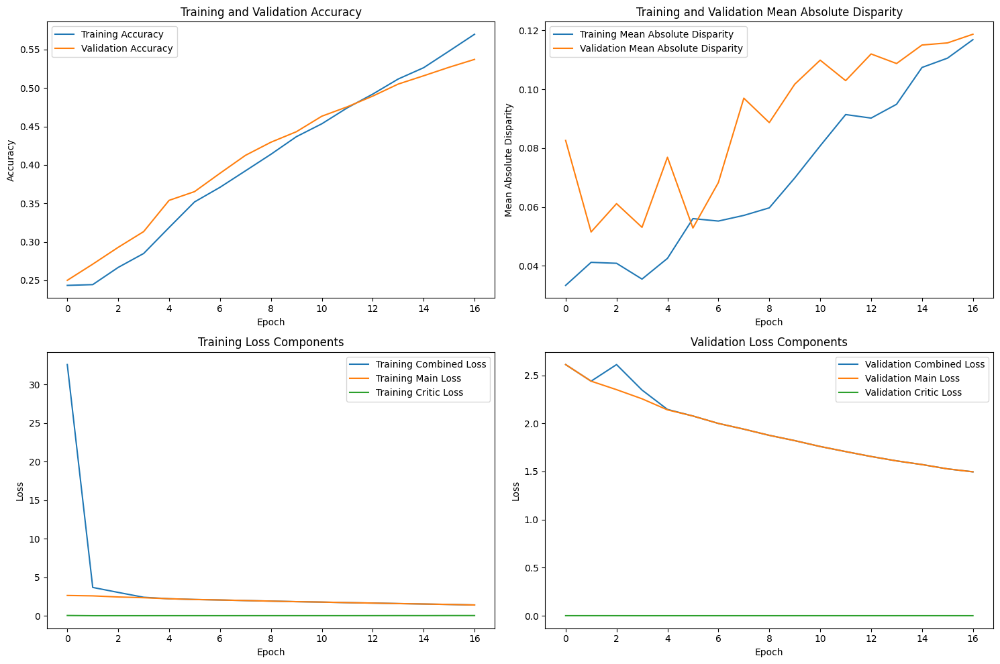

Epoch 18/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 150 - Epoch 18 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.586053, VALIDATION Accuracy: 0.5497
TRAINING Disparity: 0.111424, VALIDATION Disparity: 0.1215
TRAINING Combined Loss: 1.342049, VALIDATION Combined Loss: 1.4636
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05752247775073971
Class Celebration: Val Disparity = 0.020445544554455464
Class Parade: Val Disparity = 0.11931818181818188
Class Waiter_Or_Waitress: Val Disparity = -0.1412752959144712
Class Individual_Sports: Val Disparity = -0.11774344569288397
Class Surgeons: Val Disparity = 0.014042867701404282
Class Spa: Val Disparity = -0.3333333333333333
Class Law_Enforcement: Val Disparity = 0.19976525821596242
Class Business: Val Disparity = 0.030980517406579422
Class Dresses: Val Disparity = -0.4331337325349302
Class Water_Activities: Val Disparity = 0.07334468809878658
Class Picnic: Val Disparity = -0.19607843137254916
Class Rescue: Val Dispa

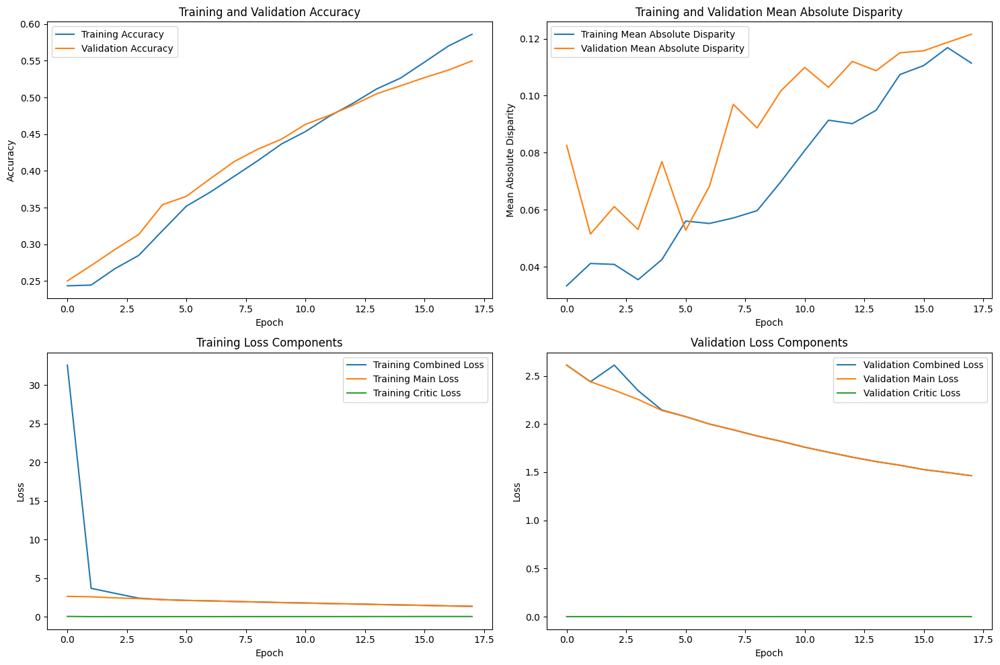

Epoch 19/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]



Lambda 150 - Epoch 19 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.603954, VALIDATION Accuracy: 0.5614
TRAINING Disparity: 0.124760, VALIDATION Disparity: 0.1475
TRAINING Combined Loss: 1.275496, VALIDATION Combined Loss: 1.4311
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06186379682626719
Class Celebration: Val Disparity = 0.04074257425742572
Class Parade: Val Disparity = 0.04640151515151514
Class Waiter_Or_Waitress: Val Disparity = -0.21534936998854526
Class Individual_Sports: Val Disparity = -0.18024344569288397
Class Surgeons: Val Disparity = -0.046563192904656325
Class Spa: Val Disparity = -0.4583333333333333
Class Law_Enforcement: Val Disparity = 0.19201877934272293
Class Business: Val Disparity = -0.011178537208559547
Class Dresses: Val Disparity = -0.5578842315369262
Class Water_Activities: Val Disparity = 0.08835426868213758
Class Picnic: Val Disparity = -0.23529411764705882
Class Rescue: Val Dis

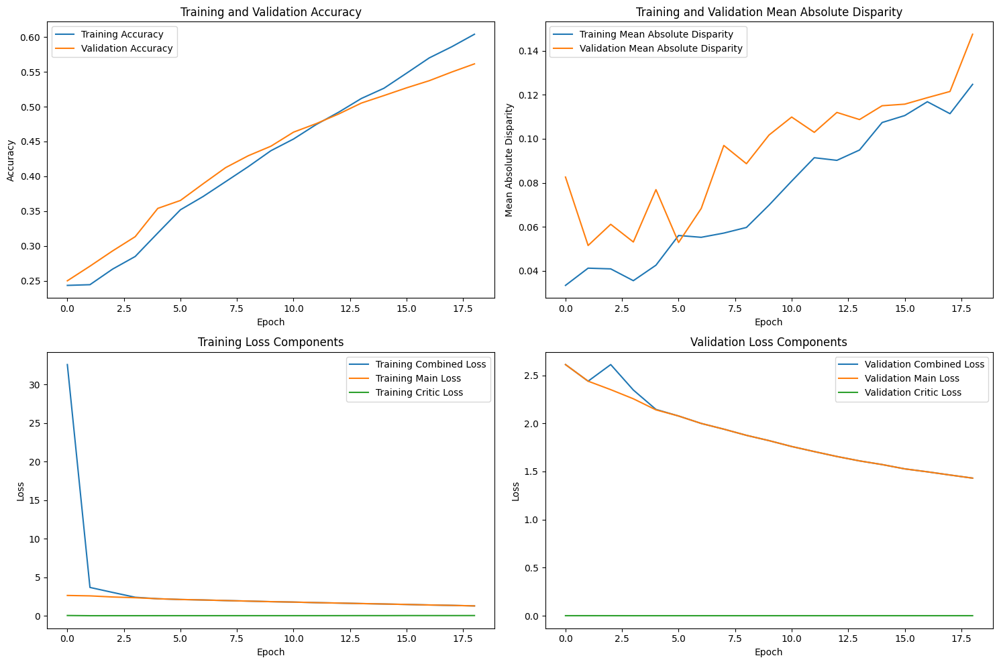

Epoch 20/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 150 - Epoch 20 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.622743, VALIDATION Accuracy: 0.5693
TRAINING Disparity: 0.136141, VALIDATION Disparity: 0.1455
TRAINING Combined Loss: 1.215305, VALIDATION Combined Loss: 1.4127
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.08600381579097693
Class Celebration: Val Disparity = 0.025247524752475214
Class Parade: Val Disparity = 0.08712121212121204
Class Waiter_Or_Waitress: Val Disparity = -0.12485681557846506
Class Individual_Sports: Val Disparity = -0.1334659800249688
Class Surgeons: Val Disparity = -0.11899482631189956
Class Spa: Val Disparity = -0.4583333333333333
Class Law_Enforcement: Val Disparity = 0.23755868544600933
Class Business: Val Disparity = -0.0038326413286490224
Class Dresses: Val Disparity = -0.5758483033932135
Class Water_Activities: Val Disparity = 0.05418352139663607
Class Picnic: Val Disparity = -0.1764705882352942
Class Rescue: Val Disp

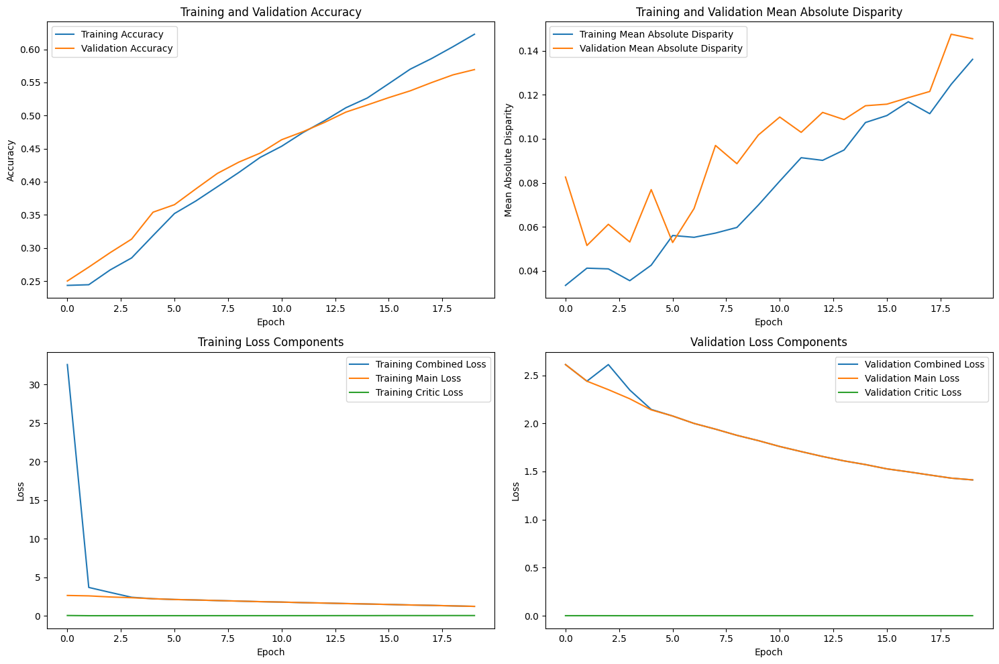

Epoch 21/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.29it/s]



Lambda 150 - Epoch 21 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.644637, VALIDATION Accuracy: 0.5784
TRAINING Disparity: 0.115758, VALIDATION Disparity: 0.1516
TRAINING Combined Loss: 1.159084, VALIDATION Combined Loss: 1.3922
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06924403925466394
Class Celebration: Val Disparity = 0.03524752475247528
Class Parade: Val Disparity = 0.08996212121212122
Class Waiter_Or_Waitress: Val Disparity = -0.06109201985490653
Class Individual_Sports: Val Disparity = -0.15082709113607995
Class Surgeons: Val Disparity = -0.015521064301552145
Class Spa: Val Disparity = -0.5833333333333333
Class Law_Enforcement: Val Disparity = 0.20938967136150233
Class Business: Val Disparity = -0.005536037474715205
Class Dresses: Val Disparity = -0.563872255489022
Class Water_Activities: Val Disparity = 0.021396636150734616
Class Picnic: Val Disparity = -0.30718954248366015
Class Rescue: Val Dis

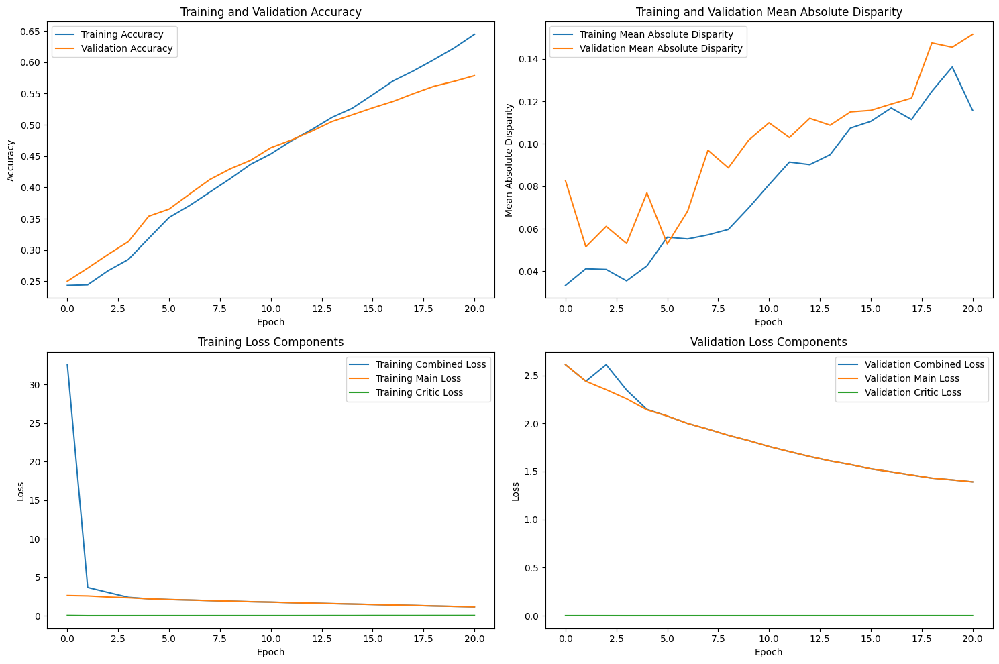

Epoch 22/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.24it/s]



Lambda 150 - Epoch 22 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.668268, VALIDATION Accuracy: 0.5867
TRAINING Disparity: 0.110086, VALIDATION Disparity: 0.1488
TRAINING Combined Loss: 1.089119, VALIDATION Combined Loss: 1.3705
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.08286207172316096
Class Celebration: Val Disparity = 0.04534653465346533
Class Parade: Val Disparity = 0.05303030303030298
Class Waiter_Or_Waitress: Val Disparity = -0.07140129820542196
Class Individual_Sports: Val Disparity = -0.1232443820224719
Class Surgeons: Val Disparity = 0.014781966001478297
Class Spa: Val Disparity = -0.6874999999999999
Class Law_Enforcement: Val Disparity = 0.1586854460093896
Class Business: Val Disparity = 0.020227829234536365
Class Dresses: Val Disparity = -0.563872255489022
Class Water_Activities: Val Disparity = 0.02001277411113478
Class Picnic: Val Disparity = -0.23529411764705882
Class Rescue: Val Disparit

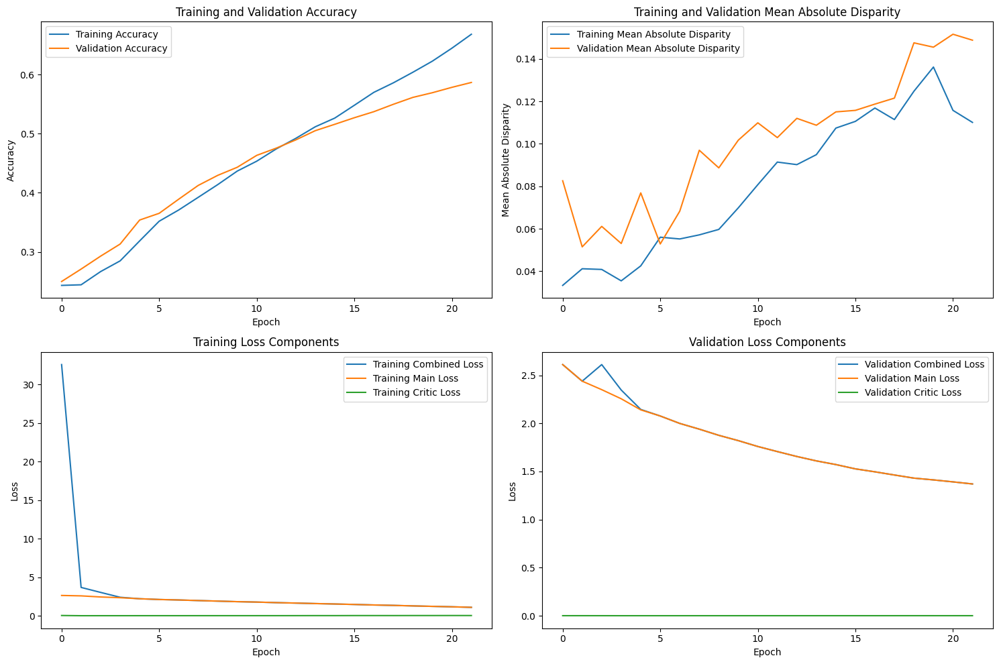

Epoch 23/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.06it/s]



Lambda 150 - Epoch 23 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.683931, VALIDATION Accuracy: 0.5898
TRAINING Disparity: 0.117078, VALIDATION Disparity: 0.1423
TRAINING Combined Loss: 1.027720, VALIDATION Combined Loss: 1.3696
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07128902902971523
Class Celebration: Val Disparity = 0.025346534653465258
Class Parade: Val Disparity = 0.07859848484848486
Class Waiter_Or_Waitress: Val Disparity = -0.04467353951890052
Class Individual_Sports: Val Disparity = -0.09300873907615481
Class Surgeons: Val Disparity = 0.03917220990391734
Class Spa: Val Disparity = -0.625
Class Law_Enforcement: Val Disparity = 0.17981220657277008
Class Business: Val Disparity = 0.0366230171404236
Class Dresses: Val Disparity = -0.5459081836327346
Class Water_Activities: Val Disparity = 0.0411965084096233
Class Picnic: Val Disparity = -0.23529411764705882
Class Rescue: Val Disparity = 0.0096256

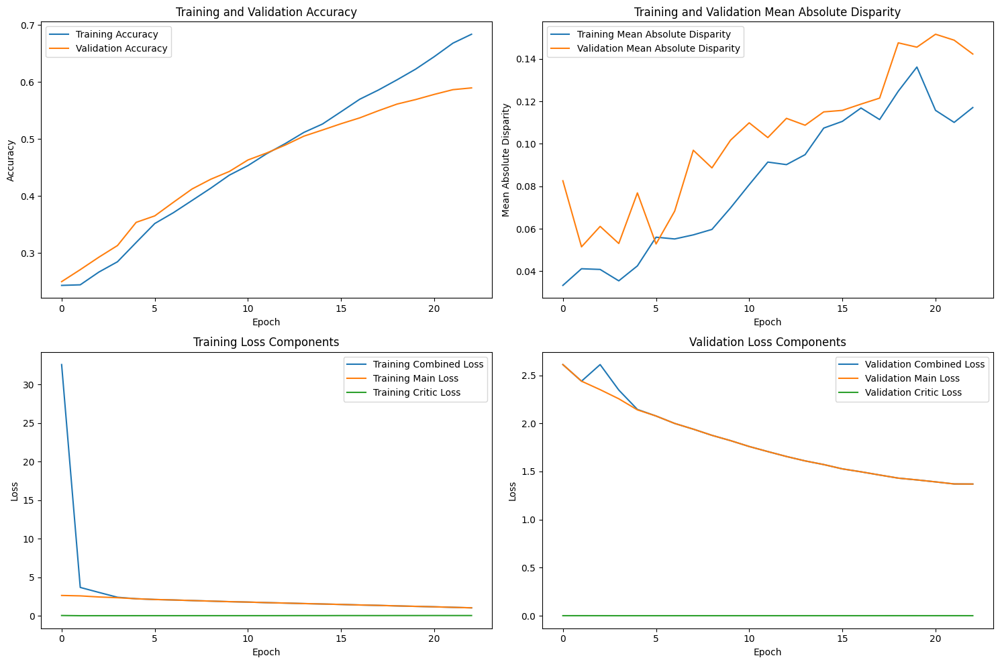

Epoch 24/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 150 - Epoch 24 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.707967, VALIDATION Accuracy: 0.5941
TRAINING Disparity: 0.115867, VALIDATION Disparity: 0.1413
TRAINING Combined Loss: 0.947877, VALIDATION Combined Loss: 1.3556
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07074065188333267
Class Celebration: Val Disparity = -0.004455445544554459
Class Parade: Val Disparity = 0.09280303030303017
Class Waiter_Or_Waitress: Val Disparity = -0.06529209621993148
Class Individual_Sports: Val Disparity = -0.1120084269662921
Class Surgeons: Val Disparity = 0.04508499630450841
Class Spa: Val Disparity = -0.6249999999999999
Class Law_Enforcement: Val Disparity = 0.11643192488262932
Class Business: Val Disparity = 0.025018630895347505
Class Dresses: Val Disparity = -0.5698602794411178
Class Water_Activities: Val Disparity = 0.04321907600596131
Class Picnic: Val Disparity = -0.25490196078431376
Class Rescue: Val Dispa

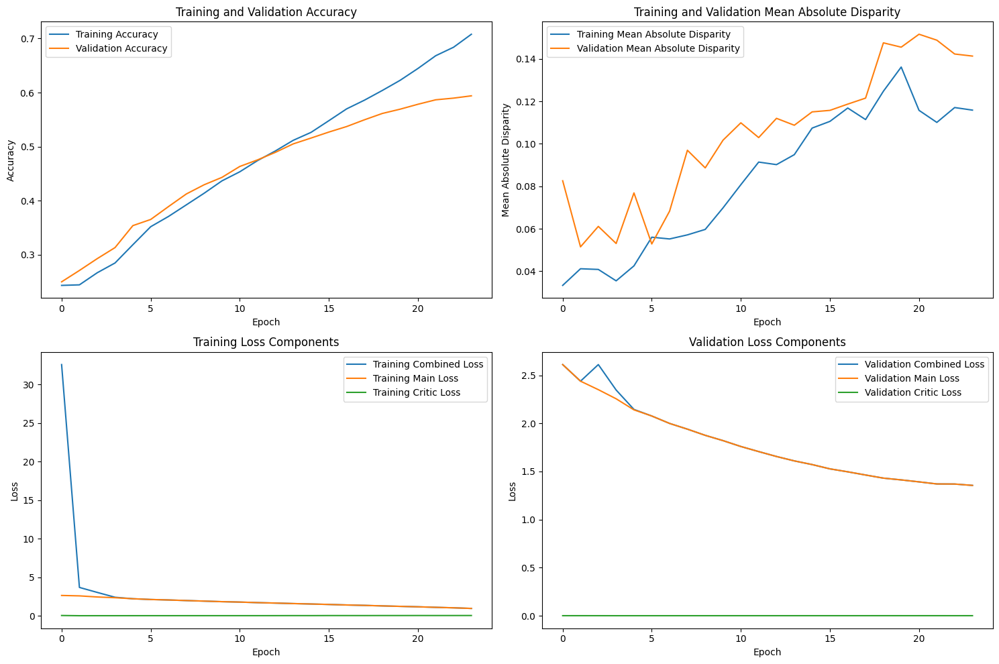

Epoch 25/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.24it/s]



Lambda 150 - Epoch 25 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.729012, VALIDATION Accuracy: 0.6012
TRAINING Disparity: 0.104699, VALIDATION Disparity: 0.1449
TRAINING Combined Loss: 0.874573, VALIDATION Combined Loss: 1.3634
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07074065188333267
Class Celebration: Val Disparity = -0.004455445544554459
Class Parade: Val Disparity = 0.09280303030303017
Class Waiter_Or_Waitress: Val Disparity = -0.06529209621993148
Class Individual_Sports: Val Disparity = -0.1120084269662921
Class Surgeons: Val Disparity = 0.04508499630450841
Class Spa: Val Disparity = -0.6249999999999999
Class Law_Enforcement: Val Disparity = 0.11643192488262932
Class Business: Val Disparity = 0.025018630895347505
Class Dresses: Val Disparity = -0.5698602794411178
Class Water_Activities: Val Disparity = 0.04321907600596131
Class Picnic: Val Disparity = -0.25490196078431376
Class Rescue: Val Dispa

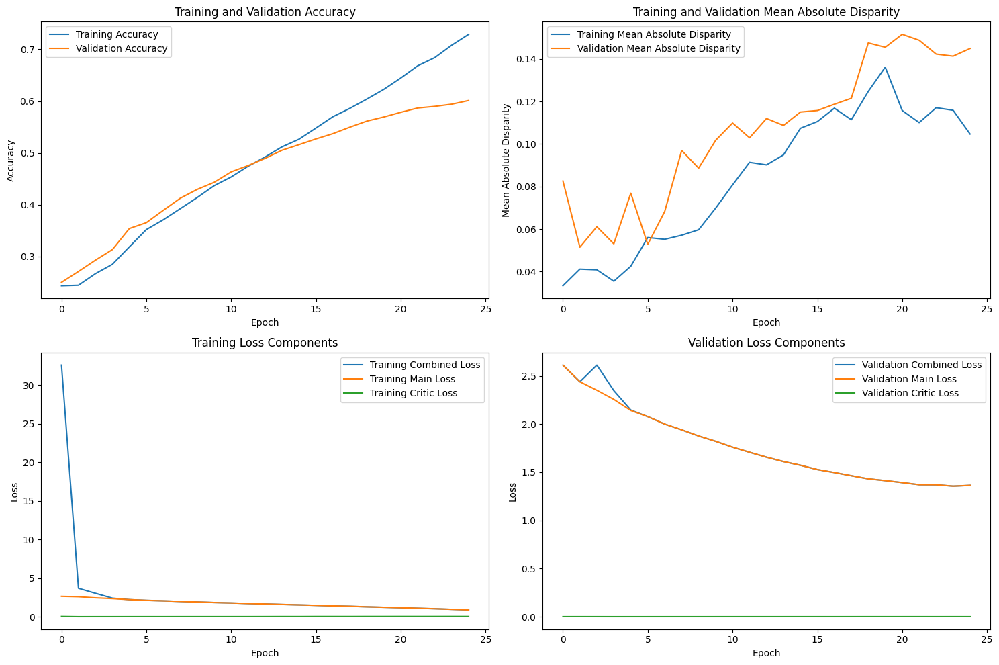

Epoch 26/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 150 - Epoch 26 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.759819, VALIDATION Accuracy: 0.5989
TRAINING Disparity: 0.128908, VALIDATION Disparity: 0.1686
TRAINING Combined Loss: 0.792553, VALIDATION Combined Loss: 1.3674
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07074065188333267
Class Celebration: Val Disparity = -0.004455445544554459
Class Parade: Val Disparity = 0.09280303030303017
Class Waiter_Or_Waitress: Val Disparity = -0.06529209621993148
Class Individual_Sports: Val Disparity = -0.1120084269662921
Class Surgeons: Val Disparity = 0.04508499630450841
Class Spa: Val Disparity = -0.6249999999999999
Class Law_Enforcement: Val Disparity = 0.11643192488262932
Class Business: Val Disparity = 0.025018630895347505
Class Dresses: Val Disparity = -0.5698602794411178
Class Water_Activities: Val Disparity = 0.04321907600596131
Class Picnic: Val Disparity = -0.25490196078431376
Class Rescue: Val Dispa

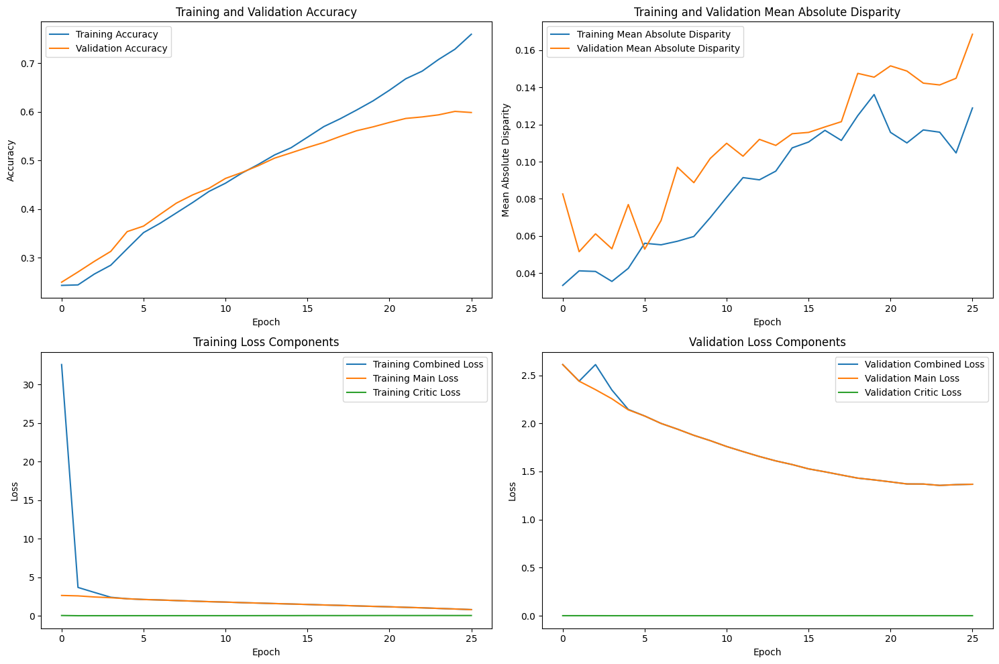

Epoch 27/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]



Lambda 150 - Epoch 27 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.778819, VALIDATION Accuracy: 0.5924
TRAINING Disparity: 0.105642, VALIDATION Disparity: 0.1637
TRAINING Combined Loss: 0.712996, VALIDATION Combined Loss: 1.4245
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07074065188333267
Class Celebration: Val Disparity = -0.004455445544554459
Class Parade: Val Disparity = 0.09280303030303017
Class Waiter_Or_Waitress: Val Disparity = -0.06529209621993148
Class Individual_Sports: Val Disparity = -0.1120084269662921
Class Surgeons: Val Disparity = 0.04508499630450841
Class Spa: Val Disparity = -0.6249999999999999
Class Law_Enforcement: Val Disparity = 0.11643192488262932
Class Business: Val Disparity = 0.025018630895347505
Class Dresses: Val Disparity = -0.5698602794411178
Class Water_Activities: Val Disparity = 0.04321907600596131
Class Picnic: Val Disparity = -0.25490196078431376
Class Rescue: Val Dispa

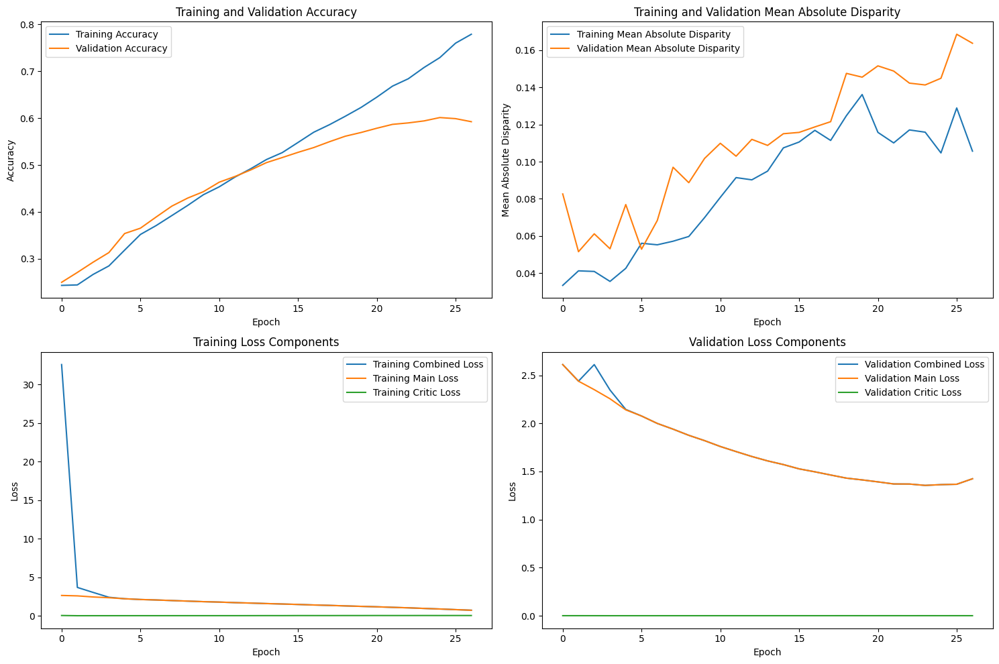

Epoch 28/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 150 - Epoch 28 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.806462, VALIDATION Accuracy: 0.5881
TRAINING Disparity: 0.090672, VALIDATION Disparity: 0.1431
TRAINING Combined Loss: 0.636181, VALIDATION Combined Loss: 1.4395
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07074065188333267
Class Celebration: Val Disparity = -0.004455445544554459
Class Parade: Val Disparity = 0.09280303030303017
Class Waiter_Or_Waitress: Val Disparity = -0.06529209621993148
Class Individual_Sports: Val Disparity = -0.1120084269662921
Class Surgeons: Val Disparity = 0.04508499630450841
Class Spa: Val Disparity = -0.6249999999999999
Class Law_Enforcement: Val Disparity = 0.11643192488262932
Class Business: Val Disparity = 0.025018630895347505
Class Dresses: Val Disparity = -0.5698602794411178
Class Water_Activities: Val Disparity = 0.04321907600596131
Class Picnic: Val Disparity = -0.25490196078431376
Class Rescue: Val Dispa

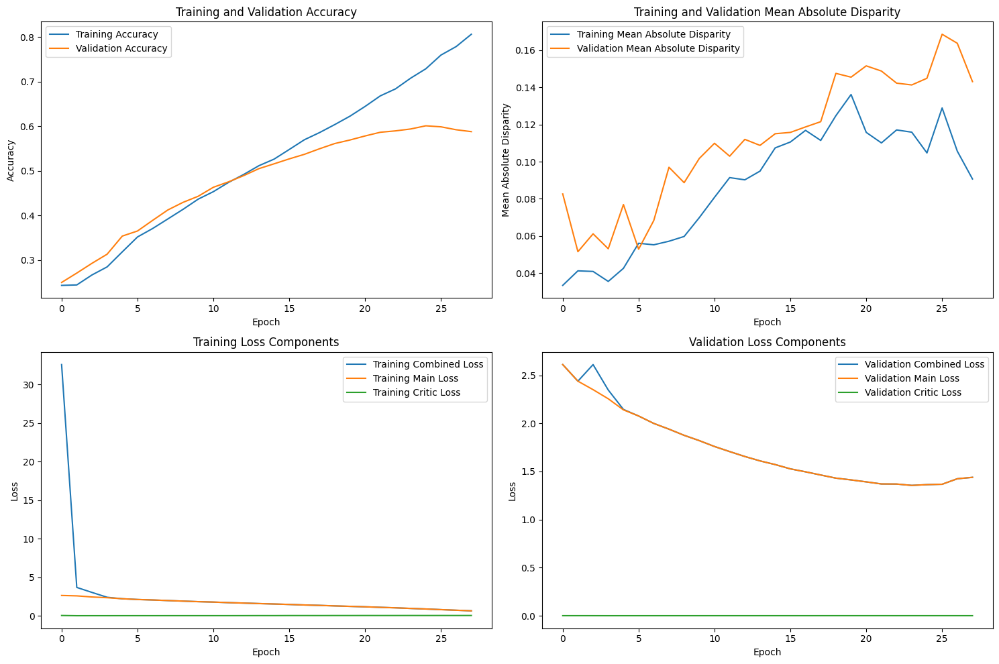

Epoch 29/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.18it/s]



Lambda 150 - Epoch 29 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.840201, VALIDATION Accuracy: 0.5926
TRAINING Disparity: 0.082313, VALIDATION Disparity: 0.1222
TRAINING Combined Loss: 0.538417, VALIDATION Combined Loss: 1.4844
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07074065188333267
Class Celebration: Val Disparity = -0.004455445544554459
Class Parade: Val Disparity = 0.09280303030303017
Class Waiter_Or_Waitress: Val Disparity = -0.06529209621993148
Class Individual_Sports: Val Disparity = -0.1120084269662921
Class Surgeons: Val Disparity = 0.04508499630450841
Class Spa: Val Disparity = -0.6249999999999999
Class Law_Enforcement: Val Disparity = 0.11643192488262932
Class Business: Val Disparity = 0.025018630895347505
Class Dresses: Val Disparity = -0.5698602794411178
Class Water_Activities: Val Disparity = 0.04321907600596131
Class Picnic: Val Disparity = -0.25490196078431376
Class Rescue: Val Dispa

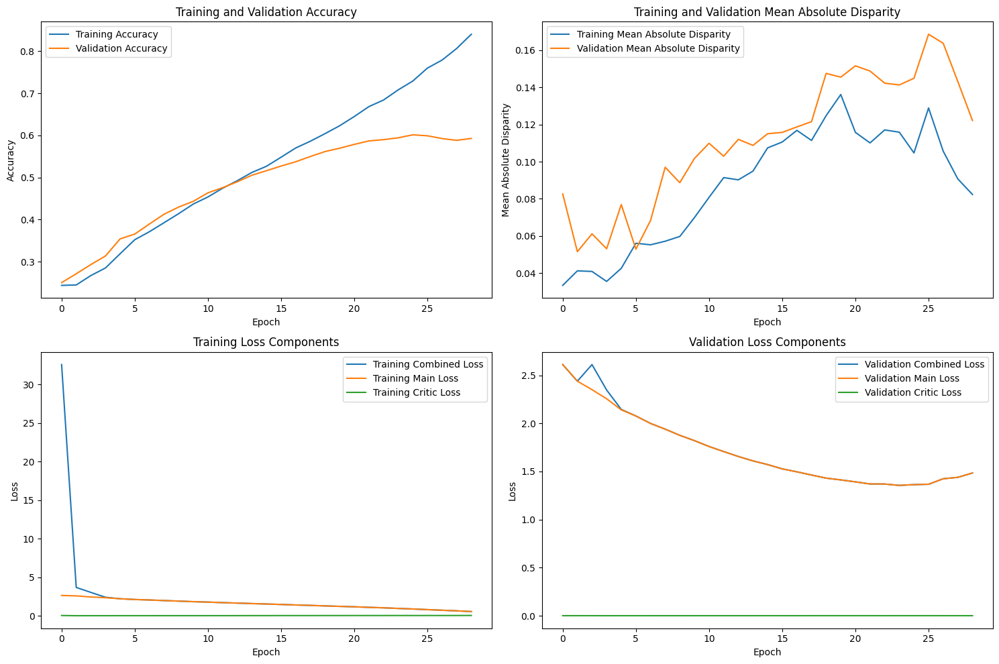

Epoch 30/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.19it/s]


Early stopping triggered at epoch 30
Finished Training with lambda value of 150. Best (stopping) epoch number: 24


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.12it/s]



Lambda 200 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.253819, VALIDATION Accuracy: 0.2574
TRAINING Disparity: 0.026076, VALIDATION Disparity: 0.0852
TRAINING Combined Loss: 39.536287, VALIDATION Combined Loss: 4.3295
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07632724406210367
Class Celebration: Val Disparity = 0.0814356435643564
Class Parade: Val Disparity = 0.0340909090909091
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.0037063046192259697
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.13544600938967133
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.30039920159680633
Class Water_Activities: Val Disparity = 0.07909303810943152
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: V

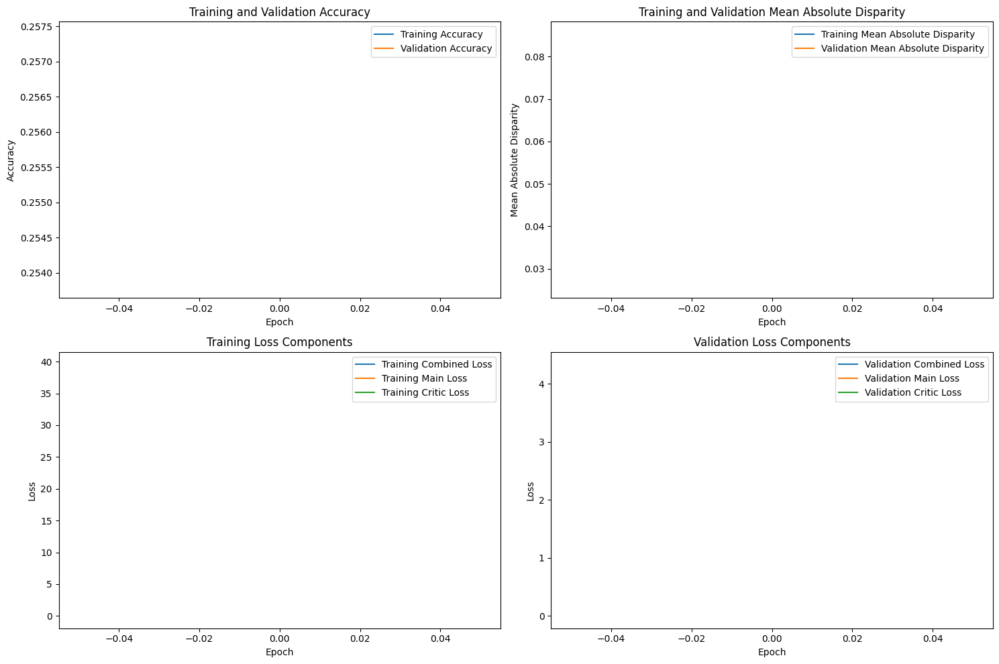

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 200 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.268017, VALIDATION Accuracy: 0.2801
TRAINING Disparity: 0.046259, VALIDATION Disparity: 0.0399
TRAINING Combined Loss: 4.320656, VALIDATION Combined Loss: 3.0438
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.011196033405307837
Class Celebration: Val Disparity = -0.046782178217821824
Class Parade: Val Disparity = -0.03219696969696967
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.04014513108614226
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.07840375586854459
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.07984031936127745
Class Water_Activities: Val Disparity = 0.0741962955077709
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.011764705882352941
Class Cheering: Val Disparity = 0.0
Class Performance_A

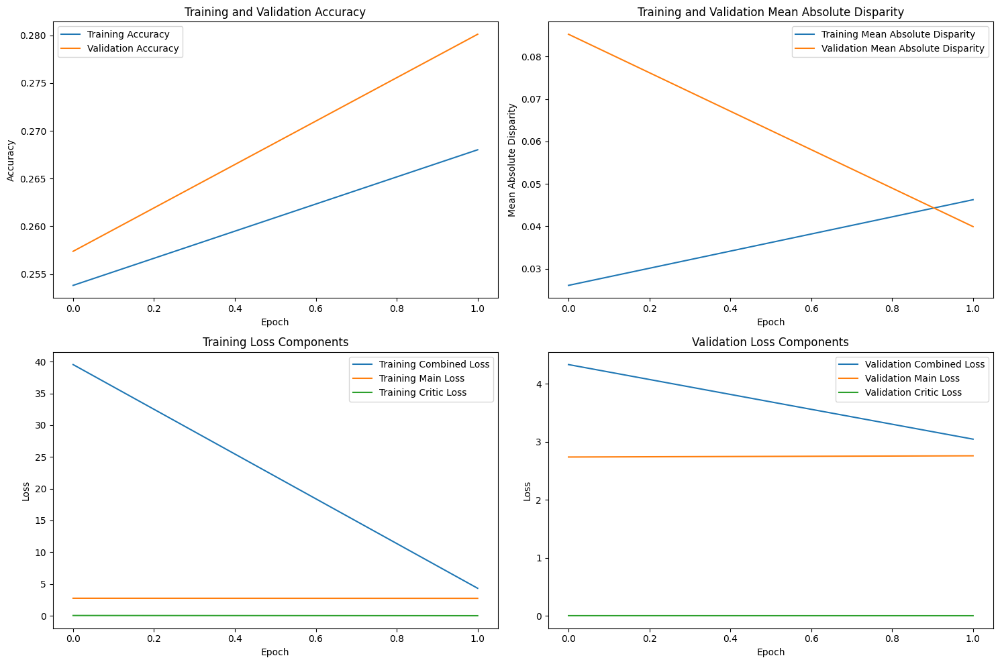

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.29it/s]



Lambda 200 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.272338, VALIDATION Accuracy: 0.2849
TRAINING Disparity: 0.051520, VALIDATION Disparity: 0.0574
TRAINING Combined Loss: 3.064720, VALIDATION Combined Loss: 2.7036
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.024311386822954084
Class Celebration: Val Disparity = 0.032920792079207895
Class Parade: Val Disparity = -0.03409090909090906
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.0342150436953807
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.152112676056338
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.09880239520958073
Class Water_Activities: Val Disparity = 0.04960613157334476
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.03529411764705882
Class Cheering: Val Disparity = 0.0
Class Performance_And_E

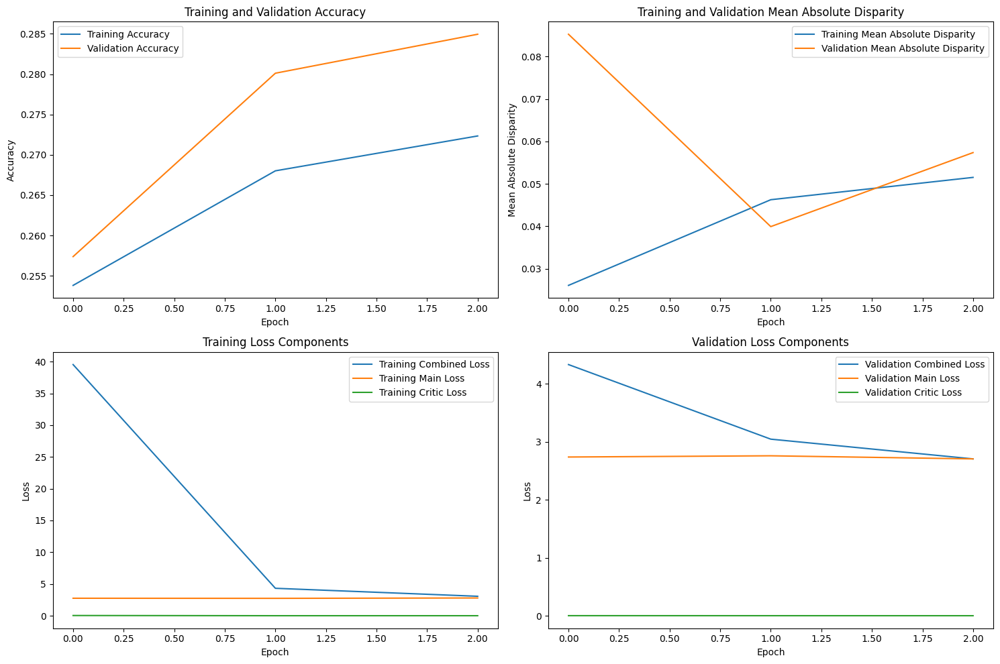

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.32it/s]



Lambda 200 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.291223, VALIDATION Accuracy: 0.3054
TRAINING Disparity: 0.054248, VALIDATION Disparity: 0.1004
TRAINING Combined Loss: 2.625087, VALIDATION Combined Loss: 5.1057
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.024311386822954084
Class Celebration: Val Disparity = 0.032920792079207895
Class Parade: Val Disparity = -0.03409090909090906
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.0342150436953807
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.152112676056338
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.09880239520958073
Class Water_Activities: Val Disparity = 0.04960613157334476
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.03529411764705882
Class Cheering: Val Disparity = 0.0
Class Performance_And_E

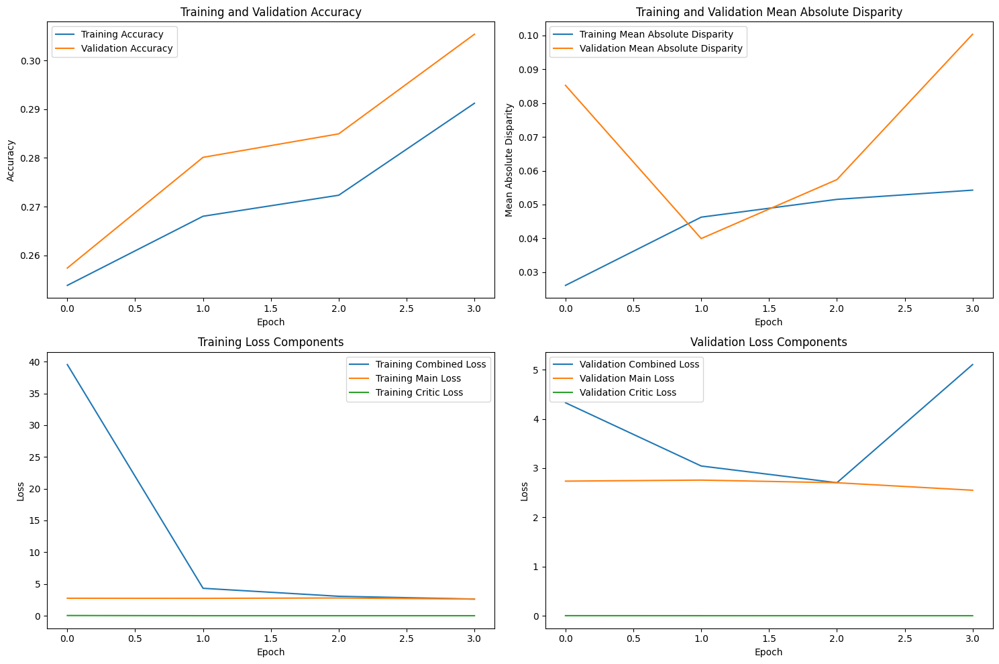

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.33it/s]



Lambda 200 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.311902, VALIDATION Accuracy: 0.3028
TRAINING Disparity: 0.041948, VALIDATION Disparity: 0.0721
TRAINING Combined Loss: 2.481210, VALIDATION Combined Loss: 2.5169
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.004706903839782561
Class Celebration: Val Disparity = 0.007920792079207928
Class Parade: Val Disparity = -0.017045454545454475
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = -0.04771379525593006
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.15328638497652575
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.2954091816367265
Class Water_Activities: Val Disparity = -0.006493506493506329
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainme

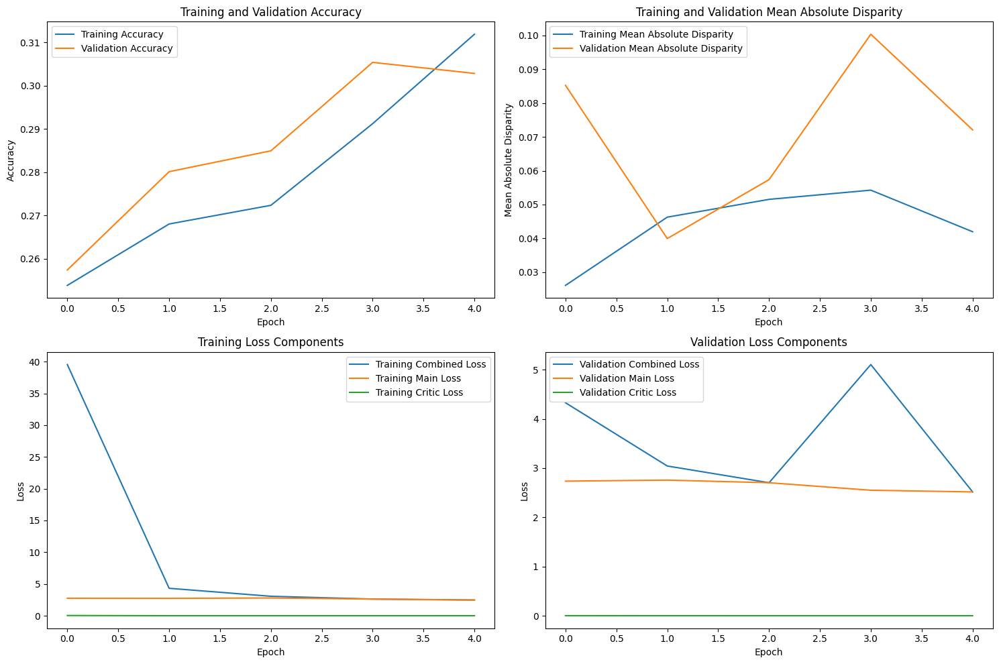

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 200 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.333681, VALIDATION Accuracy: 0.3403
TRAINING Disparity: 0.032056, VALIDATION Disparity: 0.0710
TRAINING Combined Loss: 2.372382, VALIDATION Combined Loss: 2.5997
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.004706903839782561
Class Celebration: Val Disparity = 0.007920792079207928
Class Parade: Val Disparity = -0.017045454545454475
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = -0.04771379525593006
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.15328638497652575
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.2954091816367265
Class Water_Activities: Val Disparity = -0.006493506493506329
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainme

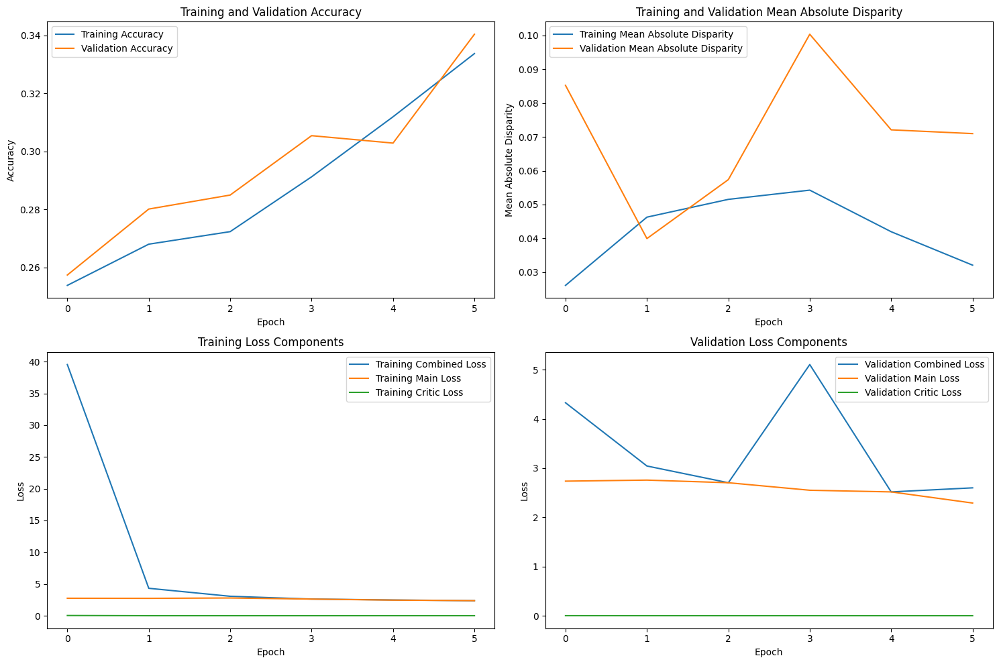

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.34it/s]



Lambda 200 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.342959, VALIDATION Accuracy: 0.3500
TRAINING Disparity: 0.038268, VALIDATION Disparity: 0.0560
TRAINING Combined Loss: 2.540260, VALIDATION Combined Loss: 2.3226
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.0002856130970741999
Class Celebration: Val Disparity = 0.031138613861386166
Class Parade: Val Disparity = 0.04356060606060608
Class Waiter_Or_Waitress: Val Disparity = -0.035127911416571206
Class Individual_Sports: Val Disparity = -0.10061641697877655
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.12253521126760558
Class Business: Val Disparity = -0.010752688172043012
Class Dresses: Val Disparity = 0.15169660678642705
Class Water_Activities: Val Disparity = 0.026293378752395125
Class Picnic: Val Disparity = -0.0196078431372549
Class Rescue: Val Disparity = 0.023529411764705882


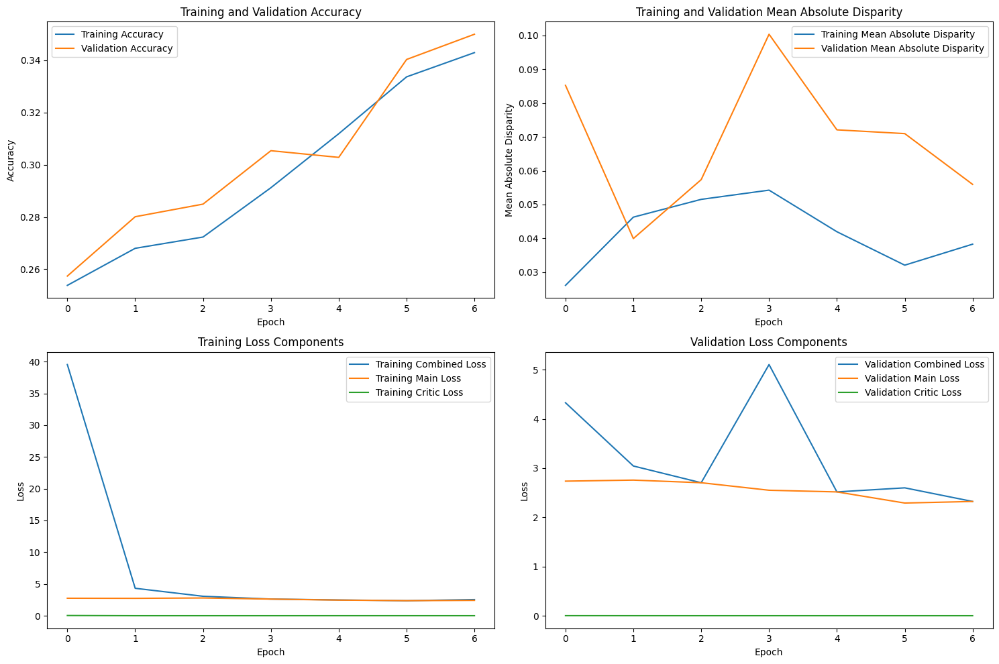

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.27it/s]



Lambda 200 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.338773, VALIDATION Accuracy: 0.3497
TRAINING Disparity: 0.039816, VALIDATION Disparity: 0.0558
TRAINING Combined Loss: 2.473737, VALIDATION Combined Loss: 2.3060
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.01719390844386559
Class Celebration: Val Disparity = 0.012821782178217805
Class Parade: Val Disparity = -0.011363636363636354
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = -0.05465823970037448
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.16032863849765255
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.03792415169660668
Class Water_Activities: Val Disparity = 0.043325526932084246
Class Picnic: Val Disparity = -0.0196078431372549
Class Rescue: Val Disparity = 0.011764705882352941
Class Cheering: Val Disparity = 0.0


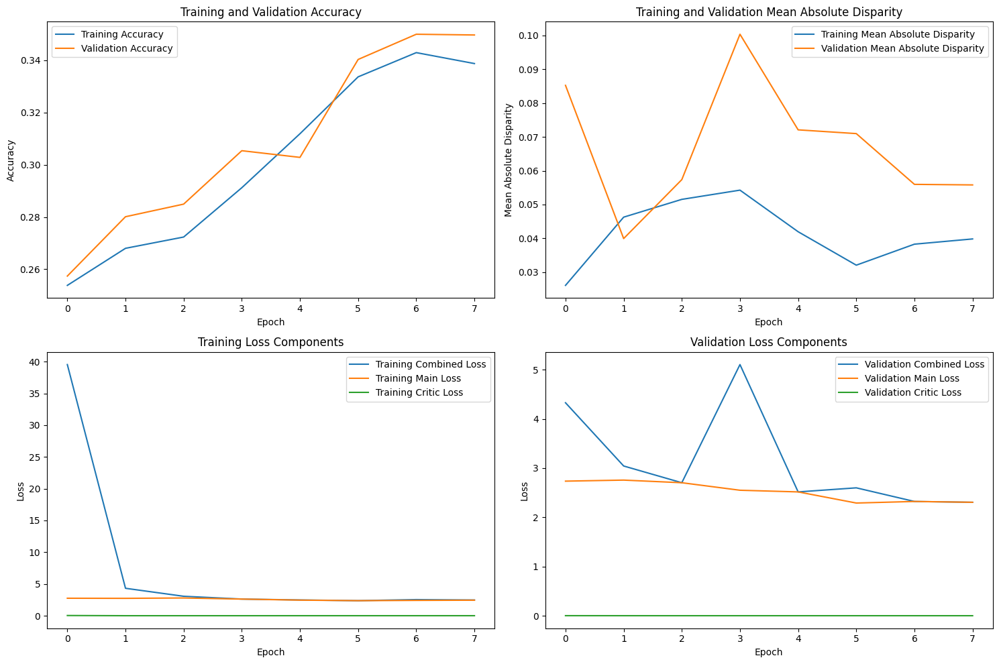

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.24it/s]



Lambda 200 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.368981, VALIDATION Accuracy: 0.3861
TRAINING Disparity: 0.029111, VALIDATION Disparity: 0.0624
TRAINING Combined Loss: 2.157632, VALIDATION Combined Loss: 2.0905
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.00026276404930813957
Class Celebration: Val Disparity = 0.04683168316831682
Class Parade: Val Disparity = 0.08428030303030298
Class Waiter_Or_Waitress: Val Disparity = -0.0660557464681176
Class Individual_Sports: Val Disparity = -0.10245006242197263
Class Surgeons: Val Disparity = 0.024390243902439022
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.09999999999999998
Class Business: Val Disparity = -0.027467262855317795
Class Dresses: Val Disparity = -0.1706586826347305
Class Water_Activities: Val Disparity = 0.02075793059399622
Class Picnic: Val Disparity = -0.0196078431372549
Class Rescue: Val Disparity = 0.023529

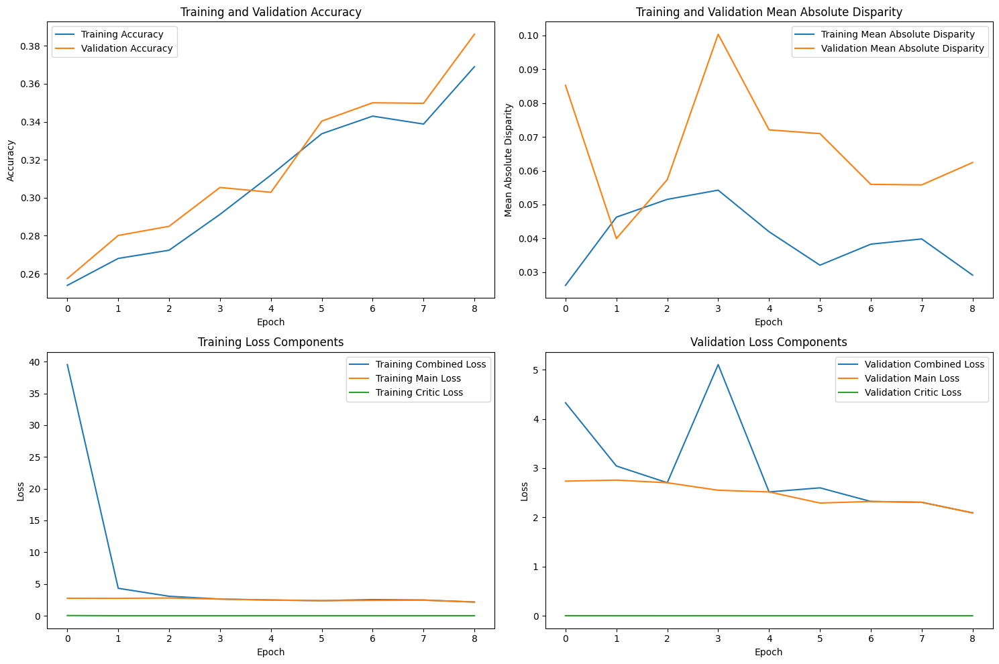

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.19it/s]



Lambda 200 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.410262, VALIDATION Accuracy: 0.4199
TRAINING Disparity: 0.056562, VALIDATION Disparity: 0.0925
TRAINING Combined Loss: 1.999159, VALIDATION Combined Loss: 1.9742
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.028344243753641418
Class Celebration: Val Disparity = 0.05163366336633657
Class Parade: Val Disparity = 0.048295454545454586
Class Waiter_Or_Waitress: Val Disparity = -0.07903780068728528
Class Individual_Sports: Val Disparity = -0.1104088639200998
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.12816901408450698
Class Business: Val Disparity = -0.13275843713403596
Class Dresses: Val Disparity = -0.28343313373253504
Class Water_Activities: Val Disparity = 0.04534809452842248
Class Picnic: Val Disparity = -0.0392156862745098
Class Rescue: Val Disparity = 0.023529411764705882
Clas

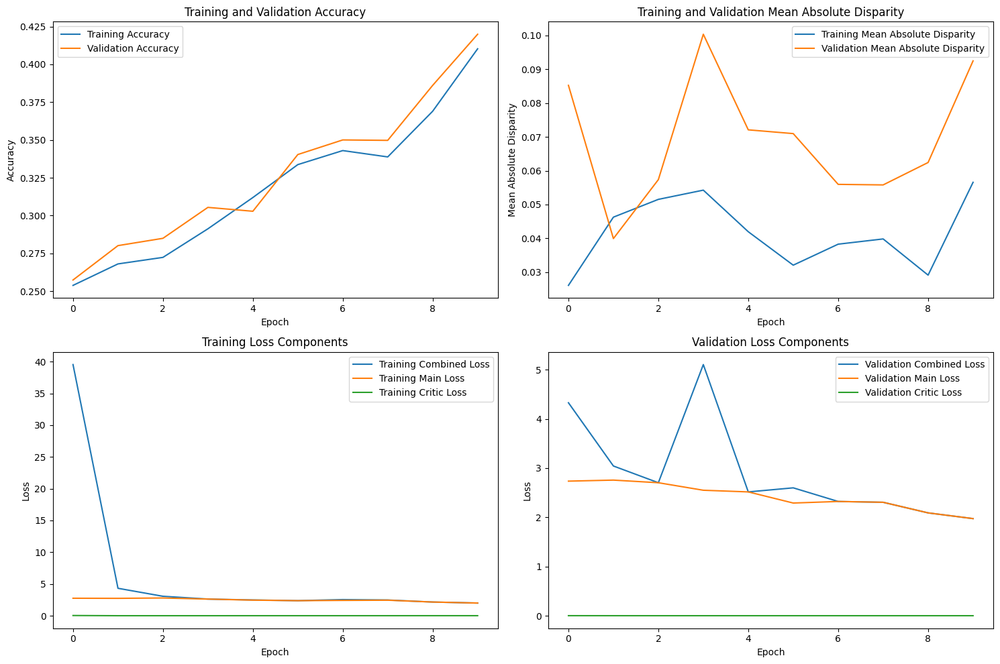

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.19it/s]



Lambda 200 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.433102, VALIDATION Accuracy: 0.4369
TRAINING Disparity: 0.061756, VALIDATION Disparity: 0.0989
TRAINING Combined Loss: 1.902199, VALIDATION Combined Loss: 1.8943
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.041014040739852264
Class Celebration: Val Disparity = 0.08133663366336624
Class Parade: Val Disparity = 0.05397727272727271
Class Waiter_Or_Waitress: Val Disparity = -0.16151202749140897
Class Individual_Sports: Val Disparity = -0.0905898876404494
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.12746478873239436
Class Business: Val Disparity = -0.025550942190993298
Class Dresses: Val Disparity = -0.35528942115768464
Class Water_Activities: Val Disparity = 0.02895465190547164
Class Picnic: Val Disparity = -0.0392156862745098
Class Rescue: Val Disparity = 0.03529411764705882
Class

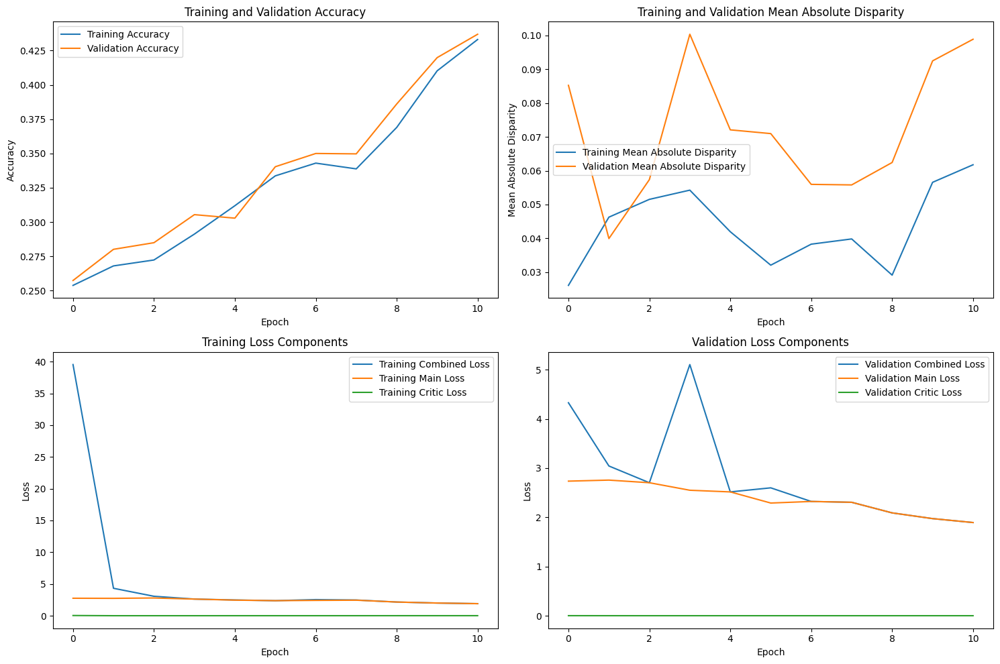

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 200 - Epoch 12 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.455150, VALIDATION Accuracy: 0.4582
TRAINING Disparity: 0.072896, VALIDATION Disparity: 0.0935
TRAINING Combined Loss: 1.822821, VALIDATION Combined Loss: 1.8213
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.02944099804640632
Class Celebration: Val Disparity = 0.03633663366336631
Class Parade: Val Disparity = 0.03693181818181823
Class Waiter_Or_Waitress: Val Disparity = -0.19243986254295536
Class Individual_Sports: Val Disparity = -0.10549313358302126
Class Surgeons: Val Disparity = 0.024390243902439022
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.13450704225352111
Class Business: Val Disparity = -0.019056744384115865
Class Dresses: Val Disparity = -0.33133732534930144
Class Water_Activities: Val Disparity = 0.06993825846284862
Class Picnic: Val Disparity = -0.09803921568627451
Class Rescue: Val Disparity = 0.03529

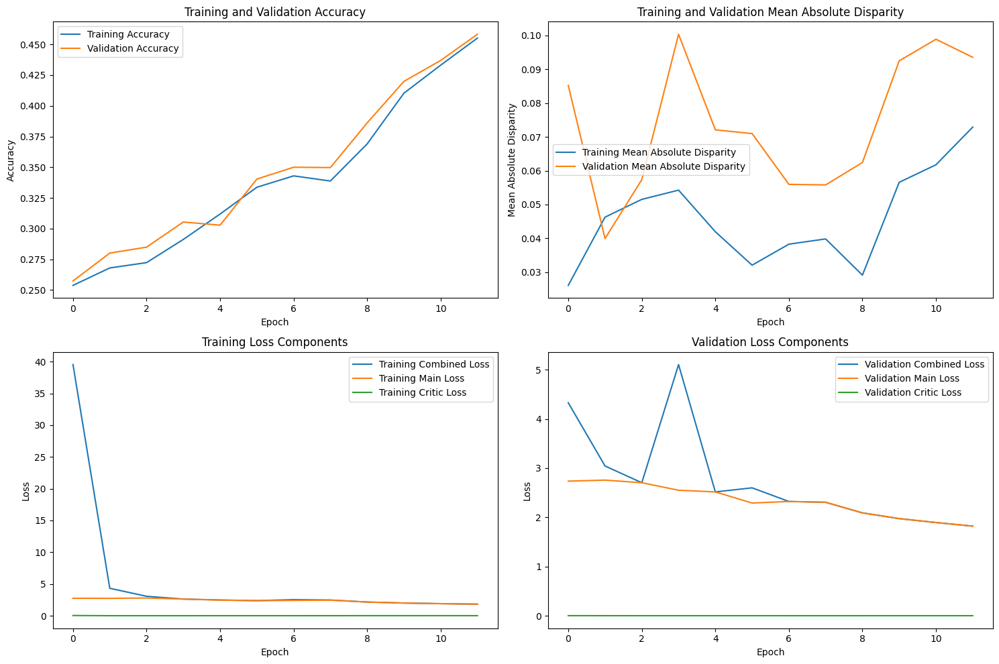

Epoch 13/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.27it/s]



Lambda 200 - Epoch 13 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.472743, VALIDATION Accuracy: 0.4705
TRAINING Disparity: 0.081679, VALIDATION Disparity: 0.0856
TRAINING Combined Loss: 1.748944, VALIDATION Combined Loss: 1.7600
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.050690612468725305
Class Celebration: Val Disparity = 0.03133663366336625
Class Parade: Val Disparity = -0.005681818181818121
Class Waiter_Or_Waitress: Val Disparity = -0.22336769759450176
Class Individual_Sports: Val Disparity = -0.0967150436953807
Class Surgeons: Val Disparity = -0.03621581670362159
Class Spa: Val Disparity = -0.041666666666666664
Class Law_Enforcement: Val Disparity = 0.1152582159624414
Class Business: Val Disparity = -0.01256254657723832
Class Dresses: Val Disparity = -0.3552894211576845
Class Water_Activities: Val Disparity = 0.03097721950180976
Class Picnic: Val Disparity = -0.11764705882352941
Class Rescue: Val Di

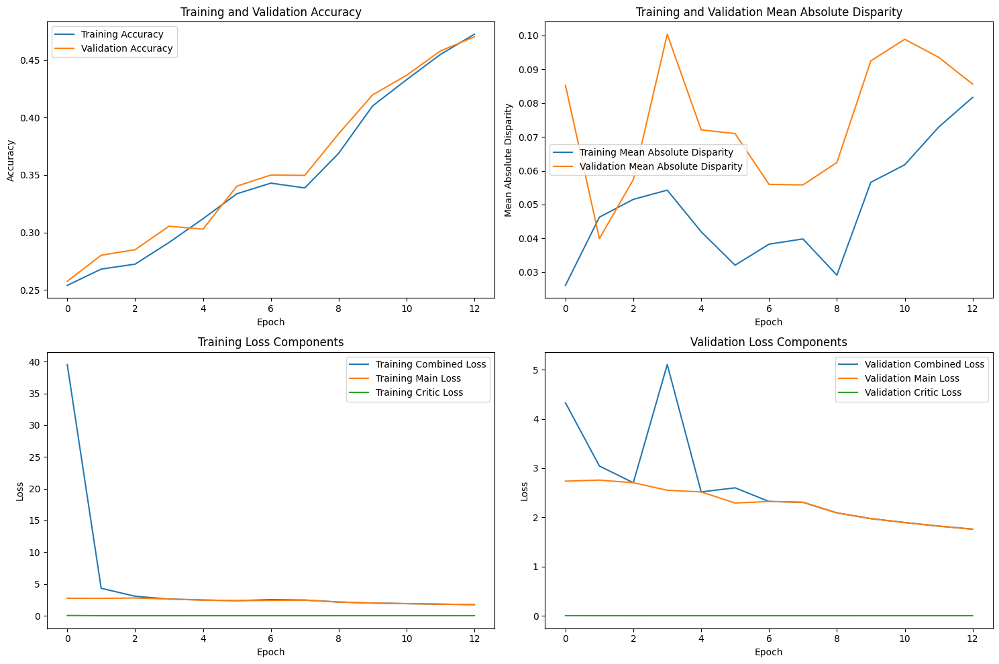

Epoch 14/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.24it/s]



Lambda 200 - Epoch 14 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.490856, VALIDATION Accuracy: 0.4875
TRAINING Disparity: 0.076280, VALIDATION Disparity: 0.0951
TRAINING Combined Loss: 1.677328, VALIDATION Combined Loss: 1.6976
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.03367949640698731
Class Celebration: Val Disparity = 0.07074257425742575
Class Parade: Val Disparity = 0.014204545454545525
Class Waiter_Or_Waitress: Val Disparity = -0.2294768995799924
Class Individual_Sports: Val Disparity = -0.11672908863920106
Class Surgeons: Val Disparity = -0.005912786400591282
Class Spa: Val Disparity = -0.08333333333333333
Class Law_Enforcement: Val Disparity = 0.16009389671361496
Class Business: Val Disparity = -0.012562546577238431
Class Dresses: Val Disparity = -0.313373253493014
Class Water_Activities: Val Disparity = 0.03917394081328507
Class Picnic: Val Disparity = -0.17647058823529413
Class Rescue: Val Dis

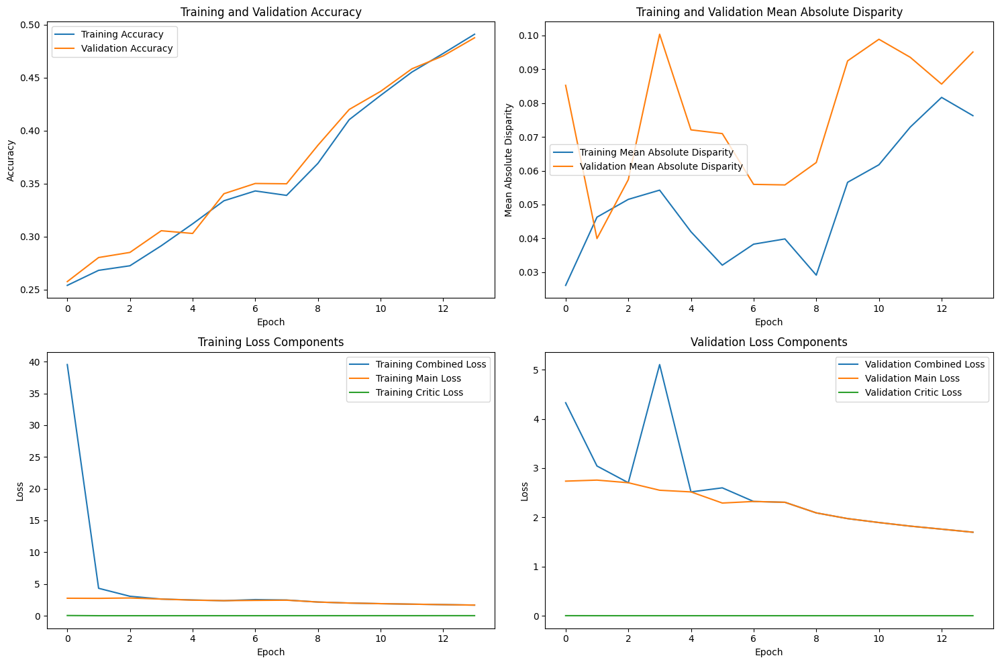

Epoch 15/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.29it/s]



Lambda 200 - Epoch 15 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.509047, VALIDATION Accuracy: 0.4995
TRAINING Disparity: 0.099056, VALIDATION Disparity: 0.1199
TRAINING Combined Loss: 1.606334, VALIDATION Combined Loss: 1.6453
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.04415578480766802
Class Celebration: Val Disparity = 0.07584158415841585
Class Parade: Val Disparity = 0.025568181818181768
Class Waiter_Or_Waitress: Val Disparity = -0.25429553264604815
Class Individual_Sports: Val Disparity = -0.14450686641697869
Class Surgeons: Val Disparity = -0.05395417590539543
Class Spa: Val Disparity = -0.14583333333333331
Class Law_Enforcement: Val Disparity = 0.16713615023474193
Class Business: Val Disparity = -0.013414244650271467
Class Dresses: Val Disparity = -0.3852295409181637
Class Water_Activities: Val Disparity = 0.029593357462210035
Class Picnic: Val Disparity = -0.21568627450980393
Class Rescue: Val D

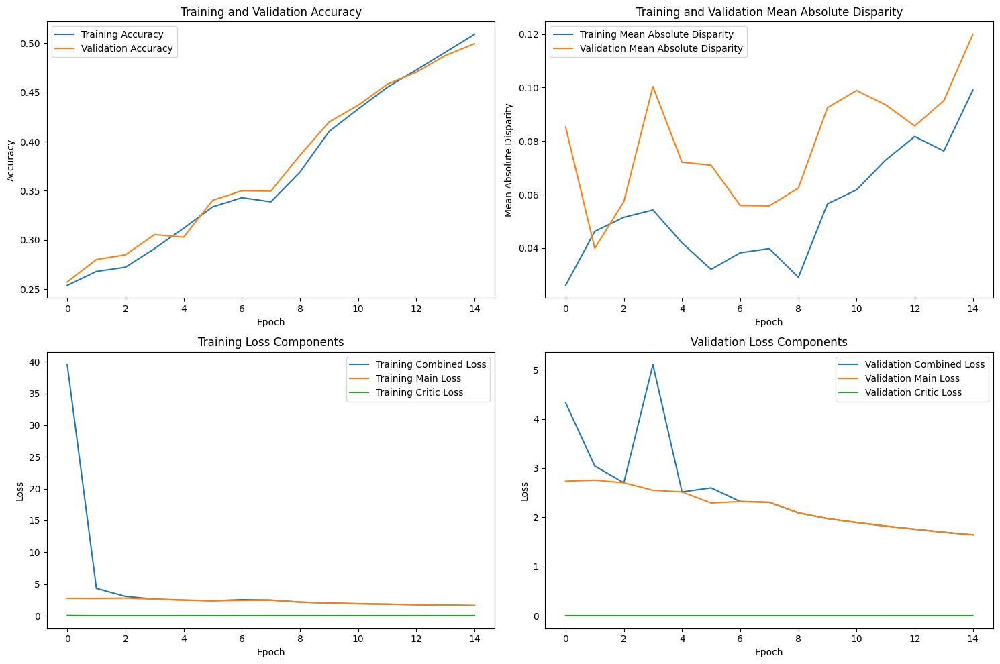

Epoch 16/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 200 - Epoch 16 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.527701, VALIDATION Accuracy: 0.5185
TRAINING Disparity: 0.099326, VALIDATION Disparity: 0.1189
TRAINING Combined Loss: 1.539713, VALIDATION Combined Loss: 1.5919
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.04131107836080916
Class Celebration: Val Disparity = 0.06074257425742574
Class Parade: Val Disparity = -0.0037878787878788955
Class Waiter_Or_Waitress: Val Disparity = -0.2646048109965636
Class Individual_Sports: Val Disparity = -0.16697877652933824
Class Surgeons: Val Disparity = -0.10864745011086475
Class Spa: Val Disparity = -0.1875
Class Law_Enforcement: Val Disparity = 0.1575117370892018
Class Business: Val Disparity = -0.036623017140423764
Class Dresses: Val Disparity = -0.39121756487025944
Class Water_Activities: Val Disparity = 0.03640621673408562
Class Picnic: Val Disparity = -0.07189542483660133
Class Rescue: Val Disparity = 0.

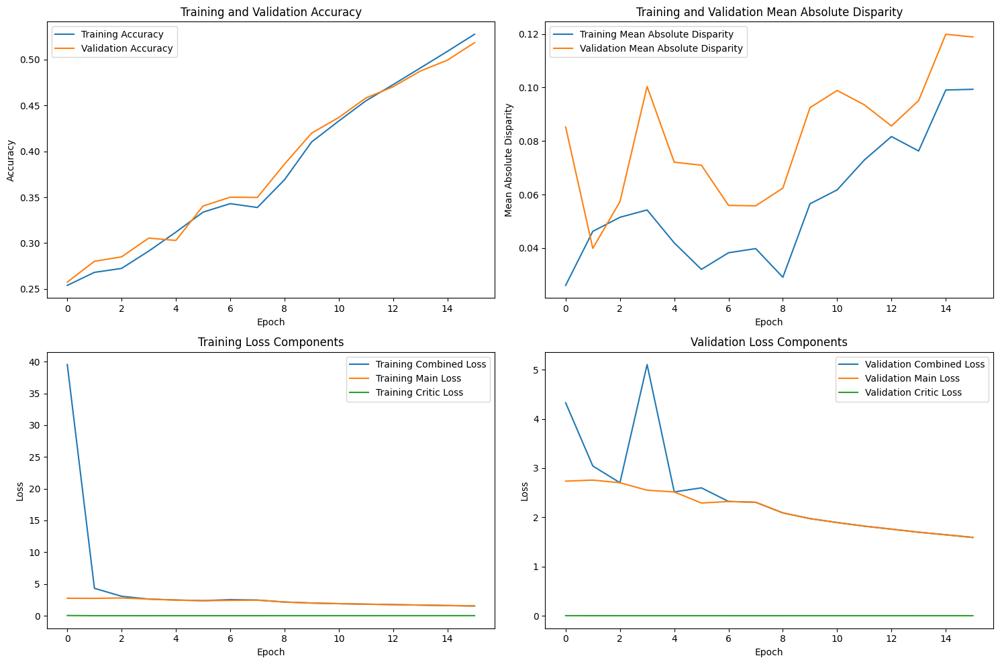

Epoch 17/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.29it/s]



Lambda 200 - Epoch 17 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.545775, VALIDATION Accuracy: 0.5288
TRAINING Disparity: 0.109635, VALIDATION Disparity: 0.1422
TRAINING Combined Loss: 1.480277, VALIDATION Combined Loss: 1.5502
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.04225931384309556
Class Celebration: Val Disparity = 0.031138613861386166
Class Parade: Val Disparity = -0.0037878787878790066
Class Waiter_Or_Waitress: Val Disparity = -0.2275677739595265
Class Individual_Sports: Val Disparity = -0.16799313358302126
Class Surgeons: Val Disparity = -0.04730229120473023
Class Spa: Val Disparity = -0.29166666666666663
Class Law_Enforcement: Val Disparity = 0.18380281690140848
Class Business: Val Disparity = -0.01682103694240389
Class Dresses: Val Disparity = -0.5818363273453095
Class Water_Activities: Val Disparity = 0.03097721950180976
Class Picnic: Val Disparity = 0.20261437908496732
Class Rescue: Val Di

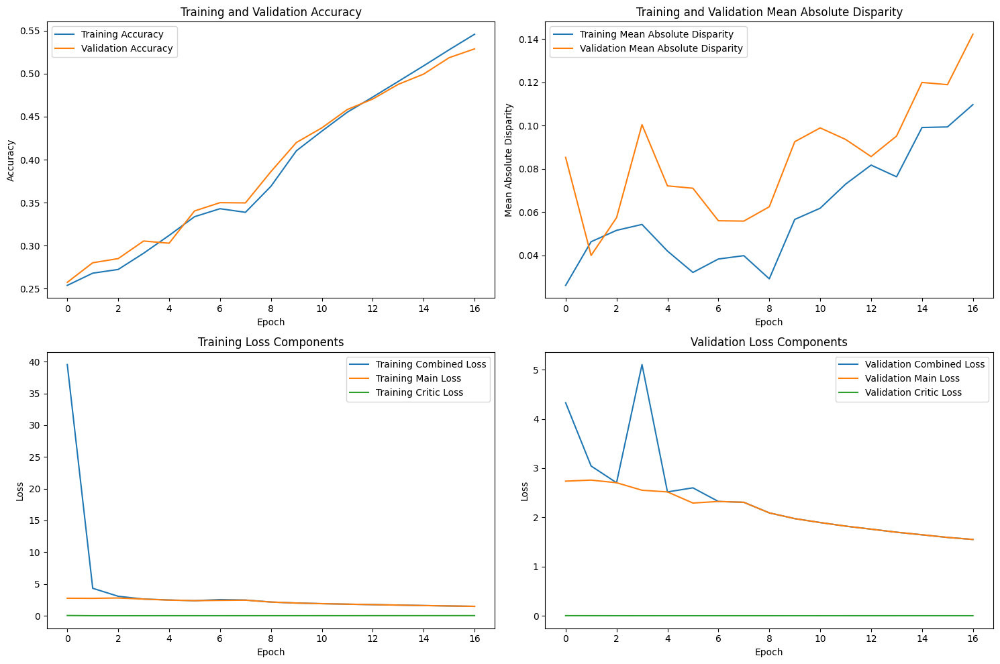

Epoch 18/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.21it/s]



Lambda 200 - Epoch 18 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.567496, VALIDATION Accuracy: 0.5367
TRAINING Disparity: 0.107278, VALIDATION Disparity: 0.1295
TRAINING Combined Loss: 1.420893, VALIDATION Combined Loss: 1.5121
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.03627286332842061
Class Celebration: Val Disparity = 0.031039603960396067
Class Parade: Val Disparity = -0.008522727272727293
Class Waiter_Or_Waitress: Val Disparity = -0.2894234440626193
Class Individual_Sports: Val Disparity = -0.18453495630461925
Class Surgeons: Val Disparity = -0.0953436807095343
Class Spa: Val Disparity = 0.18750000000000006
Class Law_Enforcement: Val Disparity = 0.1715962441314554
Class Business: Val Disparity = -0.01682103694240389
Class Dresses: Val Disparity = -0.5459081836327345
Class Water_Activities: Val Disparity = 0.029593357462210035
Class Picnic: Val Disparity = 0.052287581699346386
Class Rescue: Val Disp

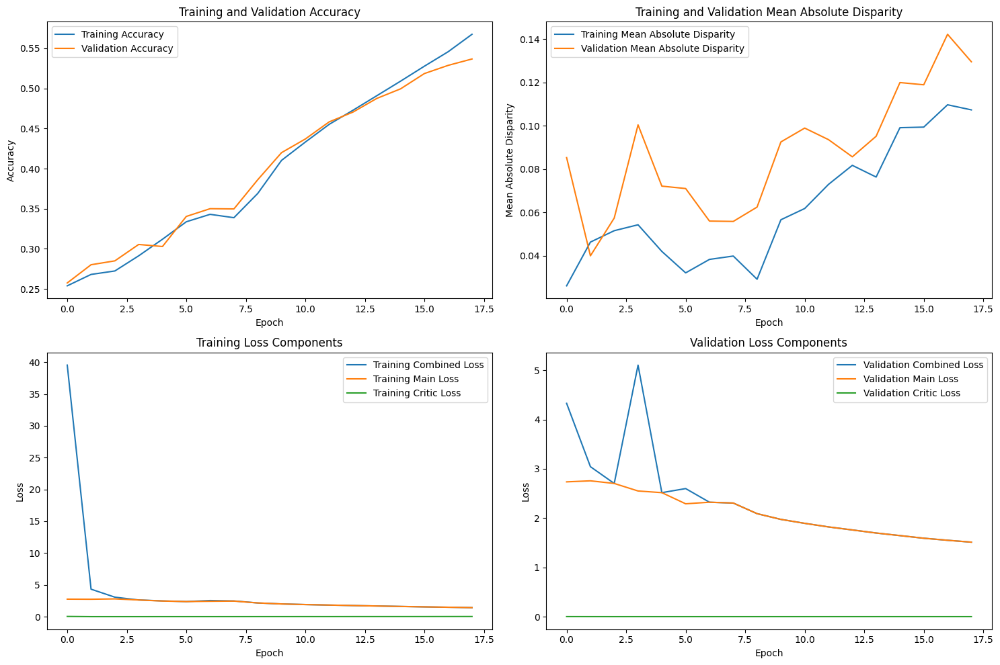

Epoch 19/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.17it/s]



Lambda 200 - Epoch 19 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.585089, VALIDATION Accuracy: 0.5486
TRAINING Disparity: 0.137585, VALIDATION Disparity: 0.1195
TRAINING Combined Loss: 1.363463, VALIDATION Combined Loss: 1.4747
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06625081399732669
Class Celebration: Val Disparity = -0.013861386138613818
Class Parade: Val Disparity = -0.01041666666666674
Class Waiter_Or_Waitress: Val Disparity = -0.2626956853760978
Class Individual_Sports: Val Disparity = -0.17677122347066176
Class Surgeons: Val Disparity = -0.10125646711012559
Class Spa: Val Disparity = 0.10416666666666669
Class Law_Enforcement: Val Disparity = 0.14530516431924878
Class Business: Val Disparity = -0.03662301714042371
Class Dresses: Val Disparity = -0.5399201596806387
Class Water_Activities: Val Disparity = 0.0002129018522460946
Class Picnic: Val Disparity = 0.08496732026143794
Class Rescue: Val Di

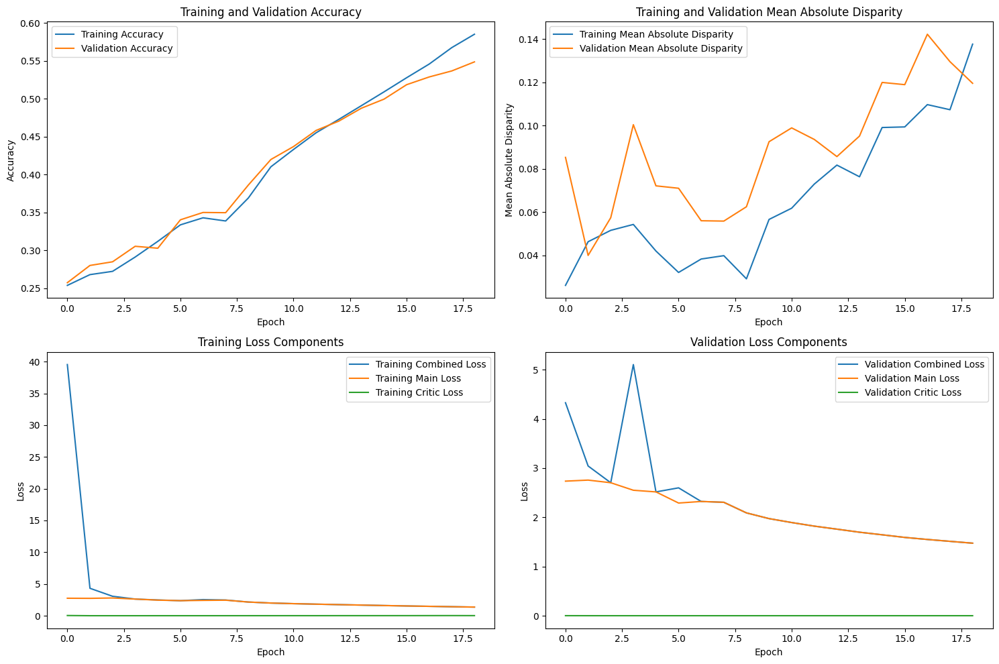

Epoch 20/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]



Lambda 200 - Epoch 20 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.607311, VALIDATION Accuracy: 0.5606
TRAINING Disparity: 0.129416, VALIDATION Disparity: 0.1183
TRAINING Combined Loss: 1.292930, VALIDATION Combined Loss: 1.4524
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07443077309753099
Class Celebration: Val Disparity = -0.019356435643564374
Class Parade: Val Disparity = -0.0009469696969697239
Class Waiter_Or_Waitress: Val Disparity = -0.20313096601756409
Class Individual_Sports: Val Disparity = -0.17759051186017483
Class Surgeons: Val Disparity = -0.08277900960827789
Class Spa: Val Disparity = 0.062499999999999944
Class Law_Enforcement: Val Disparity = 0.14976525821596254
Class Business: Val Disparity = -0.03917811135952298
Class Dresses: Val Disparity = -0.5638722554890221
Class Water_Activities: Val Disparity = 0.05556738343623602
Class Picnic: Val Disparity = 0.08496732026143794
Class Rescue: Val 

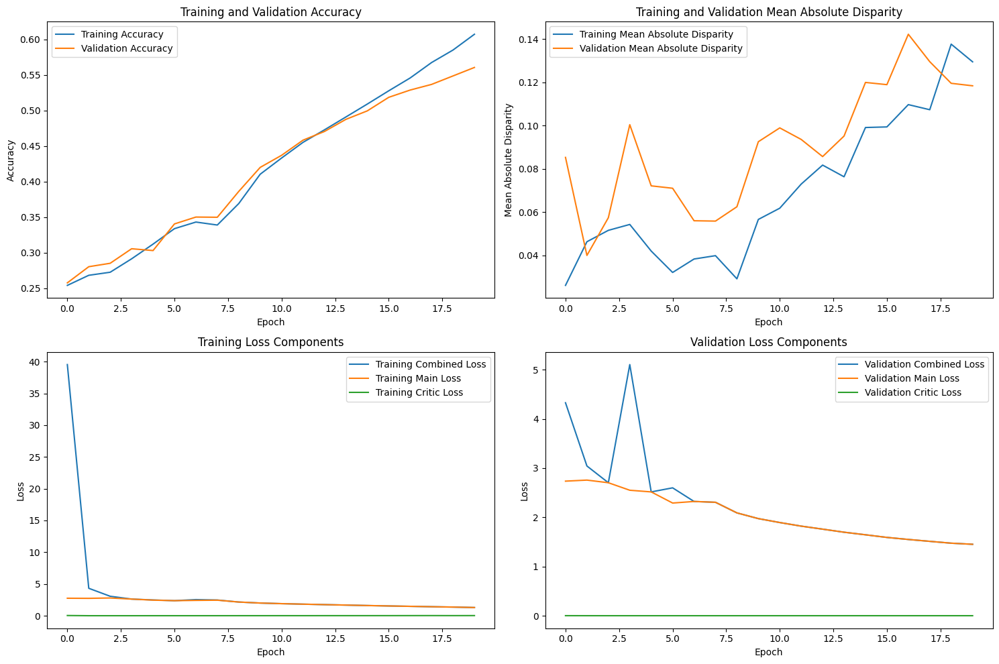

Epoch 21/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 200 - Epoch 21 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.615394, VALIDATION Accuracy: 0.5671
TRAINING Disparity: 0.130154, VALIDATION Disparity: 0.1112
TRAINING Combined Loss: 1.247367, VALIDATION Combined Loss: 1.4234
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07592738572619973
Class Celebration: Val Disparity = 0.005544554455445605
Class Parade: Val Disparity = -0.006628787878787956
Class Waiter_Or_Waitress: Val Disparity = -0.09812905689194351
Class Individual_Sports: Val Disparity = -0.2018960674157304
Class Surgeons: Val Disparity = -0.08277900960827789
Class Spa: Val Disparity = 0.04166666666666663
Class Law_Enforcement: Val Disparity = 0.13826291079812203
Class Business: Val Disparity = -0.05727669541147662
Class Dresses: Val Disparity = -0.5518962075848304
Class Water_Activities: Val Disparity = 0.03299978709814788
Class Picnic: Val Disparity = 0.02614379084967322
Class Rescue: Val Disp

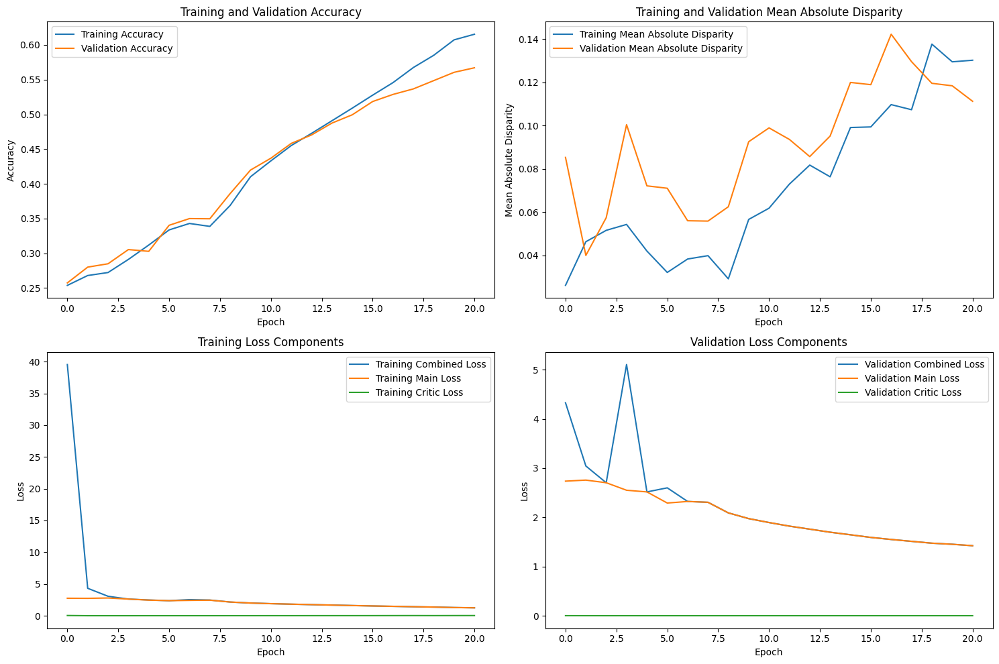

Epoch 22/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.27it/s]



Lambda 200 - Epoch 22 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.636362, VALIDATION Accuracy: 0.5717
TRAINING Disparity: 0.129425, VALIDATION Disparity: 0.1039
TRAINING Combined Loss: 1.185283, VALIDATION Combined Loss: 1.4037
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.0539808753470199
Class Celebration: Val Disparity = 0.020643564356435606
Class Parade: Val Disparity = 0.02083333333333326
Class Waiter_Or_Waitress: Val Disparity = -0.07140129820542185
Class Individual_Sports: Val Disparity = -0.14735486891385774
Class Surgeons: Val Disparity = -0.08277900960827789
Class Spa: Val Disparity = -0.02083333333333337
Class Law_Enforcement: Val Disparity = 0.147887323943662
Class Business: Val Disparity = -0.0004258490365165457
Class Dresses: Val Disparity = -0.724550898203593
Class Water_Activities: Val Disparity = -0.010751543538428665
Class Picnic: Val Disparity = 0.02614379084967322
Class Rescue: Val Disp

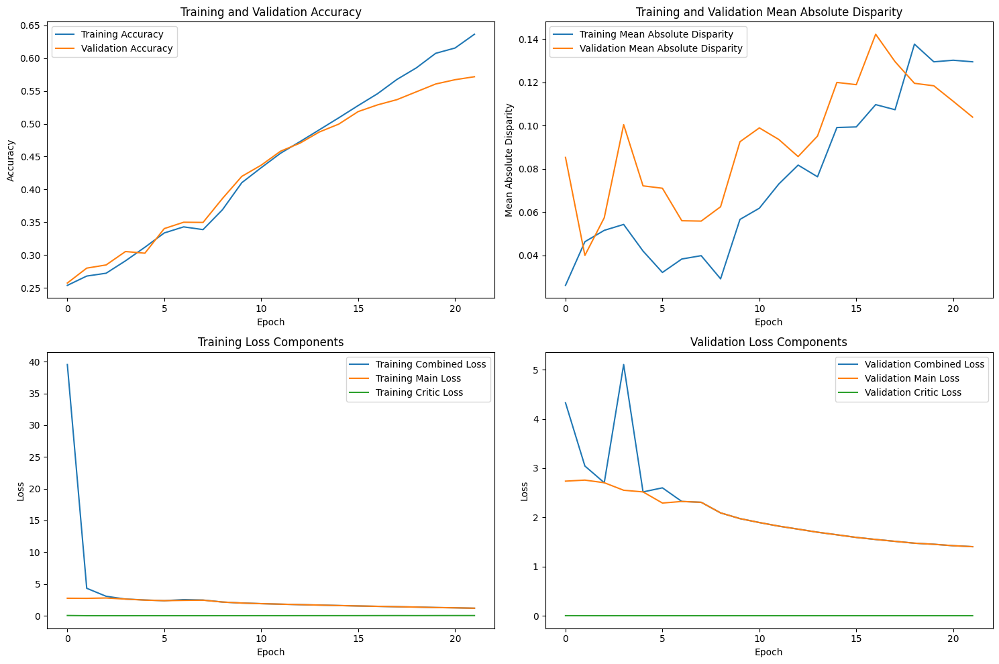

Epoch 23/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 200 - Epoch 23 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.652797, VALIDATION Accuracy: 0.5805
TRAINING Disparity: 0.129276, VALIDATION Disparity: 0.1096
TRAINING Combined Loss: 1.133174, VALIDATION Combined Loss: 1.3830
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09677714181261488
Class Celebration: Val Disparity = -0.004059405940594063
Class Parade: Val Disparity = -0.018939393939394034
Class Waiter_Or_Waitress: Val Disparity = -0.04467353951890041
Class Individual_Sports: Val Disparity = -0.16553526841448196
Class Surgeons: Val Disparity = -0.08869179600886923
Class Spa: Val Disparity = 0.020833333333333315
Class Law_Enforcement: Val Disparity = 0.13826291079812203
Class Business: Val Disparity = -0.038326413286489946
Class Dresses: Val Disparity = -0.5998003992015969
Class Water_Activities: Val Disparity = 0.003619331488184052
Class Picnic: Val Disparity = -0.12418300653594772
Class Rescue: Va

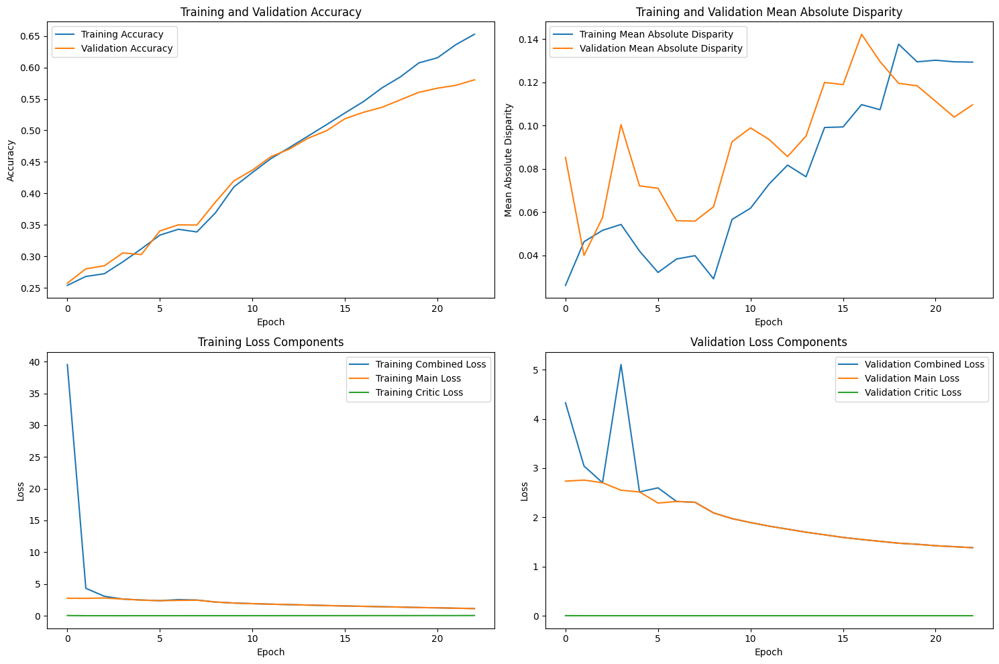

Epoch 24/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.32it/s]



Lambda 200 - Epoch 24 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.668075, VALIDATION Accuracy: 0.5867
TRAINING Disparity: 0.158117, VALIDATION Disparity: 0.0897
TRAINING Combined Loss: 1.073883, VALIDATION Combined Loss: 1.3651
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06939255806514255
Class Celebration: Val Disparity = -0.009059405940594012
Class Parade: Val Disparity = -0.014204545454545303
Class Waiter_Or_Waitress: Val Disparity = -0.02405498281786944
Class Individual_Sports: Val Disparity = -0.13959113607990015
Class Surgeons: Val Disparity = -0.02143385070214332
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.13755868544600947
Class Business: Val Disparity = -0.008623442989460162
Class Dresses: Val Disparity = -0.5818363273453094
Class Water_Activities: Val Disparity = -0.025761124121779888
Class Picnic: Val Disparity = 0.0065359477124183885
Class Rescue: Val Disparity = -

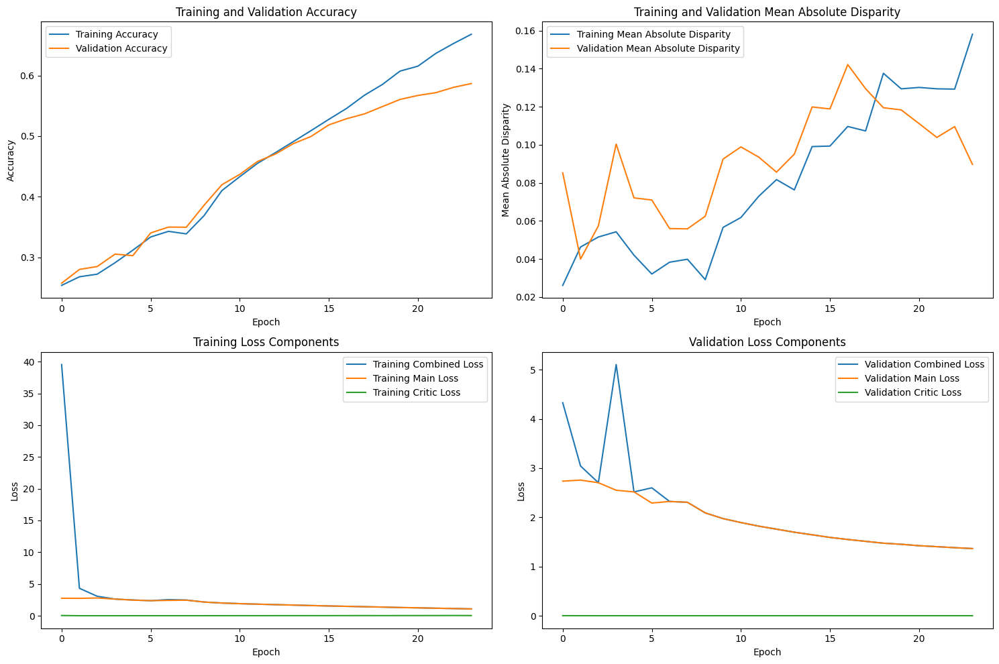

Epoch 25/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 200 - Epoch 25 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.692650, VALIDATION Accuracy: 0.5958
TRAINING Disparity: 0.128107, VALIDATION Disparity: 0.1055
TRAINING Combined Loss: 1.008265, VALIDATION Combined Loss: 1.3610
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.08630085341193405
Class Celebration: Val Disparity = -0.008960396039603913
Class Parade: Val Disparity = -0.009469696969697017
Class Waiter_Or_Waitress: Val Disparity = -0.06529209621993126
Class Individual_Sports: Val Disparity = -0.1422440699126093
Class Surgeons: Val Disparity = -0.09460458240946051
Class Spa: Val Disparity = -0.02083333333333337
Class Law_Enforcement: Val Disparity = 0.11901408450704232
Class Business: Val Disparity = 0.04002980943255624
Class Dresses: Val Disparity = -0.7425149700598802
Class Water_Activities: Val Disparity = -0.012774111134766897
Class Picnic: Val Disparity = 0.0065359477124183885
Class Rescue: Val

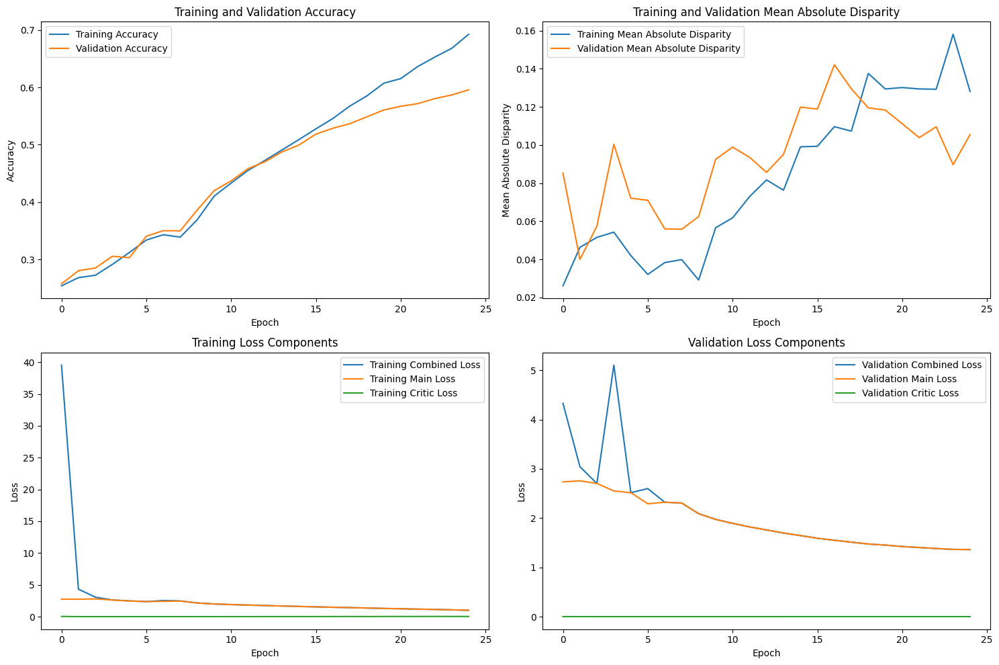

Epoch 26/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]



Lambda 200 - Epoch 26 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.713002, VALIDATION Accuracy: 0.5987
TRAINING Disparity: 0.135134, VALIDATION Disparity: 0.0947
TRAINING Combined Loss: 0.945851, VALIDATION Combined Loss: 1.3541
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09433229370165996
Class Celebration: Val Disparity = 0.0007425742574256322
Class Parade: Val Disparity = 0.0037878787878788955
Class Waiter_Or_Waitress: Val Disparity = -0.028255059182894282
Class Individual_Sports: Val Disparity = -0.1144662921348315
Class Surgeons: Val Disparity = -0.07021433850702136
Class Spa: Val Disparity = -0.10416666666666663
Class Law_Enforcement: Val Disparity = 0.11384976525821588
Class Business: Val Disparity = 0.03012881933354633
Class Dresses: Val Disparity = -0.6117764471057885
Class Water_Activities: Val Disparity = -0.02235469448584204
Class Picnic: Val Disparity = -0.013071895424836555
Class Rescue: Val

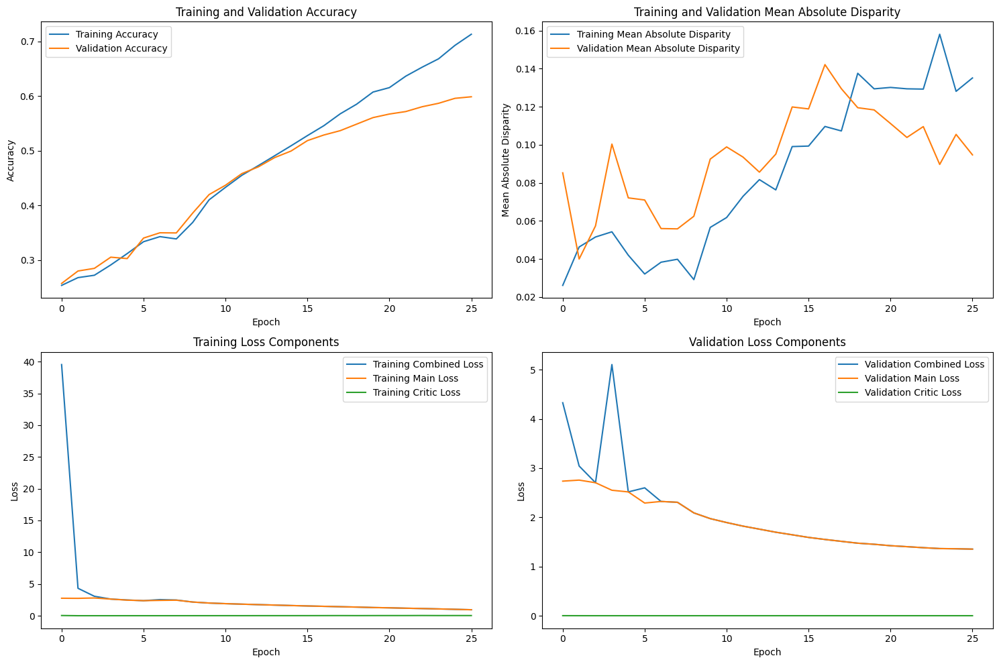

Epoch 27/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 200 - Epoch 27 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.726080, VALIDATION Accuracy: 0.5970
TRAINING Disparity: 0.132278, VALIDATION Disparity: 0.1014
TRAINING Combined Loss: 0.882441, VALIDATION Combined Loss: 1.3564
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09433229370165996
Class Celebration: Val Disparity = 0.0007425742574256322
Class Parade: Val Disparity = 0.0037878787878788955
Class Waiter_Or_Waitress: Val Disparity = -0.028255059182894282
Class Individual_Sports: Val Disparity = -0.1144662921348315
Class Surgeons: Val Disparity = -0.07021433850702136
Class Spa: Val Disparity = -0.10416666666666663
Class Law_Enforcement: Val Disparity = 0.11384976525821588
Class Business: Val Disparity = 0.03012881933354633
Class Dresses: Val Disparity = -0.6117764471057885
Class Water_Activities: Val Disparity = -0.02235469448584204
Class Picnic: Val Disparity = -0.013071895424836555
Class Rescue: Val

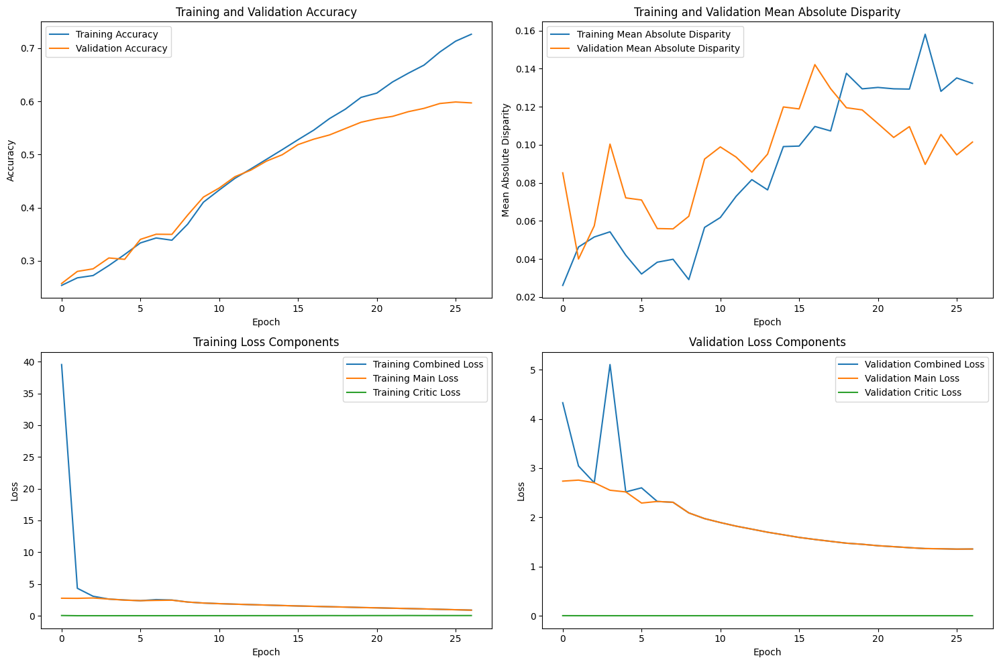

Epoch 28/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.27it/s]



Lambda 200 - Epoch 28 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.755015, VALIDATION Accuracy: 0.6012
TRAINING Disparity: 0.124510, VALIDATION Disparity: 0.1205
TRAINING Combined Loss: 0.804386, VALIDATION Combined Loss: 1.3590
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09433229370165996
Class Celebration: Val Disparity = 0.0007425742574256322
Class Parade: Val Disparity = 0.0037878787878788955
Class Waiter_Or_Waitress: Val Disparity = -0.028255059182894282
Class Individual_Sports: Val Disparity = -0.1144662921348315
Class Surgeons: Val Disparity = -0.07021433850702136
Class Spa: Val Disparity = -0.10416666666666663
Class Law_Enforcement: Val Disparity = 0.11384976525821588
Class Business: Val Disparity = 0.03012881933354633
Class Dresses: Val Disparity = -0.6117764471057885
Class Water_Activities: Val Disparity = -0.02235469448584204
Class Picnic: Val Disparity = -0.013071895424836555
Class Rescue: Val

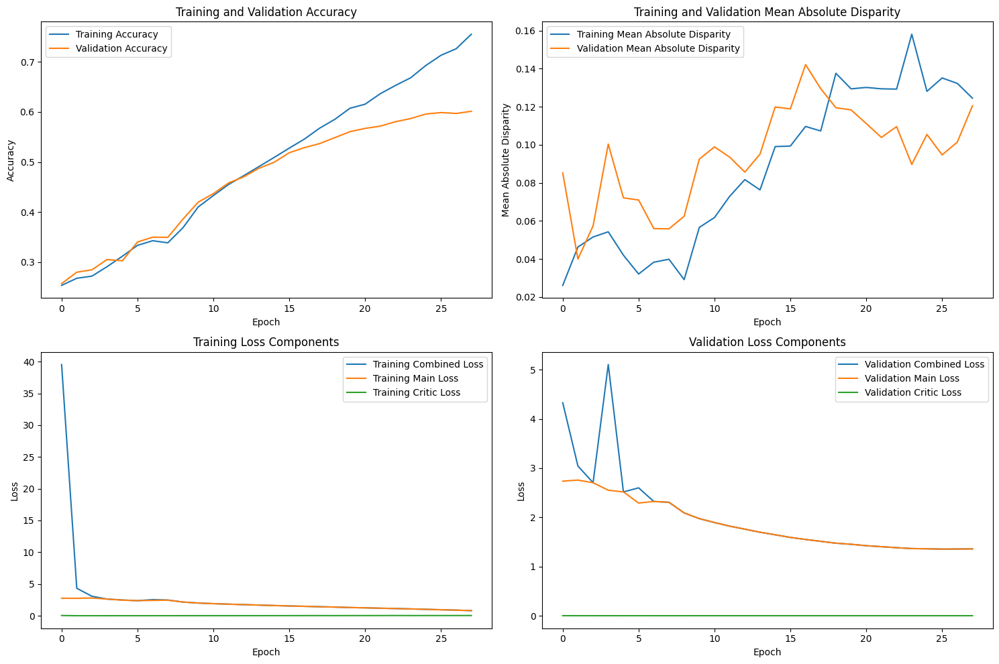

Epoch 29/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.31it/s]



Lambda 200 - Epoch 29 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.782504, VALIDATION Accuracy: 0.6052
TRAINING Disparity: 0.093686, VALIDATION Disparity: 0.1041
TRAINING Combined Loss: 0.720367, VALIDATION Combined Loss: 1.3690
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09433229370165996
Class Celebration: Val Disparity = 0.0007425742574256322
Class Parade: Val Disparity = 0.0037878787878788955
Class Waiter_Or_Waitress: Val Disparity = -0.028255059182894282
Class Individual_Sports: Val Disparity = -0.1144662921348315
Class Surgeons: Val Disparity = -0.07021433850702136
Class Spa: Val Disparity = -0.10416666666666663
Class Law_Enforcement: Val Disparity = 0.11384976525821588
Class Business: Val Disparity = 0.03012881933354633
Class Dresses: Val Disparity = -0.6117764471057885
Class Water_Activities: Val Disparity = -0.02235469448584204
Class Picnic: Val Disparity = -0.013071895424836555
Class Rescue: Val

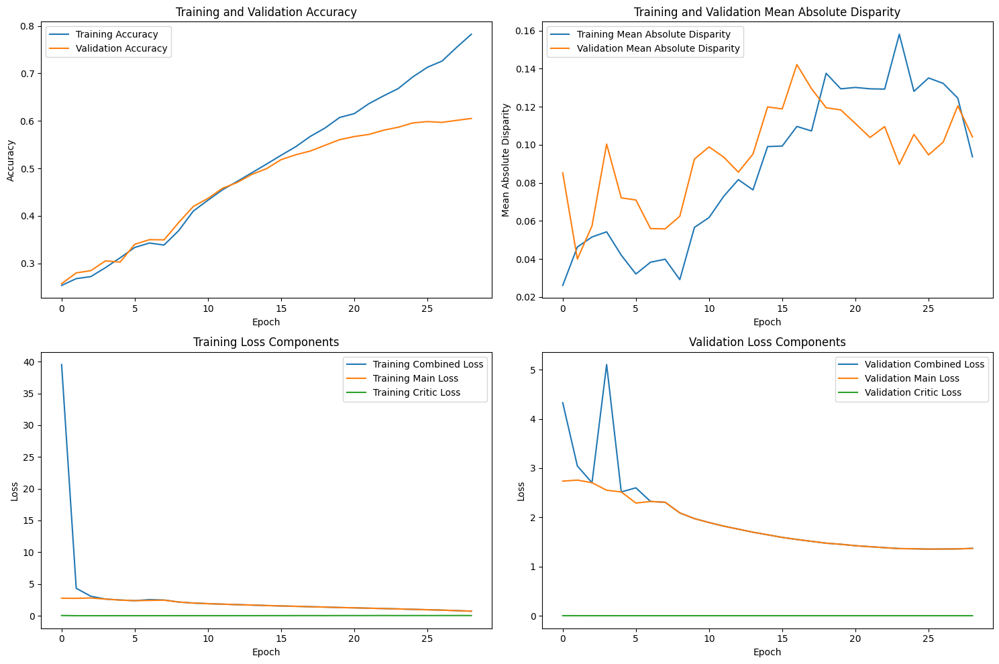

Epoch 30/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.30it/s]



Lambda 200 - Epoch 30 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.803549, VALIDATION Accuracy: 0.6018
TRAINING Disparity: 0.093496, VALIDATION Disparity: 0.1153
TRAINING Combined Loss: 0.649947, VALIDATION Combined Loss: 1.4097
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09433229370165996
Class Celebration: Val Disparity = 0.0007425742574256322
Class Parade: Val Disparity = 0.0037878787878788955
Class Waiter_Or_Waitress: Val Disparity = -0.028255059182894282
Class Individual_Sports: Val Disparity = -0.1144662921348315
Class Surgeons: Val Disparity = -0.07021433850702136
Class Spa: Val Disparity = -0.10416666666666663
Class Law_Enforcement: Val Disparity = 0.11384976525821588
Class Business: Val Disparity = 0.03012881933354633
Class Dresses: Val Disparity = -0.6117764471057885
Class Water_Activities: Val Disparity = -0.02235469448584204
Class Picnic: Val Disparity = -0.013071895424836555
Class Rescue: Val

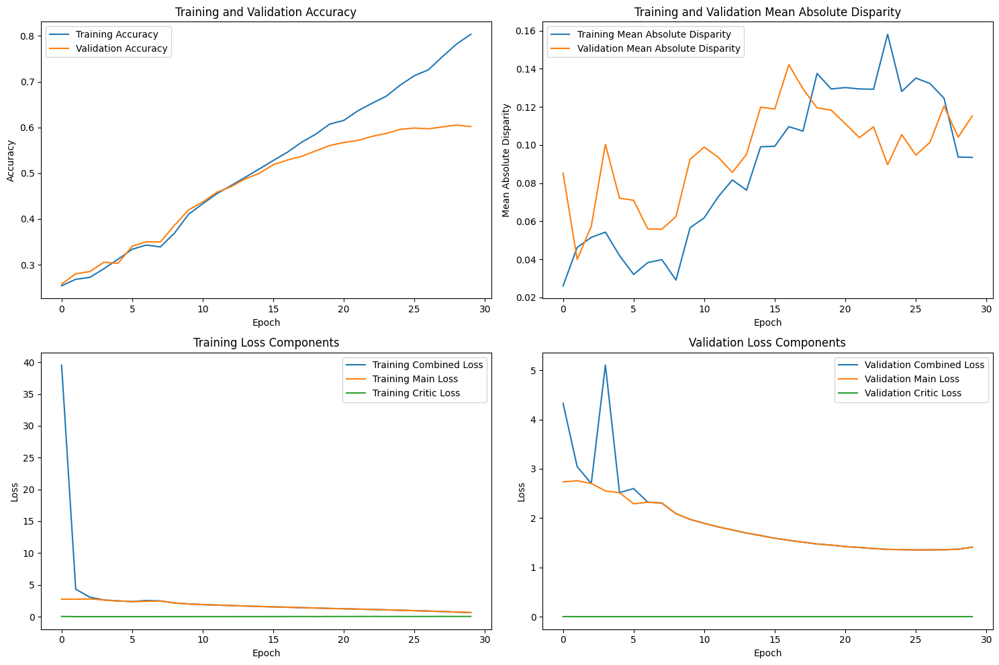

Epoch 31/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 200 - Epoch 31 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.830285, VALIDATION Accuracy: 0.6029
TRAINING Disparity: 0.088803, VALIDATION Disparity: 0.1133
TRAINING Combined Loss: 0.570422, VALIDATION Combined Loss: 1.4506
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09433229370165996
Class Celebration: Val Disparity = 0.0007425742574256322
Class Parade: Val Disparity = 0.0037878787878788955
Class Waiter_Or_Waitress: Val Disparity = -0.028255059182894282
Class Individual_Sports: Val Disparity = -0.1144662921348315
Class Surgeons: Val Disparity = -0.07021433850702136
Class Spa: Val Disparity = -0.10416666666666663
Class Law_Enforcement: Val Disparity = 0.11384976525821588
Class Business: Val Disparity = 0.03012881933354633
Class Dresses: Val Disparity = -0.6117764471057885
Class Water_Activities: Val Disparity = -0.02235469448584204
Class Picnic: Val Disparity = -0.013071895424836555
Class Rescue: Val

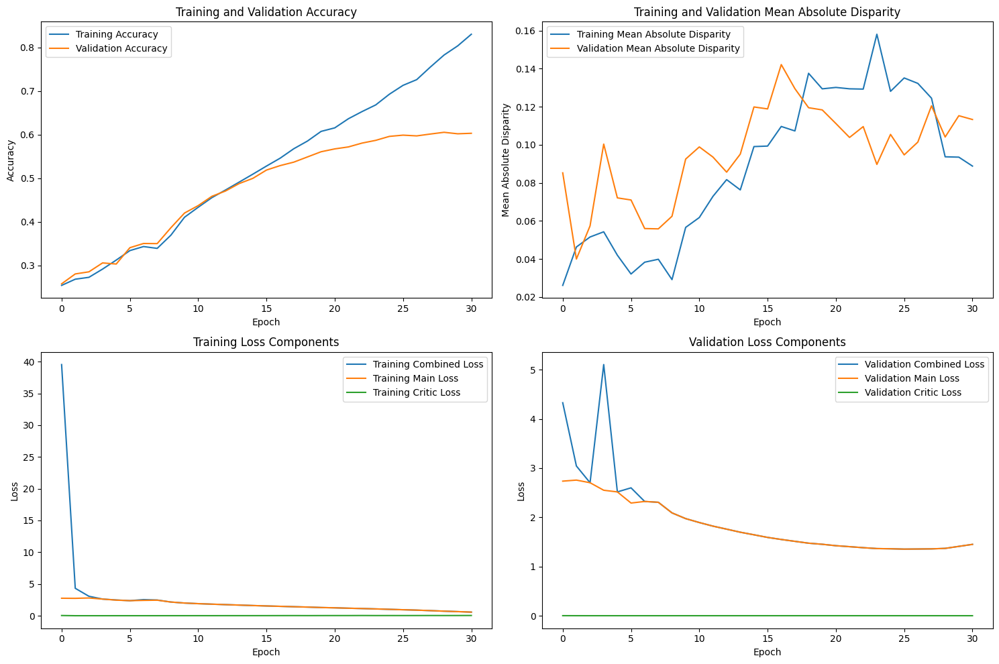

Epoch 32/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.33it/s]


Early stopping triggered at epoch 32
Finished Training with lambda value of 200. Best (stopping) epoch number: 26


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 100 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.297164, VALIDATION Accuracy: 0.2875
TRAINING Disparity: 0.031446, VALIDATION Disparity: 0.0406
TRAINING Combined Loss: 22.868722, VALIDATION Combined Loss: 3.3348
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09833087706069843
Class Celebration: Val Disparity = -0.010099009900990101
Class Parade: Val Disparity = -0.030303030303030276
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.004564606741572996
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.05821596244131456
Class Business: Val Disparity = -0.03172575322048331
Class Dresses: Val Disparity = -0.07784431137724551
Class Water_Activities: Val Disparity = 0.028315946348733245
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = -0.031914893617021

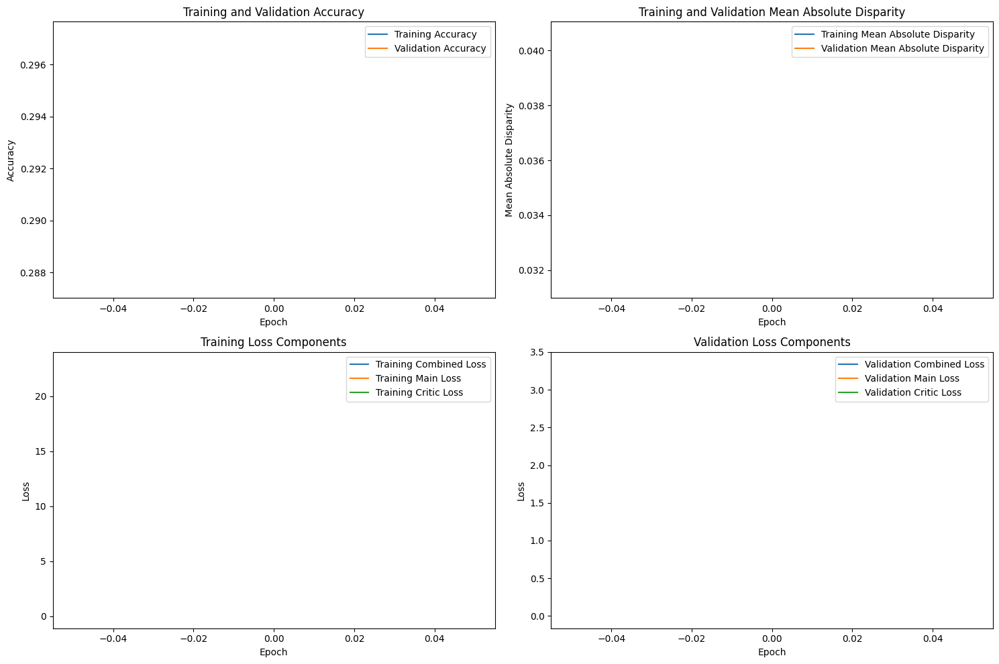

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 100 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.293596, VALIDATION Accuracy: 0.3099
TRAINING Disparity: 0.046937, VALIDATION Disparity: 0.0741
TRAINING Combined Loss: 2.872639, VALIDATION Combined Loss: 2.7849
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.0957375101392649
Class Celebration: Val Disparity = -0.0251980198019802
Class Parade: Val Disparity = -0.1136363636363637
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.01010455680399508
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.049061032863849774
Class Business: Val Disparity = -0.06792292132439051
Class Dresses: Val Disparity = -0.33532934131736525
Class Water_Activities: Val Disparity = 0.05226740472642111
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = -0.010638297872340425
Cla

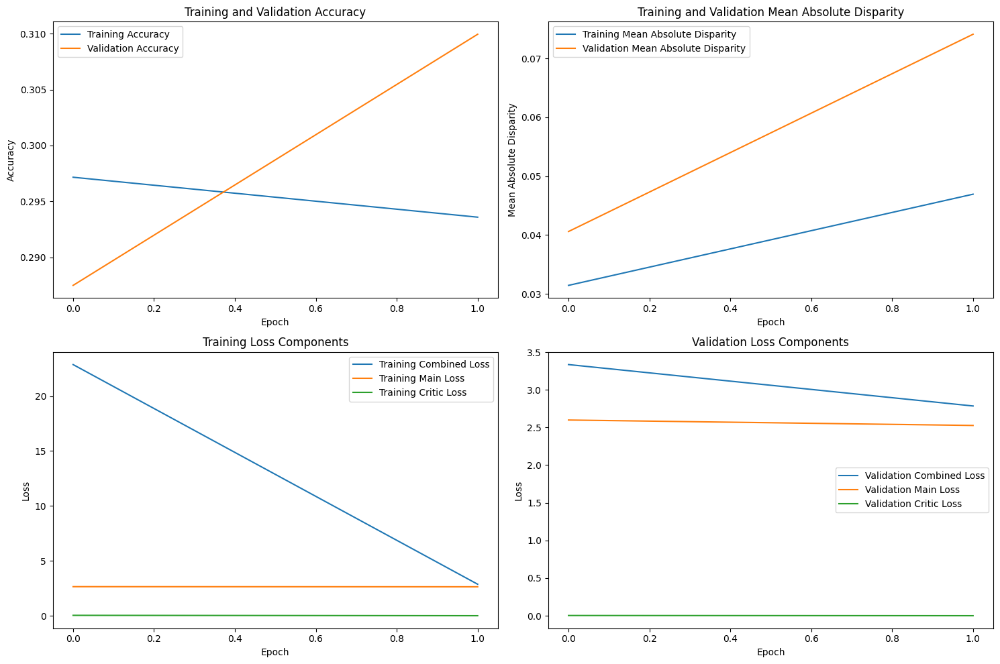

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 100 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.338445, VALIDATION Accuracy: 0.3554
TRAINING Disparity: 0.071403, VALIDATION Disparity: 0.0836
TRAINING Combined Loss: 2.330305, VALIDATION Combined Loss: 2.4221
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.08595811769544504
Class Celebration: Val Disparity = -0.10148514851485155
Class Parade: Val Disparity = -0.06439393939393934
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.017673220973782655
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0821596244131455
Class Business: Val Disparity = -0.15990631321196636
Class Dresses: Val Disparity = -0.24650698602794416
Class Water_Activities: Val Disparity = 0.021503087076857663
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = -0.010638297872340425


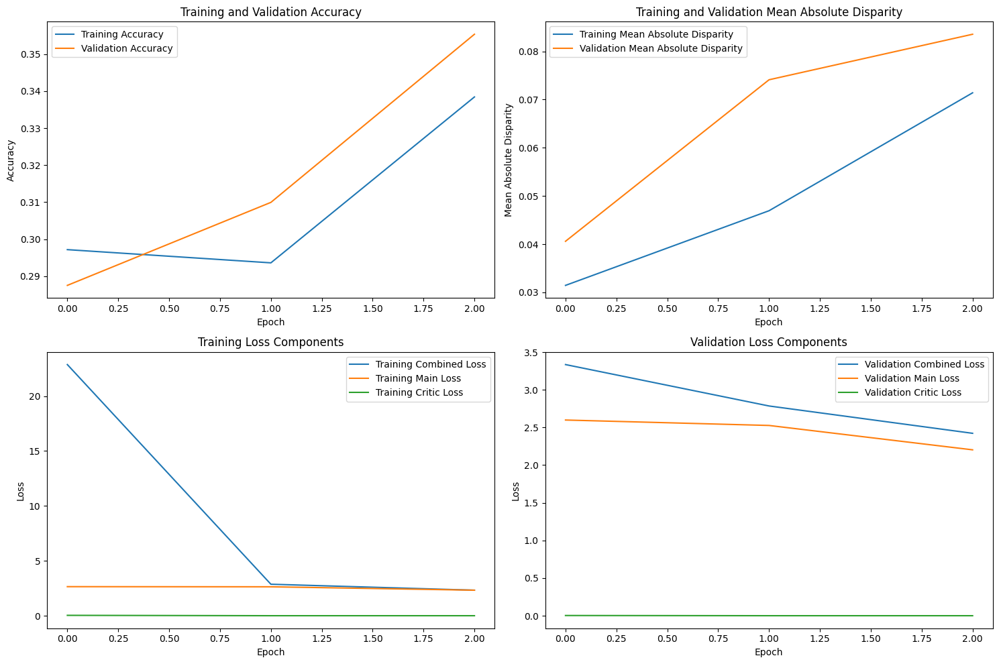

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 100 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.359394, VALIDATION Accuracy: 0.3602
TRAINING Disparity: 0.073023, VALIDATION Disparity: 0.0775
TRAINING Combined Loss: 2.451879, VALIDATION Combined Loss: 2.1712
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07912625241343052
Class Celebration: Val Disparity = -0.0023762376237623506
Class Parade: Val Disparity = 0.0028409090909089496
Class Waiter_Or_Waitress: Val Disparity = -0.06185567010309278
Class Individual_Sports: Val Disparity = 0.016853932584269593
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.1293427230046949
Class Business: Val Disparity = -0.1276482486958373
Class Dresses: Val Disparity = -0.342315369261477
Class Water_Activities: Val Disparity = -0.056418990845220396
Class Picnic: Val Disparity = -0.0392156862745098
Class Rescue: Val Disparity = 0.0
Class Cheering: Val 

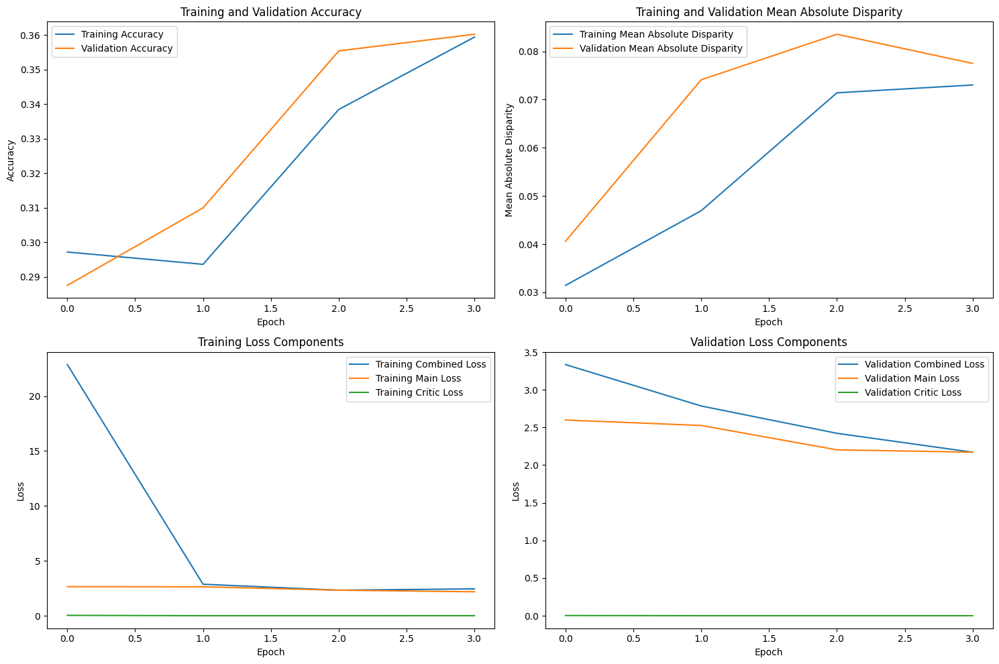

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.18it/s]



Lambda 100 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.378762, VALIDATION Accuracy: 0.3915
TRAINING Disparity: 0.069235, VALIDATION Disparity: 0.0669
TRAINING Combined Loss: 2.390238, VALIDATION Combined Loss: 1.9870
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11663296432121184
Class Celebration: Val Disparity = 0.017227722772277243
Class Parade: Val Disparity = -0.03977272727272729
Class Waiter_Or_Waitress: Val Disparity = -0.1156930126002291
Class Individual_Sports: Val Disparity = 0.02196473158551815
Class Surgeons: Val Disparity = 0.024390243902439022
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.1293427230046948
Class Business: Val Disparity = 0.027680187373576054
Class Dresses: Val Disparity = -0.1996007984031936
Class Water_Activities: Val Disparity = 0.020119225037257826
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.04545454545454545
Class 

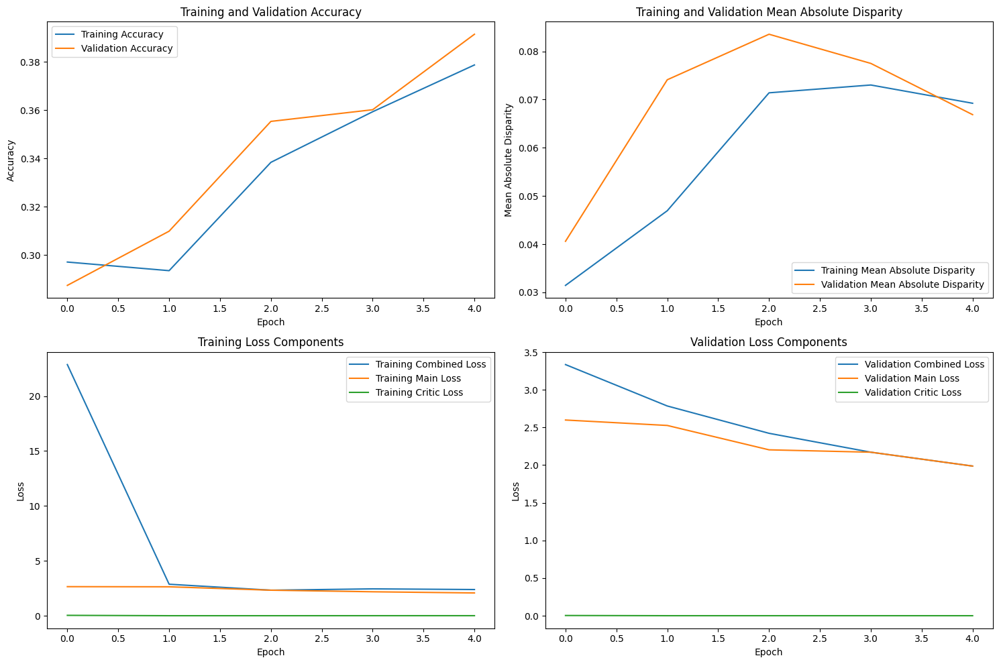

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 100 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.412944, VALIDATION Accuracy: 0.3878
TRAINING Disparity: 0.073114, VALIDATION Disparity: 0.0991
TRAINING Combined Loss: 1.966092, VALIDATION Combined Loss: 2.0742
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11663296432121184
Class Celebration: Val Disparity = 0.017227722772277243
Class Parade: Val Disparity = -0.03977272727272729
Class Waiter_Or_Waitress: Val Disparity = -0.1156930126002291
Class Individual_Sports: Val Disparity = 0.02196473158551815
Class Surgeons: Val Disparity = 0.024390243902439022
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.1293427230046948
Class Business: Val Disparity = 0.027680187373576054
Class Dresses: Val Disparity = -0.1996007984031936
Class Water_Activities: Val Disparity = 0.020119225037257826
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.04545454545454545
Class 

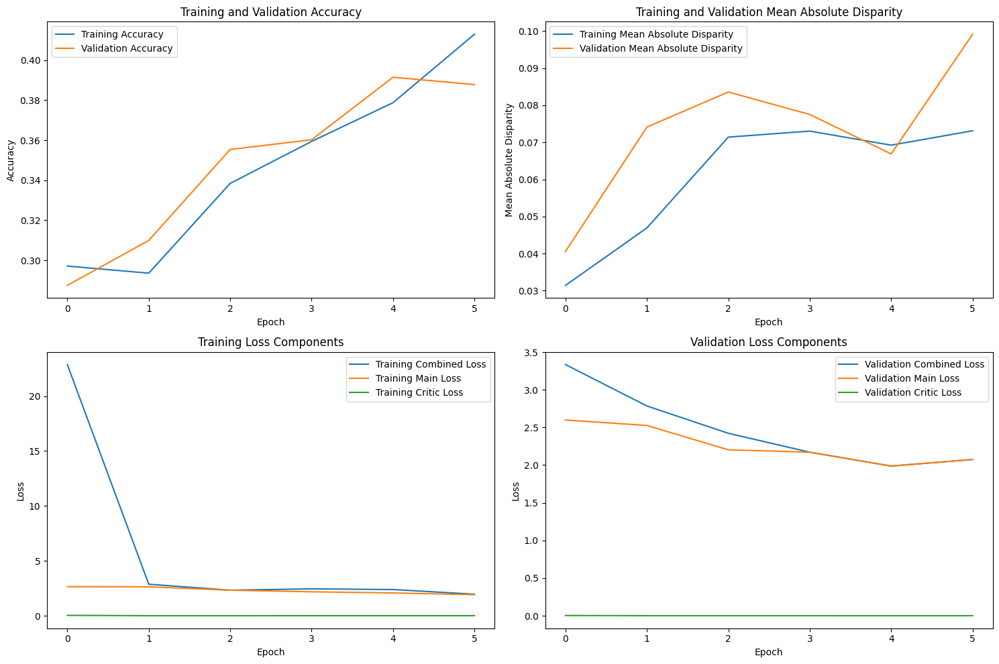

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.23it/s]



Lambda 100 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.411709, VALIDATION Accuracy: 0.4120
TRAINING Disparity: 0.072984, VALIDATION Disparity: 0.1056
TRAINING Combined Loss: 2.004749, VALIDATION Combined Loss: 2.0026
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11663296432121184
Class Celebration: Val Disparity = 0.017227722772277243
Class Parade: Val Disparity = -0.03977272727272729
Class Waiter_Or_Waitress: Val Disparity = -0.1156930126002291
Class Individual_Sports: Val Disparity = 0.02196473158551815
Class Surgeons: Val Disparity = 0.024390243902439022
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.1293427230046948
Class Business: Val Disparity = 0.027680187373576054
Class Dresses: Val Disparity = -0.1996007984031936
Class Water_Activities: Val Disparity = 0.020119225037257826
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.04545454545454545
Class 

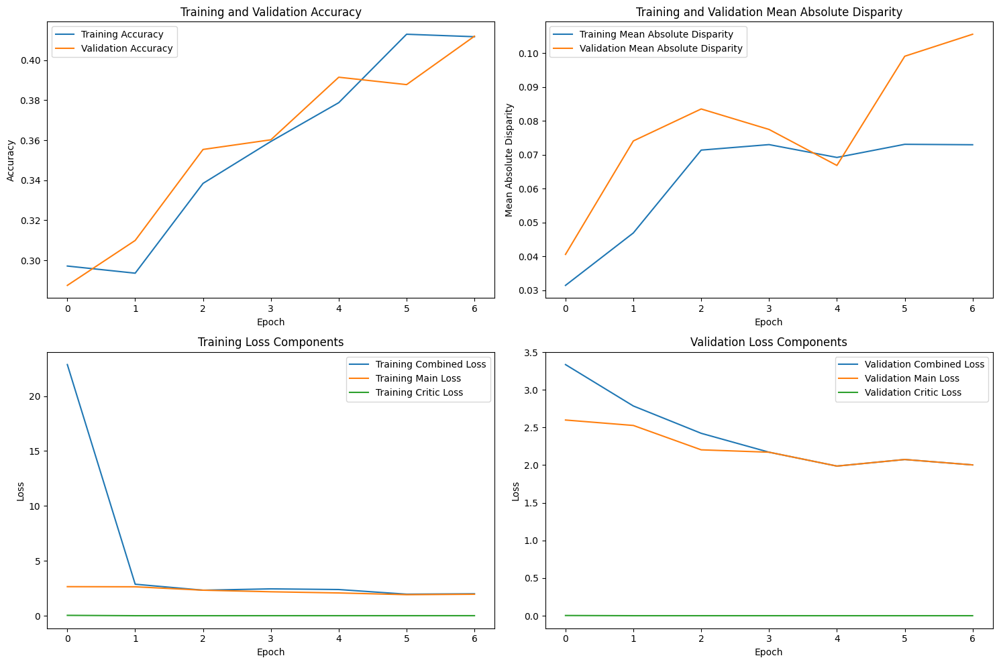

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.24it/s]



Lambda 100 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.436632, VALIDATION Accuracy: 0.4469
TRAINING Disparity: 0.074863, VALIDATION Disparity: 0.1104
TRAINING Combined Loss: 1.868063, VALIDATION Combined Loss: 1.8144
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.10096994207766385
Class Celebration: Val Disparity = -0.028861386138613887
Class Parade: Val Disparity = -0.07481060606060597
Class Waiter_Or_Waitress: Val Disparity = -0.23329515082092406
Class Individual_Sports: Val Disparity = -0.026646379525593122
Class Surgeons: Val Disparity = -0.01773835920177383
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.16713615023474182
Class Business: Val Disparity = 0.05450867667411918
Class Dresses: Val Disparity = -0.6047904191616768
Class Water_Activities: Val Disparity = -0.001809665744091804
Class Picnic: Val Disparity = -0.01307189542483661
Class Rescue: Val Disparity = -0.04

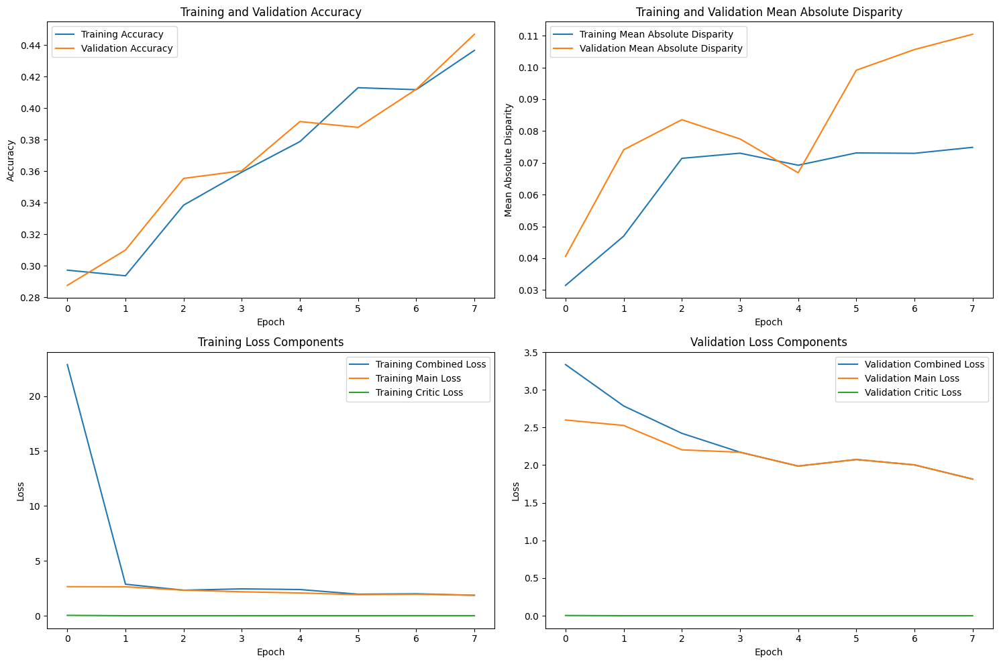

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.20it/s]



Lambda 100 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.468441, VALIDATION Accuracy: 0.4642
TRAINING Disparity: 0.090047, VALIDATION Disparity: 0.1263
TRAINING Combined Loss: 1.735867, VALIDATION Combined Loss: 1.7284
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.10505992162776612
Class Celebration: Val Disparity = -0.0035643564356434565
Class Parade: Val Disparity = -0.04356060606060619
Class Waiter_Or_Waitress: Val Disparity = -0.27453226422298593
Class Individual_Sports: Val Disparity = -0.07178526841448196
Class Surgeons: Val Disparity = -0.029563932002956372
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.19272300469483555
Class Business: Val Disparity = 0.10060683487703609
Class Dresses: Val Disparity = -0.6047904191616768
Class Water_Activities: Val Disparity = -0.01958697040664248
Class Picnic: Val Disparity = -0.07189542483660133
Class Rescue: Val Disparity = -0.05

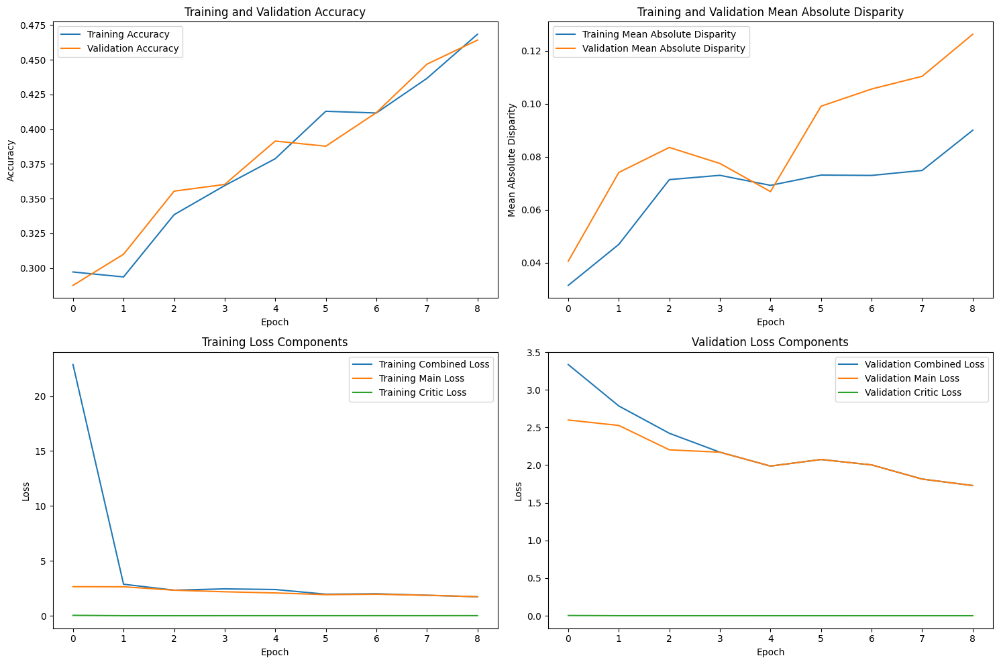

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.21it/s]



Lambda 100 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.488657, VALIDATION Accuracy: 0.4864
TRAINING Disparity: 0.088760, VALIDATION Disparity: 0.1227
TRAINING Combined Loss: 1.651372, VALIDATION Combined Loss: 1.6604
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.10111846088814247
Class Celebration: Val Disparity = -0.048762376237623695
Class Parade: Val Disparity = -0.0018939393939393367
Class Waiter_Or_Waitress: Val Disparity = -0.28484154257350136
Class Individual_Sports: Val Disparity = -0.1046738451935082
Class Surgeons: Val Disparity = -0.1019955654101996
Class Spa: Val Disparity = -0.041666666666666664
Class Law_Enforcement: Val Disparity = 0.1734741784037559
Class Business: Val Disparity = 0.08080485467901632
Class Dresses: Val Disparity = -0.5748502994011976
Class Water_Activities: Val Disparity = -0.019586970406642368
Class Picnic: Val Disparity = -0.09803921568627455
Class Rescue: Val 

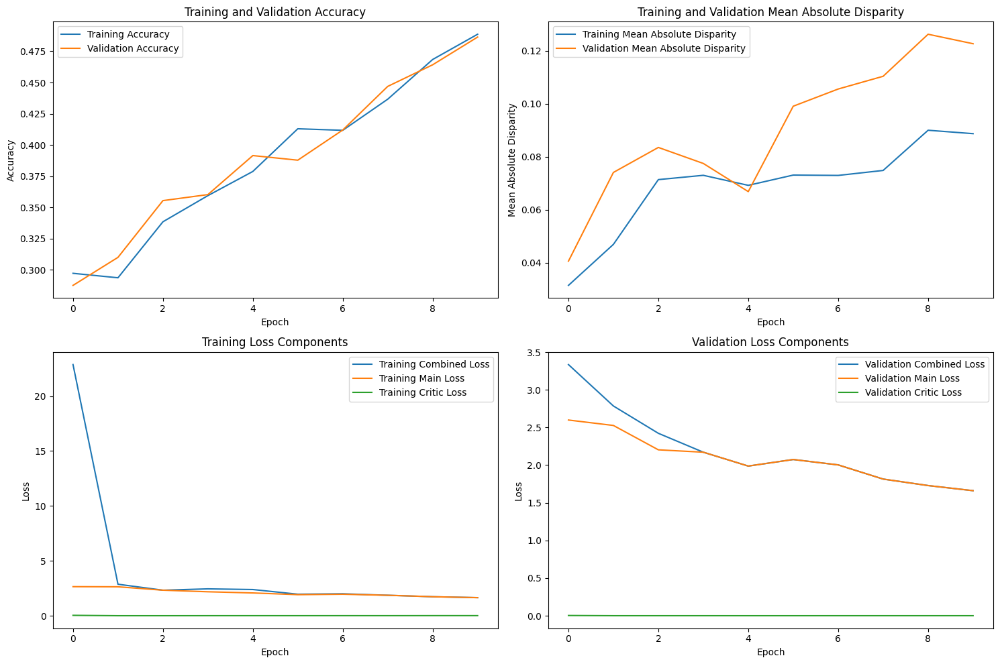

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.20it/s]



Lambda 100 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.515008, VALIDATION Accuracy: 0.5089
TRAINING Disparity: 0.106772, VALIDATION Disparity: 0.1148
TRAINING Combined Loss: 1.568530, VALIDATION Combined Loss: 1.5964
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.10071860255223875
Class Celebration: Val Disparity = -0.04396039603960389
Class Parade: Val Disparity = 0.018939393939393923
Class Waiter_Or_Waitress: Val Disparity = -0.27453226422298593
Class Individual_Sports: Val Disparity = -0.1081460674157304
Class Surgeons: Val Disparity = -0.053215077605321515
Class Spa: Val Disparity = -0.10416666666666666
Class Law_Enforcement: Val Disparity = 0.21384976525821603
Class Business: Val Disparity = 0.10454593846481425
Class Dresses: Val Disparity = -0.44411177644710587
Class Water_Activities: Val Disparity = -0.012774111134766675
Class Picnic: Val Disparity = 0.045751633986928164
Class Rescue: Val 

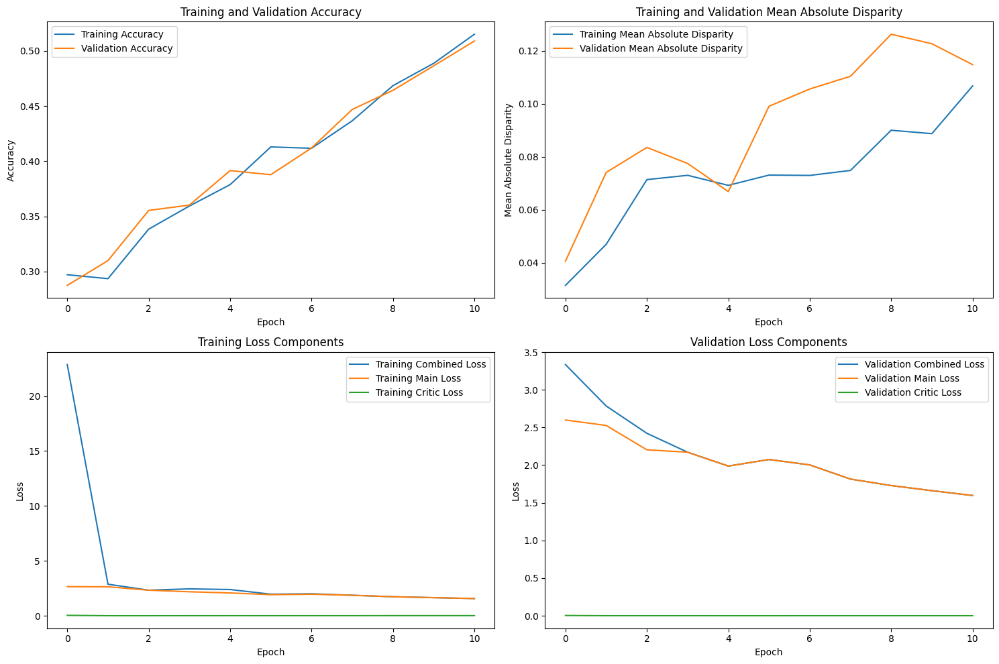

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 100 - Epoch 12 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.539294, VALIDATION Accuracy: 0.5251
TRAINING Disparity: 0.112914, VALIDATION Disparity: 0.1339
TRAINING Combined Loss: 1.496687, VALIDATION Combined Loss: 1.5514
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09104203082336537
Class Celebration: Val Disparity = -0.014059405940594016
Class Parade: Val Disparity = 0.018939393939394034
Class Waiter_Or_Waitress: Val Disparity = -0.27262313860251997
Class Individual_Sports: Val Disparity = -0.12734082397003754
Class Surgeons: Val Disparity = -0.23503325942350328
Class Spa: Val Disparity = -0.29166666666666663
Class Law_Enforcement: Val Disparity = 0.19530516431924871
Class Business: Val Disparity = 0.07228787394868519
Class Dresses: Val Disparity = -0.4500998003992017
Class Water_Activities: Val Disparity = -0.017564402810304358
Class Picnic: Val Disparity = 0.045751633986928164
Class Rescue: Val 

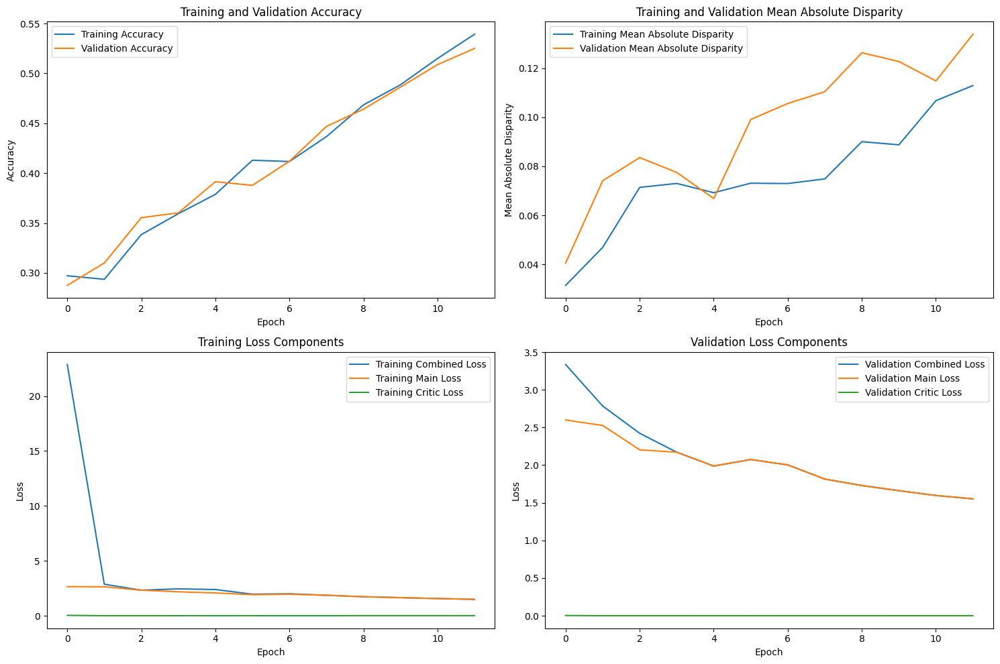

Epoch 13/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 100 - Epoch 13 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.560282, VALIDATION Accuracy: 0.5361
TRAINING Disparity: 0.121036, VALIDATION Disparity: 0.1396
TRAINING Combined Loss: 1.423697, VALIDATION Combined Loss: 1.5079
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.08914555985879291
Class Celebration: Val Disparity = -0.05896039603960396
Class Parade: Val Disparity = 0.04071969696969702
Class Waiter_Or_Waitress: Val Disparity = -0.2707140129820543
Class Individual_Sports: Val Disparity = -0.151646379525593
Class Surgeons: Val Disparity = -0.16851441241685147
Class Spa: Val Disparity = -0.3333333333333333
Class Law_Enforcement: Val Disparity = 0.19530516431924871
Class Business: Val Disparity = 0.0929415522197381
Class Dresses: Val Disparity = -0.4620758483033933
Class Water_Activities: Val Disparity = 0.00979348520332135
Class Picnic: Val Disparity = -0.0326797385620915
Class Rescue: Val Disparity 

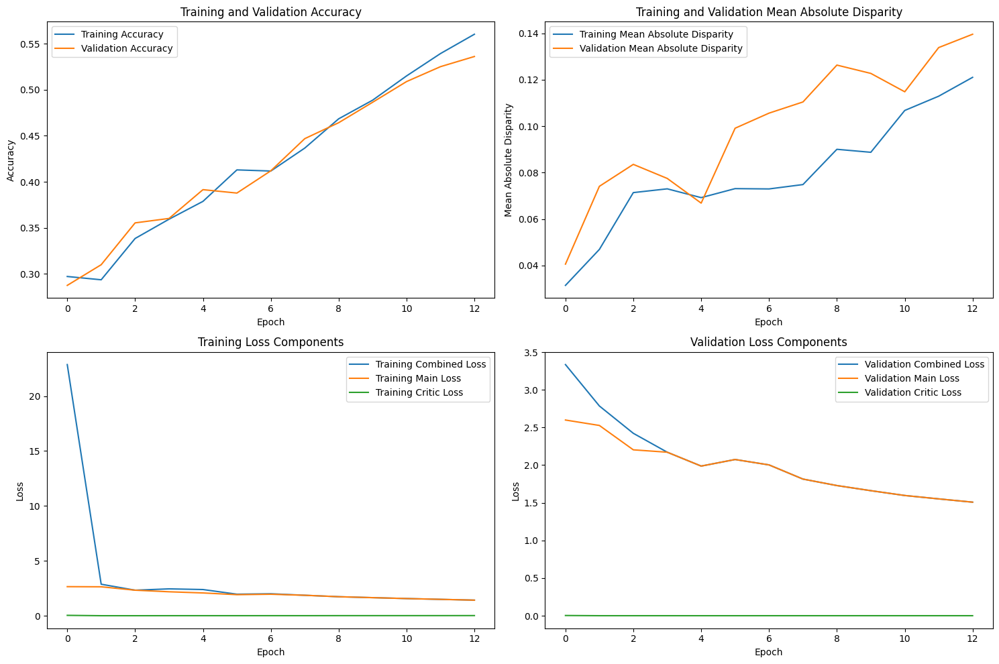

Epoch 14/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.33it/s]



Lambda 100 - Epoch 14 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.584433, VALIDATION Accuracy: 0.5441
TRAINING Disparity: 0.115264, VALIDATION Disparity: 0.1522
TRAINING Combined Loss: 1.354765, VALIDATION Combined Loss: 1.4680
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09363539774479901
Class Celebration: Val Disparity = -0.02915841584158413
Class Parade: Val Disparity = 0.0028409090909092827
Class Waiter_Or_Waitress: Val Disparity = -0.24398625429553256
Class Individual_Sports: Val Disparity = -0.1906601123595506
Class Surgeons: Val Disparity = -0.18033998521803396
Class Spa: Val Disparity = -0.4375
Class Law_Enforcement: Val Disparity = 0.18122065727699543
Class Business: Val Disparity = 0.10454593846481425
Class Dresses: Val Disparity = -0.48003992015968067
Class Water_Activities: Val Disparity = -0.00936768149882905
Class Picnic: Val Disparity = -0.0915032679738561
Class Rescue: Val Disparity = 0.0

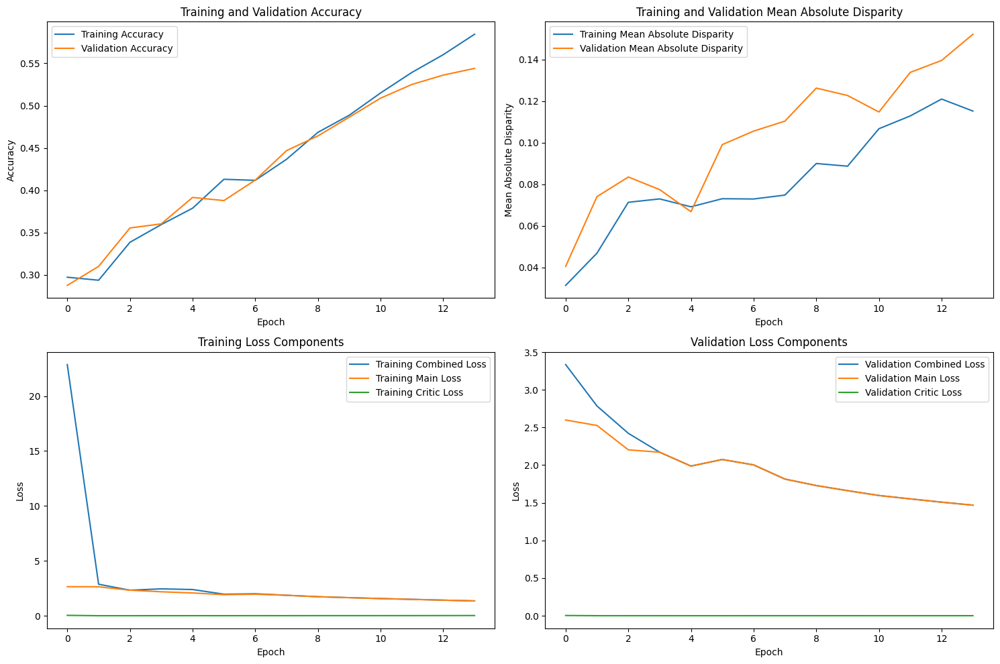

Epoch 15/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.29it/s]



Lambda 100 - Epoch 15 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.601601, VALIDATION Accuracy: 0.5583
TRAINING Disparity: 0.120726, VALIDATION Disparity: 0.1621
TRAINING Combined Loss: 1.286315, VALIDATION Combined Loss: 1.4366
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09283568107299134
Class Celebration: Val Disparity = -0.048762376237623806
Class Parade: Val Disparity = 0.06723484848484851
Class Waiter_Or_Waitress: Val Disparity = -0.20504009163802978
Class Individual_Sports: Val Disparity = -0.1706460674157304
Class Surgeons: Val Disparity = -0.27716186252771624
Class Spa: Val Disparity = -0.4791666666666666
Class Law_Enforcement: Val Disparity = 0.16713615023474193
Class Business: Val Disparity = 0.11018843819865853
Class Dresses: Val Disparity = -0.4980039920159681
Class Water_Activities: Val Disparity = 0.0002129018522460946
Class Picnic: Val Disparity = -0.07189542483660116
Class Rescue: Val Dis

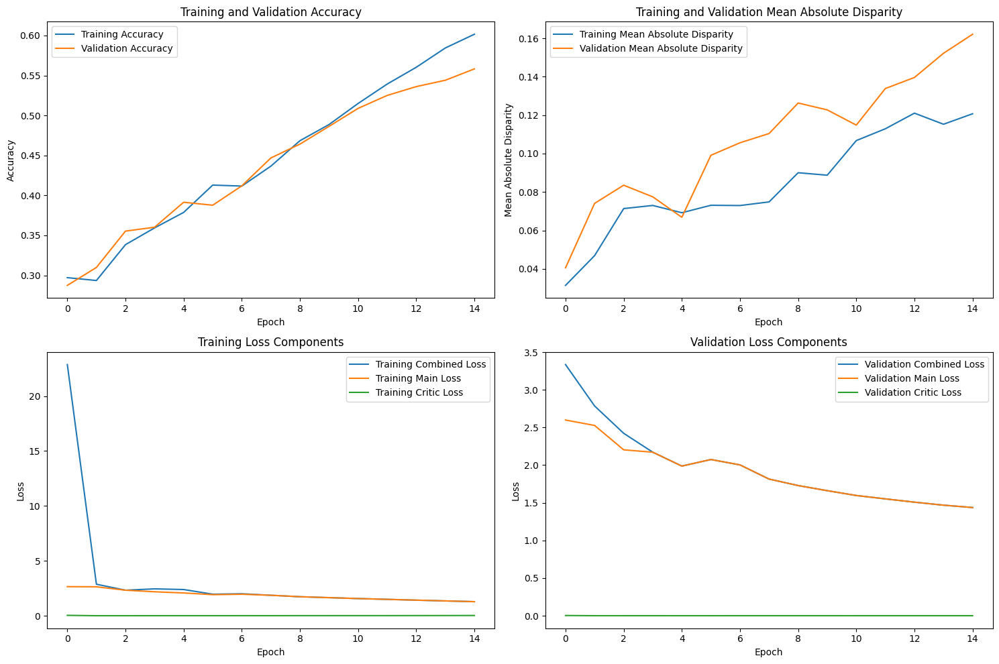

Epoch 16/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.23it/s]



Lambda 100 - Epoch 16 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.625405, VALIDATION Accuracy: 0.5751
TRAINING Disparity: 0.125834, VALIDATION Disparity: 0.1760
TRAINING Combined Loss: 1.216837, VALIDATION Combined Loss: 1.4083
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09677714181261488
Class Celebration: Val Disparity = -0.02915841584158424
Class Parade: Val Disparity = 0.08143939393939392
Class Waiter_Or_Waitress: Val Disparity = -0.17831233295150822
Class Individual_Sports: Val Disparity = -0.18125780274656678
Class Surgeons: Val Disparity = -0.3133776792313378
Class Spa: Val Disparity = -0.5625
Class Law_Enforcement: Val Disparity = 0.21384976525821603
Class Business: Val Disparity = 0.11274353241775792
Class Dresses: Val Disparity = -0.5159680638722556
Class Water_Activities: Val Disparity = 0.021396636150734505
Class Picnic: Val Disparity = -0.0915032679738561
Class Rescue: Val Disparity = -0.004

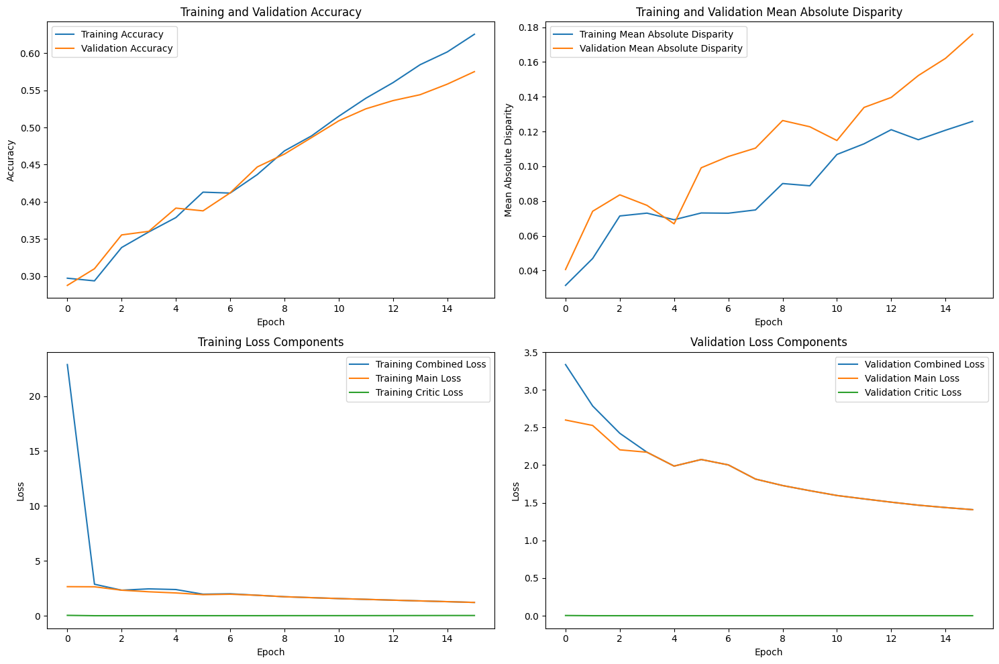

Epoch 17/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.25it/s]



Lambda 100 - Epoch 17 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.645004, VALIDATION Accuracy: 0.5765
TRAINING Disparity: 0.119792, VALIDATION Disparity: 0.1673
TRAINING Combined Loss: 1.145914, VALIDATION Combined Loss: 1.3870
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.10086712136271736
Class Celebration: Val Disparity = -0.04386138613861379
Class Parade: Val Disparity = 0.030303030303030387
Class Waiter_Or_Waitress: Val Disparity = -0.17831233295150822
Class Individual_Sports: Val Disparity = -0.20618757802746557
Class Surgeons: Val Disparity = -0.25277161862527725
Class Spa: Val Disparity = -0.6041666666666665
Class Law_Enforcement: Val Disparity = 0.21830985915492962
Class Business: Val Disparity = 0.10113914617268172
Class Dresses: Val Disparity = -0.533932135728543
Class Water_Activities: Val Disparity = 0.021396636150734727
Class Picnic: Val Disparity = -0.05228758169934633
Class Rescue: Val Disp

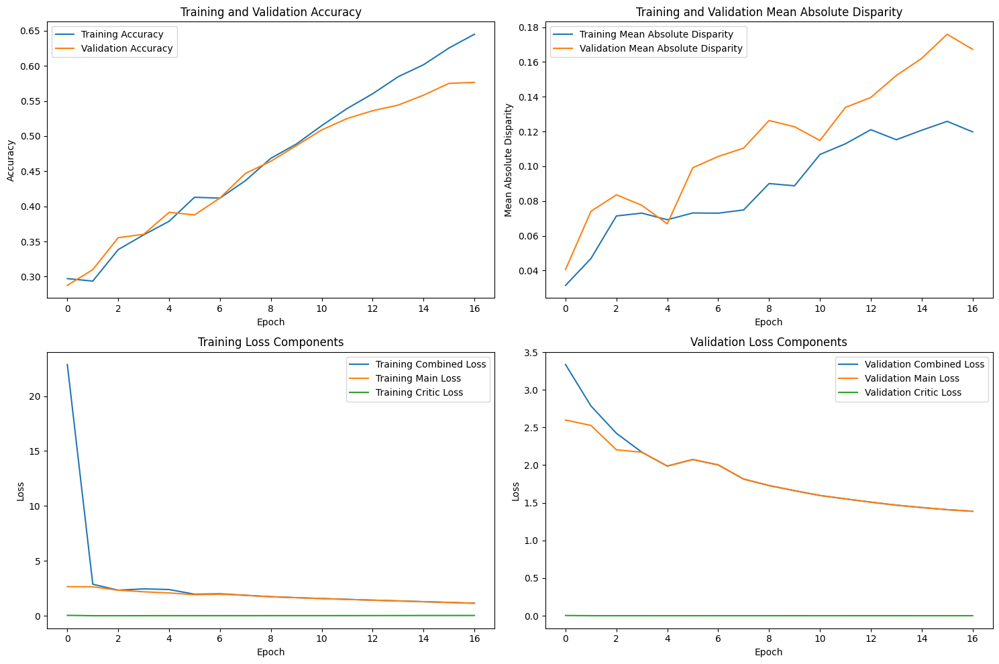

Epoch 18/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.34it/s]



Lambda 100 - Epoch 18 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.667921, VALIDATION Accuracy: 0.5896
TRAINING Disparity: 0.115299, VALIDATION Disparity: 0.1757
TRAINING Combined Loss: 1.074921, VALIDATION Combined Loss: 1.3652
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.08056574242268444
Class Celebration: Val Disparity = -0.039356435643564336
Class Parade: Val Disparity = 0.0757575757575758
Class Waiter_Or_Waitress: Val Disparity = -0.16189385261550215
Class Individual_Sports: Val Disparity = -0.20638264669163553
Class Surgeons: Val Disparity = -0.2283813747228381
Class Spa: Val Disparity = -0.6458333333333333
Class Law_Enforcement: Val Disparity = 0.14272300469483556
Class Business: Val Disparity = 0.0920898541467049
Class Dresses: Val Disparity = -0.6766467065868264
Class Water_Activities: Val Disparity = 0.02001277411113489
Class Picnic: Val Disparity = -0.05228758169934633
Class Rescue: Val Dispari

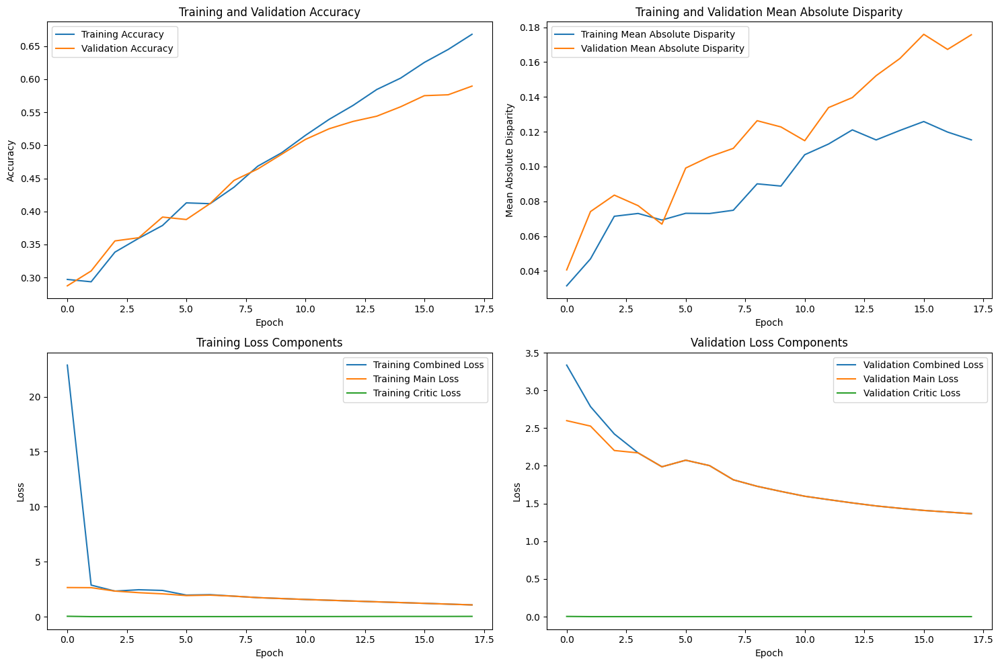

Epoch 19/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.23it/s]



Lambda 100 - Epoch 19 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.696644, VALIDATION Accuracy: 0.5907
TRAINING Disparity: 0.124809, VALIDATION Disparity: 0.1678
TRAINING Combined Loss: 0.995476, VALIDATION Combined Loss: 1.3603
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.069940935211525
Class Celebration: Val Disparity = -0.004455445544554459
Class Parade: Val Disparity = 0.07481060606060608
Class Waiter_Or_Waitress: Val Disparity = -0.18862161130202365
Class Individual_Sports: Val Disparity = -0.20025749063670406
Class Surgeons: Val Disparity = -0.1189948263118995
Class Spa: Val Disparity = -0.6458333333333334
Class Law_Enforcement: Val Disparity = 0.13309859154929593
Class Business: Val Disparity = 0.09294155221973799
Class Dresses: Val Disparity = -0.6946107784431138
Class Water_Activities: Val Disparity = 0.026825633383010472
Class Picnic: Val Disparity = -0.09150326797385622
Class Rescue: Val Dispar

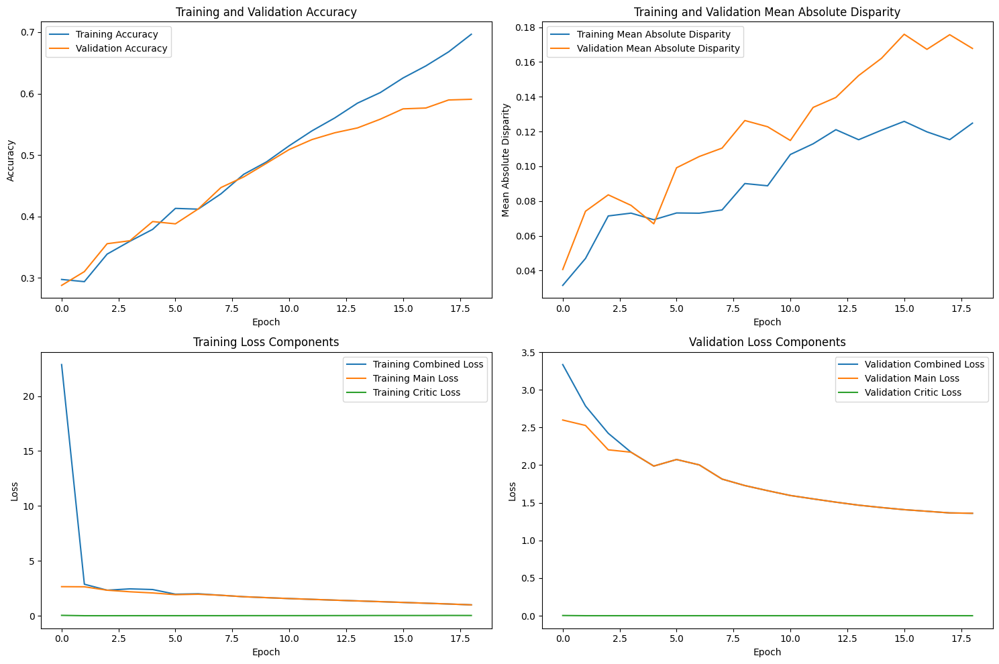

Epoch 20/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.27it/s]



Lambda 100 - Epoch 20 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.720872, VALIDATION Accuracy: 0.5987
TRAINING Disparity: 0.112727, VALIDATION Disparity: 0.1721
TRAINING Combined Loss: 0.912181, VALIDATION Combined Loss: 1.3532
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07238578332248002
Class Celebration: Val Disparity = -0.009554455445544563
Class Parade: Val Disparity = 0.06912878787878796
Class Waiter_Or_Waitress: Val Disparity = -0.1989308896525392
Class Individual_Sports: Val Disparity = -0.16900749063670417
Class Surgeons: Val Disparity = -0.16112342941611224
Class Spa: Val Disparity = -0.6666666666666666
Class Law_Enforcement: Val Disparity = 0.1568075117370893
Class Business: Val Disparity = 0.08304056212072819
Class Dresses: Val Disparity = -0.7005988023952097
Class Water_Activities: Val Disparity = 0.04939322972109861
Class Picnic: Val Disparity = -0.07189542483660127
Class Rescue: Val Dispar

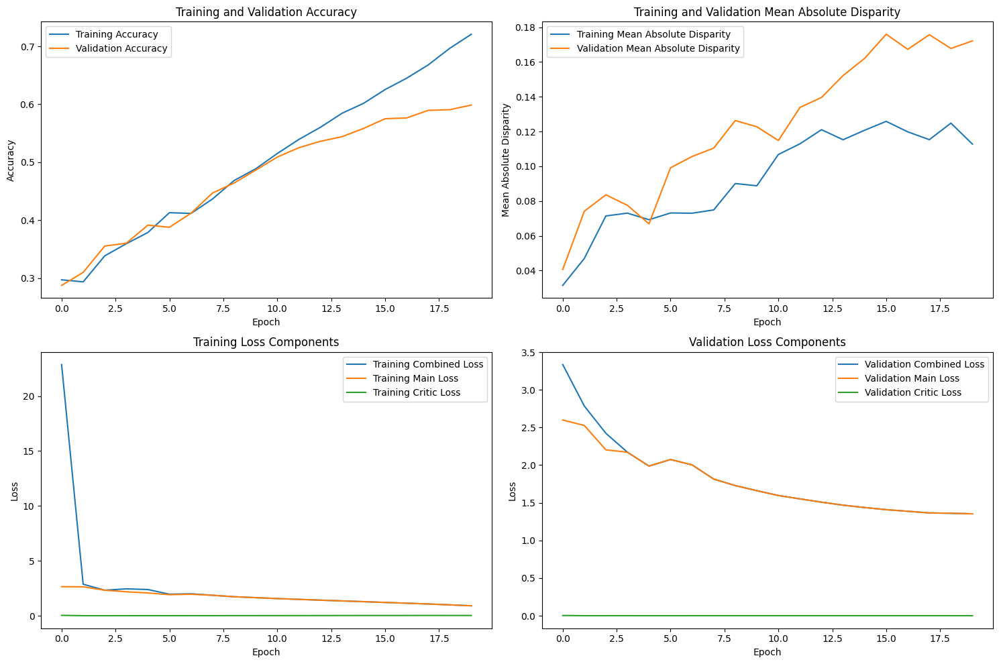

Epoch 21/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.26it/s]



Lambda 100 - Epoch 21 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.741030, VALIDATION Accuracy: 0.6006
TRAINING Disparity: 0.136943, VALIDATION Disparity: 0.1612
TRAINING Combined Loss: 0.836660, VALIDATION Combined Loss: 1.3639
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07238578332248002
Class Celebration: Val Disparity = -0.009554455445544563
Class Parade: Val Disparity = 0.06912878787878796
Class Waiter_Or_Waitress: Val Disparity = -0.1989308896525392
Class Individual_Sports: Val Disparity = -0.16900749063670417
Class Surgeons: Val Disparity = -0.16112342941611224
Class Spa: Val Disparity = -0.6666666666666666
Class Law_Enforcement: Val Disparity = 0.1568075117370893
Class Business: Val Disparity = 0.08304056212072819
Class Dresses: Val Disparity = -0.7005988023952097
Class Water_Activities: Val Disparity = 0.04939322972109861
Class Picnic: Val Disparity = -0.07189542483660127
Class Rescue: Val Dispar

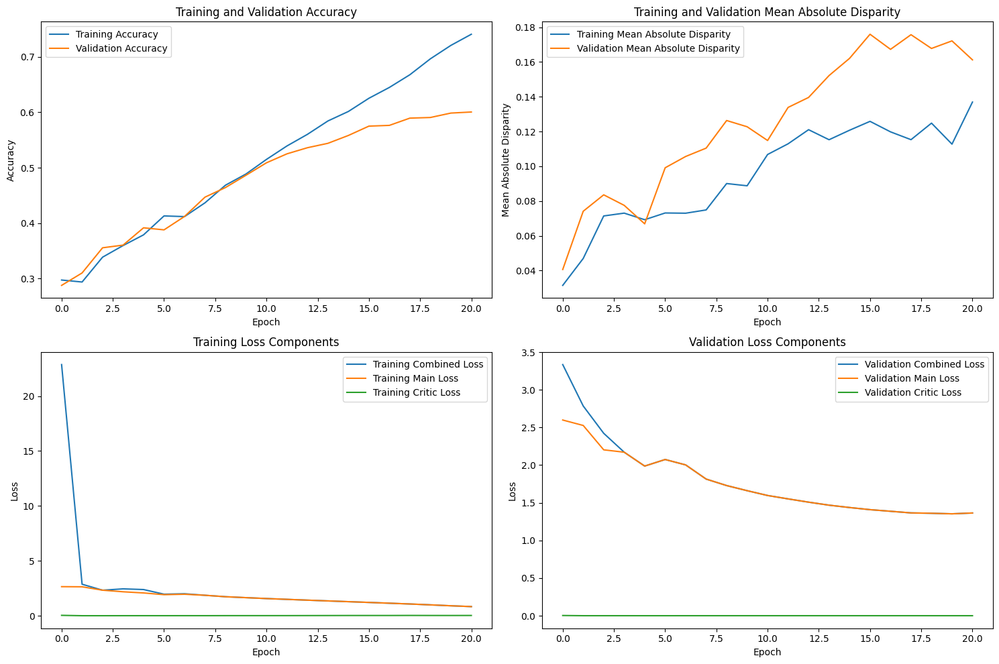

Epoch 22/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.23it/s]



Lambda 100 - Epoch 22 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.767130, VALIDATION Accuracy: 0.6012
TRAINING Disparity: 0.108098, VALIDATION Disparity: 0.1703
TRAINING Combined Loss: 0.749466, VALIDATION Combined Loss: 1.3780
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07238578332248002
Class Celebration: Val Disparity = -0.009554455445544563
Class Parade: Val Disparity = 0.06912878787878796
Class Waiter_Or_Waitress: Val Disparity = -0.1989308896525392
Class Individual_Sports: Val Disparity = -0.16900749063670417
Class Surgeons: Val Disparity = -0.16112342941611224
Class Spa: Val Disparity = -0.6666666666666666
Class Law_Enforcement: Val Disparity = 0.1568075117370893
Class Business: Val Disparity = 0.08304056212072819
Class Dresses: Val Disparity = -0.7005988023952097
Class Water_Activities: Val Disparity = 0.04939322972109861
Class Picnic: Val Disparity = -0.07189542483660127
Class Rescue: Val Dispar

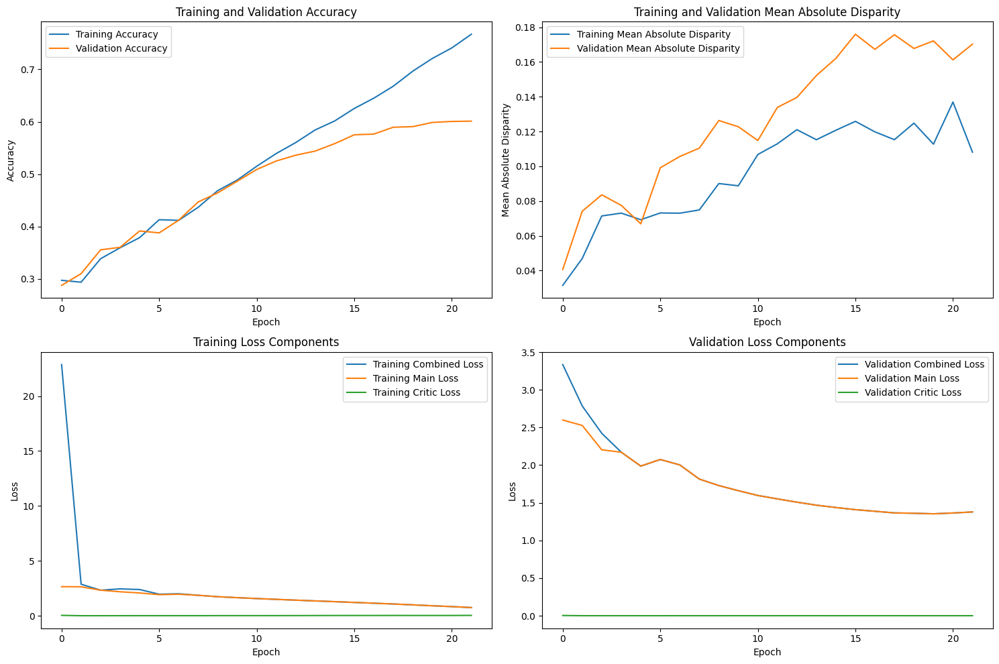

Epoch 23/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 100 - Epoch 23 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.796316, VALIDATION Accuracy: 0.5972
TRAINING Disparity: 0.103589, VALIDATION Disparity: 0.1572
TRAINING Combined Loss: 0.666689, VALIDATION Combined Loss: 1.4149
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07238578332248002
Class Celebration: Val Disparity = -0.009554455445544563
Class Parade: Val Disparity = 0.06912878787878796
Class Waiter_Or_Waitress: Val Disparity = -0.1989308896525392
Class Individual_Sports: Val Disparity = -0.16900749063670417
Class Surgeons: Val Disparity = -0.16112342941611224
Class Spa: Val Disparity = -0.6666666666666666
Class Law_Enforcement: Val Disparity = 0.1568075117370893
Class Business: Val Disparity = 0.08304056212072819
Class Dresses: Val Disparity = -0.7005988023952097
Class Water_Activities: Val Disparity = 0.04939322972109861
Class Picnic: Val Disparity = -0.07189542483660127
Class Rescue: Val Dispar

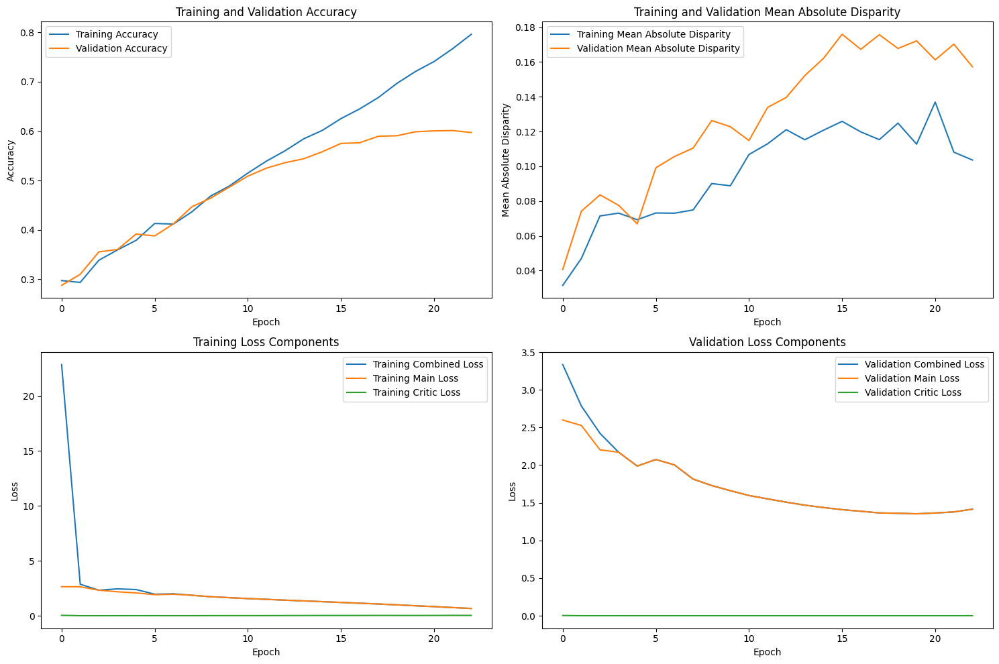

Epoch 24/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.28it/s]



Lambda 100 - Epoch 24 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.824286, VALIDATION Accuracy: 0.6018
TRAINING Disparity: 0.112979, VALIDATION Disparity: 0.1592
TRAINING Combined Loss: 0.574699, VALIDATION Combined Loss: 1.4695
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07238578332248002
Class Celebration: Val Disparity = -0.009554455445544563
Class Parade: Val Disparity = 0.06912878787878796
Class Waiter_Or_Waitress: Val Disparity = -0.1989308896525392
Class Individual_Sports: Val Disparity = -0.16900749063670417
Class Surgeons: Val Disparity = -0.16112342941611224
Class Spa: Val Disparity = -0.6666666666666666
Class Law_Enforcement: Val Disparity = 0.1568075117370893
Class Business: Val Disparity = 0.08304056212072819
Class Dresses: Val Disparity = -0.7005988023952097
Class Water_Activities: Val Disparity = 0.04939322972109861
Class Picnic: Val Disparity = -0.07189542483660127
Class Rescue: Val Dispar

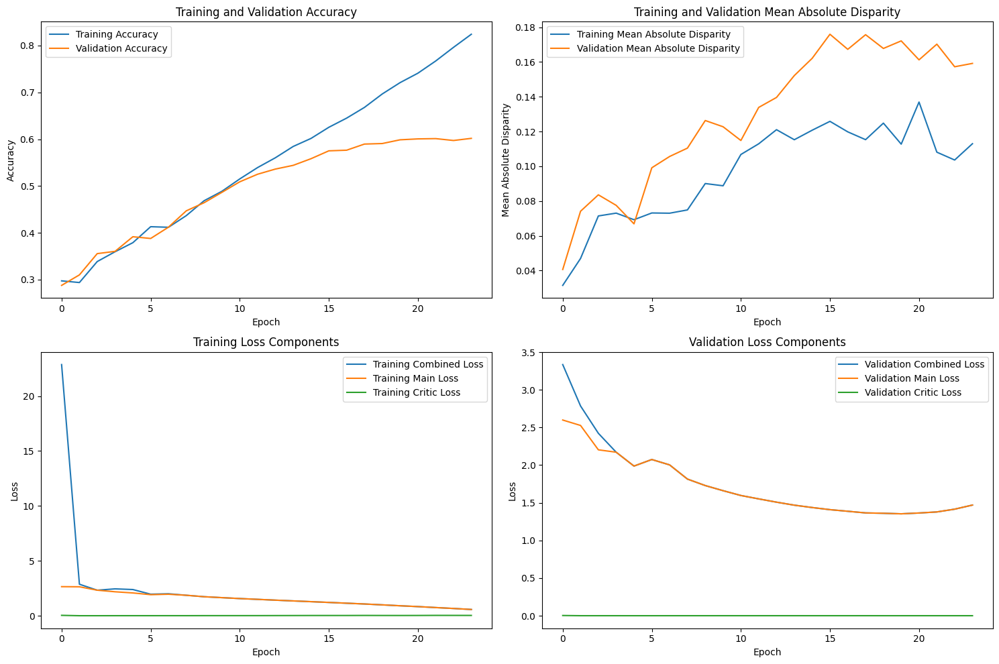

Epoch 25/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:17<00:00,  3.23it/s]



Lambda 100 - Epoch 25 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.853549, VALIDATION Accuracy: 0.5998
TRAINING Disparity: 0.085829, VALIDATION Disparity: 0.1398
TRAINING Combined Loss: 0.491642, VALIDATION Combined Loss: 1.5124
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07238578332248002
Class Celebration: Val Disparity = -0.009554455445544563
Class Parade: Val Disparity = 0.06912878787878796
Class Waiter_Or_Waitress: Val Disparity = -0.1989308896525392
Class Individual_Sports: Val Disparity = -0.16900749063670417
Class Surgeons: Val Disparity = -0.16112342941611224
Class Spa: Val Disparity = -0.6666666666666666
Class Law_Enforcement: Val Disparity = 0.1568075117370893
Class Business: Val Disparity = 0.08304056212072819
Class Dresses: Val Disparity = -0.7005988023952097
Class Water_Activities: Val Disparity = 0.04939322972109861
Class Picnic: Val Disparity = -0.07189542483660127
Class Rescue: Val Dispar

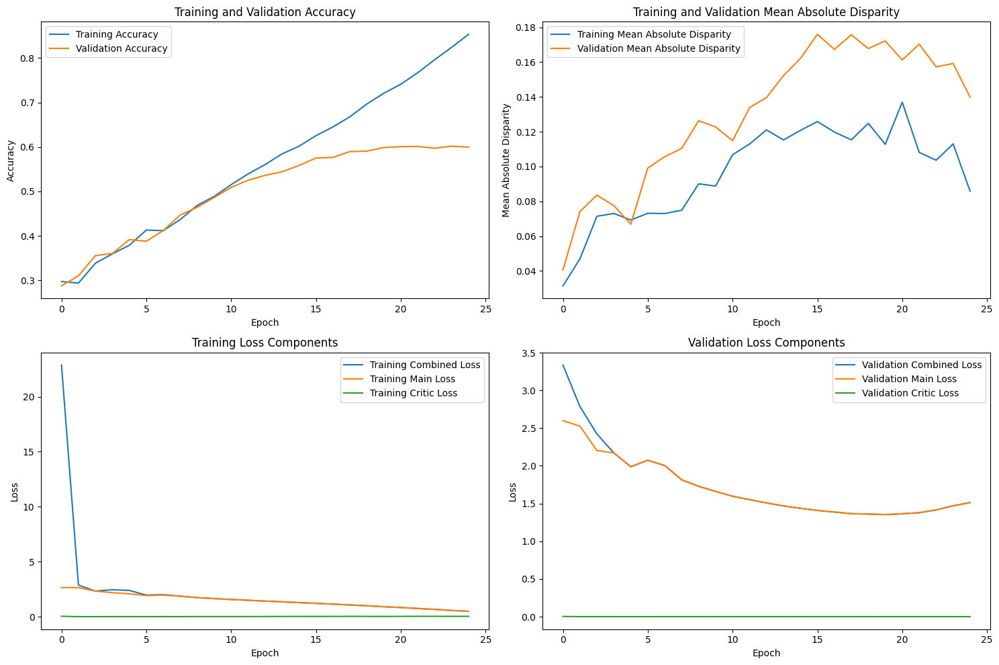

Epoch 26/200, Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:16<00:00,  3.27it/s]


Early stopping triggered at epoch 26
Finished Training with lambda value of 100. Best (stopping) epoch number: 20


In [14]:
# Create dict to store best model states
all_best_model_states = {}
base_save_dir = "Test_Dir2"

# Loop through the lambda_factor_list
for lambda_factor in lambda_factor_list:
    # Load EfficientNet B0 model
    actor = models.efficientnet_b0(pretrained=True)
    
    # Determine the number of output features from the feature extractor part of EfficientNet B0
    num_ftrs = actor.classifier[1].in_features  # This is the correct number of input features for your adversarial classifier
    
    # Modify the classifier layer of the EfficientNet model to match your number of classes
    actor.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    # Move the EfficientNet model to the GPU
    actor = actor.to(device)

    # Initialize the Critic model
    critic = Critic(input_size=16).to(device)  # Adjust the input size based on your model's output
    critic_optimizer = optim.Adam(critic.parameters(), lr=learning_rate)
    critic_loss_fn = torch.nn.MSELoss()
    
    # Redefine your main model optimizer if needed
    actor_optimizer = optim.Adam(actor.parameters(), lr=learning_rate)
    actor_loss_fn = nn.CrossEntropyLoss()

    # Train the model
    best_model_state = train_model(actor, actor_optimizer, actor_loss_fn, critic, critic_optimizer, critic_loss_fn,
                                   lambda_factor, epsilon, margin, patience, epochs, device, base_save_dir=base_save_dir)
    all_best_model_states[lambda_factor] = best_model_state

# Save the collective best model states to a file
collective_save_path = os.path.join(base_save_dir, 'all_best_model_states.pth')
torch.save(all_best_model_states, collective_save_path)


In [15]:
# load models
collective_save_path = os.path.join(base_save_dir, 'all_best_model_states.pth')

# Load the saved model states
all_best_model_states = torch.load(collective_save_path)

# Example: Accessing the best_val_accuracy for a specific lambda value
lambda_value = 50
    if lambda_value in all_best_model_states:
        best_model_state = all_best_model_states[lambda_value]
        best_val_accuracy = best_model_state['best_val_accuracy']
        print(f"Best validation accuracy for lambda {lambda_value}: {best_val_accuracy}")
    else:
        print(f"No model state found for lambda {lambda_value}")

IndentationError: unexpected indent (3113867387.py, line 9)

In [ ]:
# add plots